<table class="table table-bordered">
<tr>
<th style="text-align:center; vertical-align: middle; width:50%"><img src='https://www.np.edu.sg/images/default-source/default-album/img-logo.png'"></th>
        <th style="text-align:center;"><h1>Machine Learning</h1><h2>Assignment 1 </h2><h3>Diploma in Data Science</h3></th>
    </tr>
</table>

## Contents

#### 1. [HR Analytics](#part1)
   - [1.1 Load and Explore the Data](#part1.1)  
   - [1.2 Cleanse and Transform the data](#part1.2)
   - [1.3 Correlation Analysis](#part1.3)
   - [1.4 Export the data](#part1.4)
   
#### 2. [AirBnb](#part2)
   - [2.1 Load and Explore the Data](#part2.1)  
   - [2.2 Cleanse and Transform the data](#part2.2)
   - [2.3 Correlation Analysis](#part2.3)
   - [2.4 Export the data](#part2.4)

In [1]:
# import the required packages
import pandas as pd
import numpy as np

# packages for visuals
import matplotlib.pyplot as plt
%matplotlib inline
from scipy.stats import norm
import seaborn as sns


## 1. HR Analytics  <a id="part1"></a>

HR analytics is revolutionizing the way human resources departments operate, leading to higher efficiency and better results overall. Human resources have been using analytics for years. However, the collection, processing and analysis of data has been largely manual, and given the nature of human resources dynamics and HR KPIs, the approach has been constraining HR. Here is an opportunity to try applying machine learning modelling in identifying the employees most likely to get promoted.

### 1.1 `Load and Explore the data`  <a id="part1.1"></a> 

Variable Study:
- .info
- missing value 
- nulls
- categories 
- interesting features/relationships

Done using statistical and visualisation approaches.

In [2]:
# Load Data
missing_values = [" "] #to identify missing values
hr = pd.read_csv('hr_data.csv', na_values = missing_values)

# Create a copy of the DataFrame
hr_new = hr.copy()

# Show overview of the dataset
hr_new.head()

,employee_id,department,region,education,gender,recruitment_channel,no_of_trainings,age,previous_year_rating,length_of_service,KPIs_met >80%,awards_won?,avg_training_score,is_promoted
0,65438,Sales & Marketing,region_7,Master's & above,f,sourcing,1,35,5.0,8,1,0,49,0
1,65141,Operations,region_22,Bachelor's,m,other,1,30,5.0,4,0,0,60,0
2,7513,Sales & Marketing,region_19,Bachelor's,m,sourcing,1,34,3.0,7,0,0,50,0
3,2542,Sales & Marketing,region_23,Bachelor's,m,other,2,39,1.0,10,0,0,50,0
4,48945,Technology,region_26,Bachelor's,m,other,1,45,3.0,2,0,0,73,0


In [3]:
hr_new.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 54808 entries, 0 to 54807
Data columns (total 14 columns):
 #   Column                Non-Null Count  Dtype  
---  ------                --------------  -----  
 0   employee_id           54808 non-null  int64  
 1   department            54808 non-null  object 
 2   region                54808 non-null  object 
 3   education             52399 non-null  object 
 4   gender                54808 non-null  object 
 5   recruitment_channel   54808 non-null  object 
 6   no_of_trainings       54808 non-null  int64  
 7   age                   54808 non-null  int64  
 8   previous_year_rating  50684 non-null  float64
 9   length_of_service     54808 non-null  int64  
 10  KPIs_met >80%         54808 non-null  int64  
 11  awards_won?           54808 non-null  int64  
 12  avg_training_score    54808 non-null  int64  
 13  is_promoted           54808 non-null  int64  
dtypes: float64(1), int64(8), object(5)
memory usage: 5.9+ MB


In [4]:
hr_new.shape

(54808, 14)

In [5]:
print("The number of duplicated rows in the dataset is", hr_new.duplicated().sum())

The number of duplicated rows in the dataset is 0


There are no duplicated rows, indicating that all employee are unique. The absence of duplicated rows in the dataset, signifying that all employees are unique, is crucial for  the accuracy and reliability of the dataset. Duplicated rows could introduce errors and inaccuracies in analysis.

In [6]:
hr_new.columns

Index(['employee_id', 'department', 'region', 'education', 'gender',
       'recruitment_channel', 'no_of_trainings', 'age', 'previous_year_rating',
       'length_of_service', 'KPIs_met >80%', 'awards_won?',
       'avg_training_score', 'is_promoted'],
      dtype='object')

In [7]:
hr_new.describe()

#quick overview

,employee_id,no_of_trainings,age,previous_year_rating,length_of_service,KPIs_met >80%,awards_won?,avg_training_score,is_promoted
count,54808.000000,54808.000000,54808.000000,50684.000000,54808.000000,54808.000000,54808.000000,54808.000000,54808.000000
mean,39195.830627,1.253011,34.803915,3.329256,5.865512,0.351974,0.023172,63.386750,0.085170
std,22586.581449,0.609264,7.660169,1.259993,4.265094,0.477590,0.150450,13.371559,0.279137
min,1.000000,1.000000,20.000000,1.000000,1.000000,0.000000,0.000000,39.000000,0.000000
25%,19669.750000,1.000000,29.000000,3.000000,3.000000,0.000000,0.000000,51.000000,0.000000
50%,39225.500000,1.000000,33.000000,3.000000,5.000000,0.000000,0.000000,60.000000,0.000000
75%,58730.500000,1.000000,39.000000,4.000000,7.000000,1.000000,0.000000,76.000000,0.000000
max,78298.000000,10.000000,60.000000,5.000000,37.000000,1.000000,1.000000,99.000000,1.000000


In [8]:
hr_new.corr()

#quick overview

,employee_id,no_of_trainings,age,previous_year_rating,length_of_service,KPIs_met >80%,awards_won?,avg_training_score,is_promoted
employee_id,1.000000,-0.005121,0.000437,0.004533,0.001274,-0.002501,0.008420,-0.000586,0.001206
no_of_trainings,-0.005121,1.000000,-0.081278,-0.063126,-0.057275,-0.045576,-0.007628,0.042517,-0.024896
age,0.000437,-0.081278,1.000000,0.006008,0.657111,-0.025592,-0.008169,-0.048380,-0.017166
previous_year_rating,0.004533,-0.063126,0.006008,1.000000,0.000253,0.351578,0.027738,0.075139,0.159320
length_of_service,0.001274,-0.057275,0.657111,0.000253,1.000000,-0.077693,-0.039927,-0.038122,-0.010670
KPIs_met >80%,-0.002501,-0.045576,-0.025592,0.351578,-0.077693,1.000000,0.097000,0.078391,0.221582
awards_won?,0.008420,-0.007628,-0.008169,0.027738,-0.039927,0.097000,1.000000,0.072138,0.195871
avg_training_score,-0.000586,0.042517,-0.048380,0.075139,-0.038122,0.078391,0.072138,1.000000,0.181147
is_promoted,0.001206,-0.024896,-0.017166,0.159320,-0.010670,0.221582,0.195871,0.181147,1.000000


In [9]:
hr_new.nunique()

#unique data in each category

employee_id             54808
department                  9
region                     34
education                   3
gender                      2
recruitment_channel         3
no_of_trainings            10
age                        41
previous_year_rating        5
length_of_service          35
KPIs_met >80%               2
awards_won?                 2
avg_training_score         61
is_promoted                 2
dtype: int64

#### Checking Null Values

In [10]:
# Check for null values
hr_new.isnull().sum()

#education is text
#prev_year_rating is ordinal

employee_id                0
department                 0
region                     0
education               2409
gender                     0
recruitment_channel        0
no_of_trainings            0
age                        0
previous_year_rating    4124
length_of_service          0
KPIs_met >80%              0
awards_won?                0
avg_training_score         0
is_promoted                0
dtype: int64

In [11]:
# View unique titles of education and how many NA values we have in this feature
hr_new['education'].value_counts(dropna=False)

Bachelor's          36669
Master's & above    14925
NaN                  2409
Below Secondary       805
Name: education, dtype: int64

In [12]:
# View unique titles of previous_year_rating and how many NA values we have in this feature
hr_new['previous_year_rating'].value_counts(dropna=False)

3.0    18618
5.0    11741
4.0     9877
1.0     6223
2.0     4225
NaN     4124
Name: previous_year_rating, dtype: int64

#### Checking Unique Values

In [13]:
hr_new.columns

Index(['employee_id', 'department', 'region', 'education', 'gender',
       'recruitment_channel', 'no_of_trainings', 'age', 'previous_year_rating',
       'length_of_service', 'KPIs_met >80%', 'awards_won?',
       'avg_training_score', 'is_promoted'],
      dtype='object')

In [14]:
# The categorical variables and each of its unique values
count = 0
categorical_features = []
for col in hr_new.select_dtypes(include='object').columns:
    categorical_features.append(col)
    count+=1
    print(count, col, "-", hr_new[col].unique())
    print()

1 department - ['Sales & Marketing' 'Operations' 'Technology' 'Analytics' 'R&D'
 'Procurement' 'Finance' 'HR' 'Legal']

2 region - ['region_7' 'region_22' 'region_19' 'region_23' 'region_26' 'region_2'
 'region_20' 'region_34' 'region_1' 'region_4' 'region_29' 'region_31'
 'region_15' 'region_14' 'region_11' 'region_5' 'region_28' 'region_17'
 'region_13' 'region_16' 'region_25' 'region_10' 'region_27' 'region_30'
 'region_12' 'region_21' 'region_8' 'region_32' 'region_6' 'region_33'
 'region_24' 'region_3' 'region_9' 'region_18']

3 education - ["Master's & above" "Bachelor's" nan 'Below Secondary']

4 gender - ['f' 'm']

5 recruitment_channel - ['sourcing' 'other' 'referred']



In [15]:
hr_new['department'].value_counts(dropna=False)

Sales & Marketing    16840
Operations           11348
Technology            7138
Procurement           7138
Analytics             5352
Finance               2536
HR                    2418
Legal                 1039
R&D                    999
Name: department, dtype: int64

In [16]:
hr_new['region'].value_counts(dropna=False)

region_2     12343
region_22     6428
region_7      4843
region_15     2808
region_13     2648
region_26     2260
region_31     1935
region_4      1703
region_27     1659
region_16     1465
region_28     1318
region_11     1315
region_23     1175
region_29      994
region_32      945
region_19      874
region_20      850
region_14      827
region_25      819
region_17      796
region_5       766
region_6       690
region_30      657
region_8       655
region_10      648
region_1       610
region_24      508
region_12      500
region_9       420
region_21      411
region_3       346
region_34      292
region_33      269
region_18       31
Name: region, dtype: int64

In [17]:
hr_new['gender'].value_counts(dropna=False)

m    38496
f    16312
Name: gender, dtype: int64

In [18]:
hr_new['recruitment_channel'].value_counts(dropna=False)

other       30446
sourcing    23220
referred     1142
Name: recruitment_channel, dtype: int64

In [19]:
hr_new['no_of_trainings'].value_counts(dropna=False)

1     44378
2      7987
3      1776
4       468
5       128
6        44
7        12
8         5
10        5
9         5
Name: no_of_trainings, dtype: int64

In [20]:
hr_new['age'].value_counts(dropna=False)

30    3665
32    3534
31    3534
29    3405
33    3210
28    3147
34    3076
27    2827
35    2711
36    2517
37    2165
26    2060
38    1923
39    1695
40    1663
25    1299
41    1289
42    1149
43     992
44     847
24     845
45     760
46     697
48     557
47     557
50     521
49     441
23     428
51     389
53     364
52     351
54     313
55     294
56     264
57     238
22     231
60     217
58     213
59     209
20     113
21      98
Name: age, dtype: int64

In [21]:
hr_new['length_of_service'].value_counts(dropna=False)

3     7033
4     6836
2     6684
5     5832
7     5551
6     4734
1     4547
8     2883
9     2629
10    2193
11     916
12     794
13     687
15     593
14     549
16     548
17     432
18     392
19     329
20     128
21      78
24      70
23      65
22      61
25      51
26      41
27      36
28      30
29      30
31      20
30      12
32      10
33       9
34       4
37       1
Name: length_of_service, dtype: int64

In [22]:
hr_new['avg_training_score'].value_counts(dropna=False)

50    2716
49    2681
48    2437
51    2347
60    2155
      ... 
98      37
99      35
41      26
40       5
39       2
Name: avg_training_score, Length: 61, dtype: int64

Here, I am checking to see if there is any value that does not make sense and should not be there and to explore the unique values. I am also looking to see if I can combine smaller groups together. It is also a form of exploratory data analysis. After checking through, there were no unreasonable values and I am now ready to further analyse the data using visual and statistical approaches, to search for unanticipated trends and anomalies to gain more understanding and ideas.

### Numeric Data

In [23]:
hr_new.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 54808 entries, 0 to 54807
Data columns (total 14 columns):
 #   Column                Non-Null Count  Dtype  
---  ------                --------------  -----  
 0   employee_id           54808 non-null  int64  
 1   department            54808 non-null  object 
 2   region                54808 non-null  object 
 3   education             52399 non-null  object 
 4   gender                54808 non-null  object 
 5   recruitment_channel   54808 non-null  object 
 6   no_of_trainings       54808 non-null  int64  
 7   age                   54808 non-null  int64  
 8   previous_year_rating  50684 non-null  float64
 9   length_of_service     54808 non-null  int64  
 10  KPIs_met >80%         54808 non-null  int64  
 11  awards_won?           54808 non-null  int64  
 12  avg_training_score    54808 non-null  int64  
 13  is_promoted           54808 non-null  int64  
dtypes: float64(1), int64(8), object(5)
memory usage: 5.9+ MB


In [24]:
hr_num = hr_new[['no_of_trainings', 'age',
                 'length_of_service',
                 'avg_training_score']].copy()
hr_num.head()

#numerical features, excluding ordinal feature, 'previous year rating'

,no_of_trainings,age,length_of_service,avg_training_score
0,1,35,8,49
1,1,30,4,60
2,1,34,7,50
3,2,39,10,50
4,1,45,2,73


The previous_year_rating feature with values 1, 2, 3, 4, 5 is typically considered categorical, even though the values are numbers. The reason is that the numerical values in this context represent discrete categories or levels, not a continuous scale. Each numerical value corresponds to a specific category or rating level.

In the case of previous_year_rating, the values have a clear order, with 5 being higher than 4, and so on. Therefore, previous_year_rating is an ordinal categorical variable.

#### Shape and Distribution

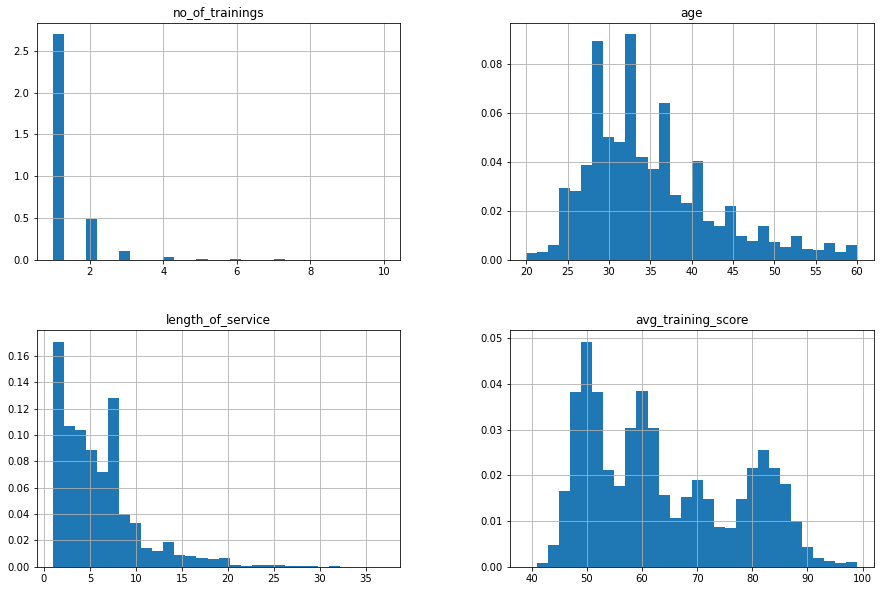

In [25]:
hr_num.hist(bins=30, figsize=(15,10), density=True)
plt.show()

In [26]:
from scipy.stats import skew
import numpy as np

# Calculate and print standard deviation and skewness for each numerical column
for column in hr_num.columns:
    print(f"Column: {column}")
    print('Std: ', np.std(hr_num[column]))
    print('Skew: ', skew(hr_num[column]))
    print()

Column: no_of_trainings
Std:  0.609258459456442
Skew:  3.445339641293249

Column: age
Std:  7.660099319414098
Skew:  1.0074041991665104

Column: length_of_service
Std:  4.265055270096116
Skew:  1.7380138906484088

Column: avg_training_score
Std:  13.371437512598051
Skew:  0.4518957174817265



Based on the standard deviation (Std) and skewness values provided for each variable, you can make comments regarding the histograms of these four variables:

**no_of_trainings:**
   - **Comments:**
     - The 'no_of_trainings' variable has a relatively low standard deviation of approximately 0.61, indicating limited variability in the number of trainings.
     - The positively skewed distribution with a skewness of 3.45 suggests that the majority of employees have undergone a small number of trainings, with a long tail towards employees with higher numbers of trainings.
     - The histogram may show a concentration of bars on the left side, with a few bars extending to the right, indicating a right-skewed distribution.

**age:**
   - **Comments:**
     - The 'age' variable has a moderate standard deviation of around 7.66, indicating some variability in the ages of employees.
     - The skewness of approximately 1.01 suggests a slightly right-skewed distribution, meaning that there may be a concentration of younger employees with a few older employees.
     - The histogram may exhibit a tail to the right, indicating that a few employees are older than the average age.

**length_of_service:**
   - **Comments:**
     - The 'length_of_service' variable has a moderate standard deviation of approximately 4.27, indicating variability in the length of service among employees.
     - The skewness of approximately 1.74 indicates a right-skewed distribution, suggesting that there might be a concentration of employees with shorter service lengths and a few with longer service lengths.
     - The histogram may show a right-leaning shape with a tail to the right.

**avg_training_score:**
   - **Comments:**
     - The 'avg_training_score' variable has a relatively high standard deviation of about 13.37, suggesting considerable variability in the average training scores.
     - The skewness of approximately 0.45 indicates a slightly right-skewed distribution, implying that most employees have average training scores, but there might be a few with higher scores.
     - The histogram may show a more symmetric distribution, with a concentration of bars around the average training score.

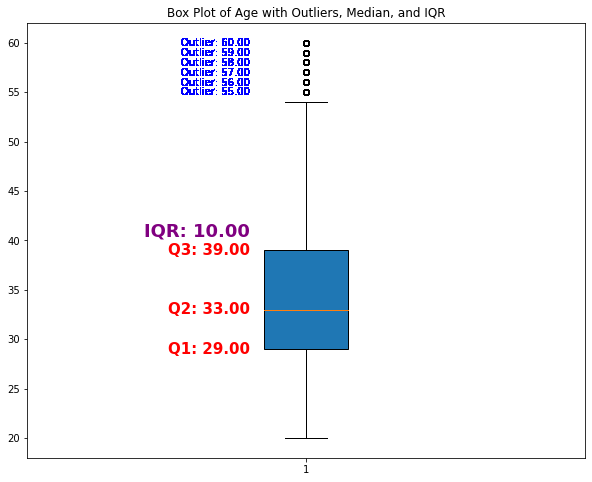

count    54808.000000
mean        34.803915
std          7.660169
min         20.000000
25%         29.000000
50%         33.000000
75%         39.000000
max         60.000000
Name: age, dtype: float64

In [27]:
# Set plot size
plt.figure(figsize=(10, 8))

# Create a boxplot with outliers shown
boxplot = plt.boxplot(hr_num['age'], showfliers=True, patch_artist=True)

# Add annotations for quartiles
quartiles = hr_num['age'].quantile([0.25, 0.5, 0.75])
for i, quartile in enumerate(quartiles):
    plt.text(0.9, quartile, f'Q{i + 1}: {quartile:.2f}', ha='right', va='center', color='red', fontweight='bold', fontsize=15)

# Calculate and add annotation for interquartile range (IQR)
iqr = quartiles[0.75] - quartiles[0.25]
plt.text(0.9, quartiles[0.75] + 0.1 * iqr, f'IQR: {iqr:.2f}', ha='right', va='bottom', color='purple',
         fontweight='bold', fontsize=18)

# Add annotations for outliers
outliers = hr_num[(hr_num['age'] < quartiles[0.25] - 1.5 * iqr) |
                  (hr_num['age'] > quartiles[0.75] + 1.5 * iqr)]['age']
for outlier in outliers:
    plt.text(0.9, outlier, f'Outlier: {outlier:.2f}', ha='right', va='center', color='blue')

# Set plot title
plt.title('Box Plot of Age with Outliers, Median, and IQR')

# Show the plot
plt.show()
hr_num['age'].describe()

In [28]:
# Q1 = 29; Q3 = 39; IQR = Q3 - Q1 = 10
# Median = Q2 = 33
# "Maximum" = Q3 + 1.5 * IQR = 39 + 1.5* 10 = 54
# "Minimum" = Q1 - 1.5 * IQR = 29 - 1.5* 10 = 14
# Outliers are the passengers with age above 54. 

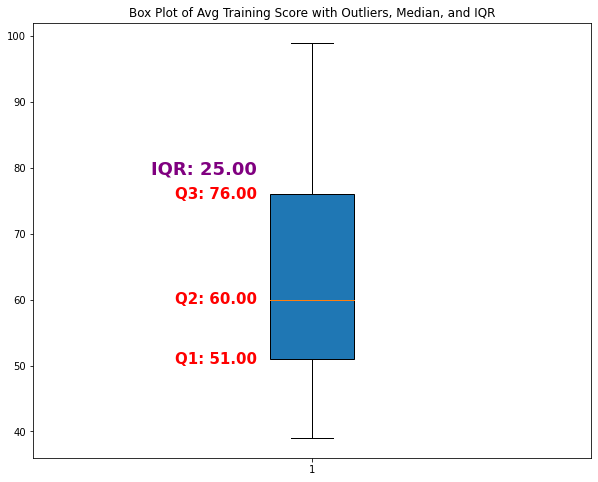

count    54808.000000
mean        63.386750
std         13.371559
min         39.000000
25%         51.000000
50%         60.000000
75%         76.000000
max         99.000000
Name: avg_training_score, dtype: float64

In [29]:
# Set plot size
plt.figure(figsize=(10, 8))

# Create a boxplot with outliers shown
boxplot = plt.boxplot(hr_num['avg_training_score'], showfliers=True, patch_artist=True)

# Add annotations for quartiles
quartiles = hr_num['avg_training_score'].quantile([0.25, 0.5, 0.75])
for i, quartile in enumerate(quartiles):
    plt.text(0.9, quartile, f'Q{i + 1}: {quartile:.2f}', ha='right', va='center', color='red', fontweight='bold', fontsize=15)

# Calculate and add annotation for interquartile range (IQR)
iqr = quartiles[0.75] - quartiles[0.25]
plt.text(0.9, quartiles[0.75] + 0.1 * iqr, f'IQR: {iqr:.2f}', ha='right', va='bottom', color='purple',
         fontweight='bold', fontsize=18)

# Add annotations for outliers
outliers = hr_num[(hr_num['avg_training_score'] < quartiles[0.25] - 1.5 * iqr) |
                  (hr_num['avg_training_score'] > quartiles[0.75] + 1.5 * iqr)]['avg_training_score']
for outlier in outliers:
    plt.text(0.9, outlier, f'Outlier: {outlier:.2f}', ha='right', va='center', color='blue')

# Set plot title
plt.title('Box Plot of Avg Training Score with Outliers, Median, and IQR')

# Show the plot
plt.show()
hr_num['avg_training_score'].describe()

In [30]:
# Q1 = 51; Q3 = 76; IQR = Q3 - Q1 = 25
# Median = Q2 = 60
# "Maximum" = Q3 + 1.5 * IQR =  113.5
# "Minimum" = Q1 - 1.5 * IQR = 13.5
# There are no outliers in avg_training_score

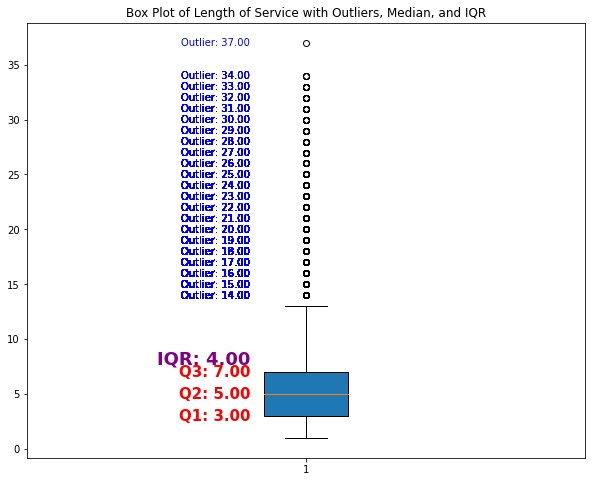

count    54808.000000
mean         5.865512
std          4.265094
min          1.000000
25%          3.000000
50%          5.000000
75%          7.000000
max         37.000000
Name: length_of_service, dtype: float64

In [31]:
# Set plot size
plt.figure(figsize=(10, 8))

# Create a boxplot with outliers shown
boxplot = plt.boxplot(hr_num['length_of_service'], showfliers=True, patch_artist=True)

# Add annotations for quartiles
quartiles = hr_num['length_of_service'].quantile([0.25, 0.5, 0.75])
for i, quartile in enumerate(quartiles):
    plt.text(0.9, quartile, f'Q{i + 1}: {quartile:.2f}', ha='right', va='center', color='red', fontweight='bold', fontsize=15)

# Calculate and add annotation for interquartile range (IQR)
iqr = quartiles[0.75] - quartiles[0.25]
plt.text(0.9, quartiles[0.75] + 0.1 * iqr, f'IQR: {iqr:.2f}', ha='right', va='bottom', color='purple',
         fontweight='bold', fontsize=18)

# Add annotations for outliers
outliers = hr_num[(hr_num['length_of_service'] < quartiles[0.25] - 1.5 * iqr) |
                  (hr_num['length_of_service'] > quartiles[0.75] + 1.5 * iqr)]['length_of_service']
for outlier in outliers:
    plt.text(0.9, outlier, f'Outlier: {outlier:.2f}', ha='right', va='center', color='blue')

# Set plot title
plt.title('Box Plot of Length of Service with Outliers, Median, and IQR')

# Show the plot
plt.show()
hr_num['length_of_service'].describe()

In [32]:
# Q1 = 3; Q3 = 7; IQR = Q3 - Q1 = 4
# Median = Q2 = 5
# "Maximum" = Q3 + 1.5 * IQR = 13
# "Minimum" = Q1 - 1.5 * IQR = -3
# Outliers are the length above 13

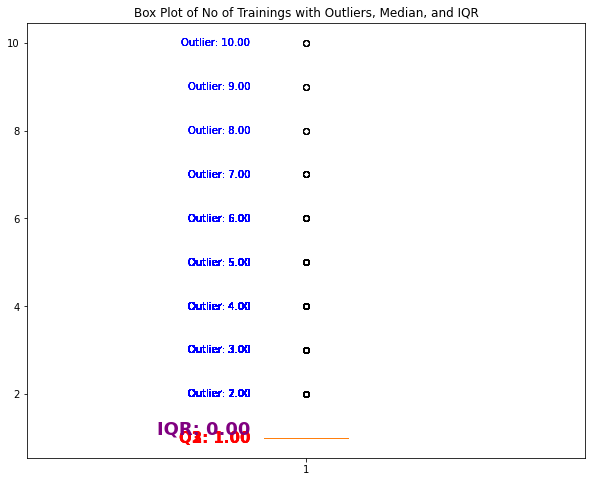

count    54808.000000
mean         1.253011
std          0.609264
min          1.000000
25%          1.000000
50%          1.000000
75%          1.000000
max         10.000000
Name: no_of_trainings, dtype: float64

In [33]:
# Set plot size
plt.figure(figsize=(10, 8))

# Create a boxplot with outliers shown
boxplot = plt.boxplot(hr_num['no_of_trainings'], showfliers=True, patch_artist=True)

# Add annotations for quartiles
quartiles = hr_num['no_of_trainings'].quantile([0.25, 0.5, 0.75])
for i, quartile in enumerate(quartiles):
    plt.text(0.9, quartile, f'Q{i + 1}: {quartile:.2f}', ha='right', va='center', color='red', fontweight='bold', fontsize=15)

# Calculate and add annotation for interquartile range (IQR)
iqr = quartiles[0.75] - quartiles[0.25]
plt.text(0.9, quartiles[0.75] + 0.1 * iqr, f'IQR: {iqr:.2f}', ha='right', va='bottom', color='purple',
         fontweight='bold', fontsize=18)

# Add annotations for outliers
outliers = hr_num[(hr_num['no_of_trainings'] < quartiles[0.25] - 1.5 * iqr) |
                  (hr_num['no_of_trainings'] > quartiles[0.75] + 1.5 * iqr)]['no_of_trainings']
for outlier in outliers:
    plt.text(0.9, outlier, f'Outlier: {outlier:.2f}', ha='right', va='center', color='blue')

# Set plot title
plt.title('Box Plot of No of Trainings with Outliers, Median, and IQR')

# Show the plot
plt.show()
hr_num['no_of_trainings'].describe()

In [34]:
# Q1 = 1; Q3 = 1; IQR = Q3 - Q1 = 0
# Median = Q2 = 1
# "Maximum" = Q3 + 1.5 * IQR = 1
# "Minimum" = Q1 - 1.5 * IQR = 1
# Outliers are the numbers above 1.

Even though there are 'outliers', this feature would not go through outlier handling as values falling within the range of 1-10 are regarded as intrinsic to the typical training patterns exhibited by employees in the dataset, rather than outliers. This decision is guided by the positively skewed distribution of 'no_of_trainings,' signifying that the majority of employees undergo a limited number of training sessions, while a tail extends towards a minority with higher counts.

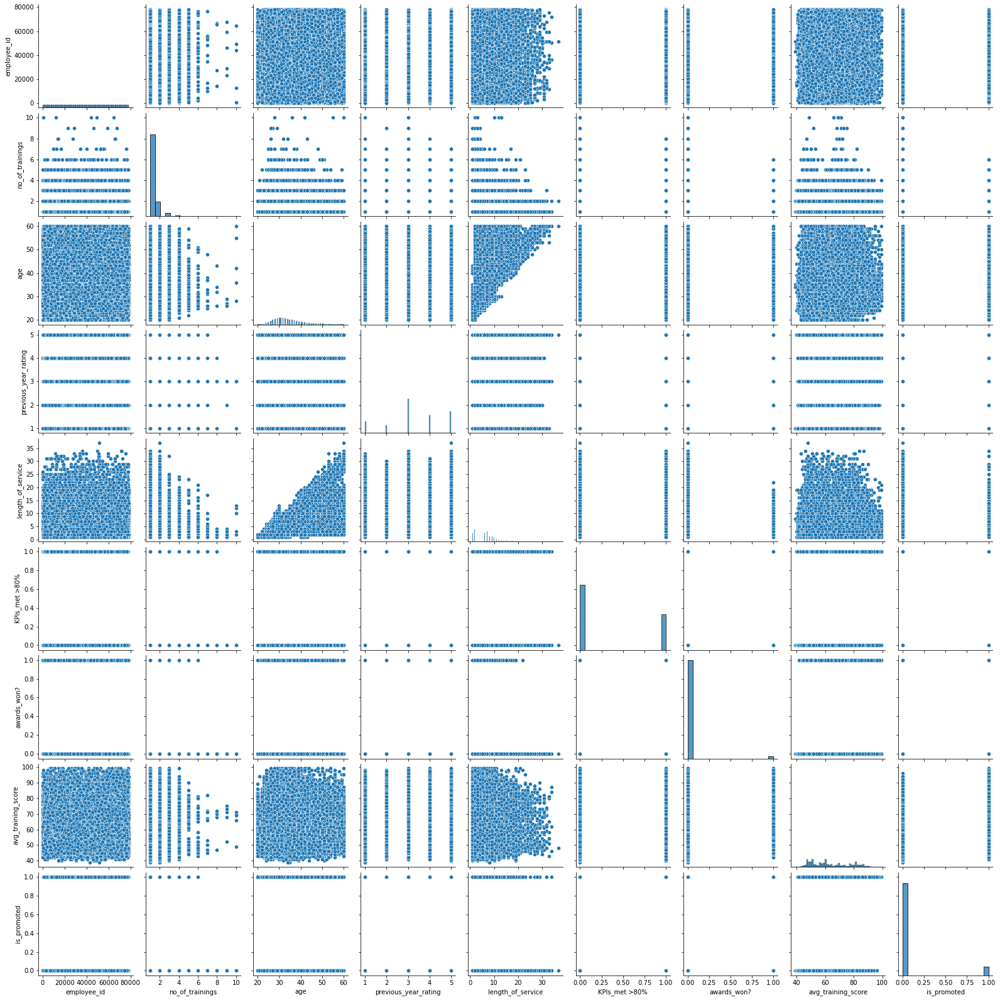

In [35]:
# PAIRPLOT
sns.pairplot(hr_new)

<AxesSubplot:>

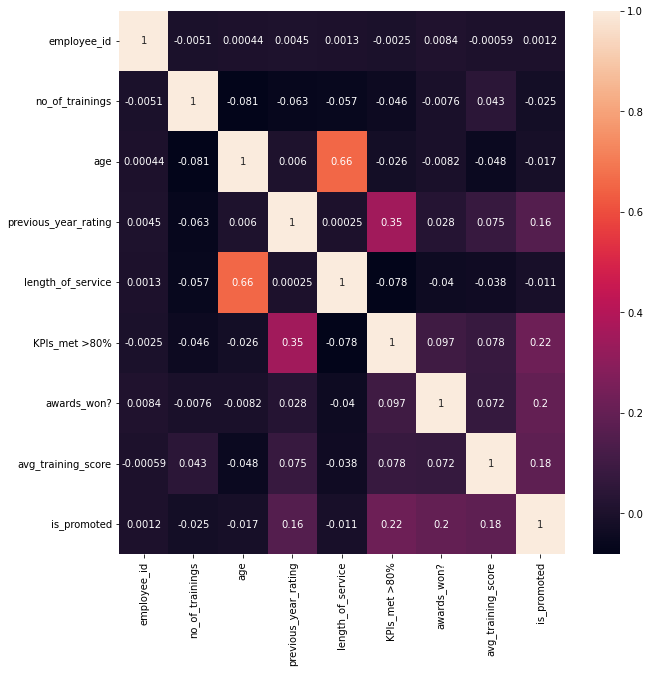

In [36]:
f,ax=plt.subplots(figsize=(10,10))
sns.heatmap(hr_new.corr(),annot=True)

The heat map only provides information on the correlation for columns with numerical values. This shows that the variables that have the highest correlation ( avaue close to 1 or -1, 1 if positively correlated. -1 if negatively correlated) are the age columns, previous year rating columns, length of service columns, and KPIs_met>80%. Hence, I will be diving deeper into these few columns. 

Additionally, it seems that not alot of these categorical has high or moderately high correlation with our predictive target, 'is_promoted', so I will be exploring how the categorical features affect the promotion.

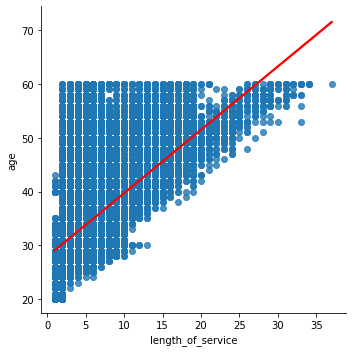

In [37]:
sns.lmplot(x='length_of_service', y='age', data=hr_new, line_kws={'color': 'red'})
plt.show()  # Display the plot

The longer the service, the older they are. This is not surprising as people get older the longer they work, causing these features to have a strong positive correlation.

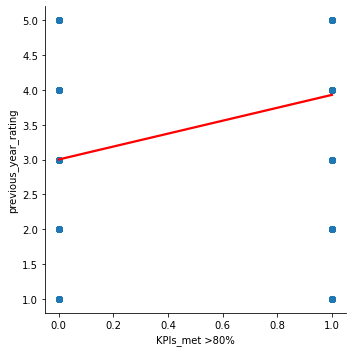

In [38]:
sns.lmplot(x='KPIs_met >80%', y='previous_year_rating', data=hr_new, line_kws={'color': 'red'})
plt.show()  # Display the plot

This correlation may suggest that employees who have KPI above 80% have a higher rating in the previous year, where employees who did not meet >80% (for their KPI) obtained 3.0 for their previous year rating, and employees who have met the expected KPI obtaned a 4.0 for their previous year rating. 

This can be expected in the real world context as employees with better KPI would tend to have better rating, due to their performance results. 

Length of service with age has a stronger positive correlation compared to KPI's met > 80 with previous year rating

#### Against is_promoted

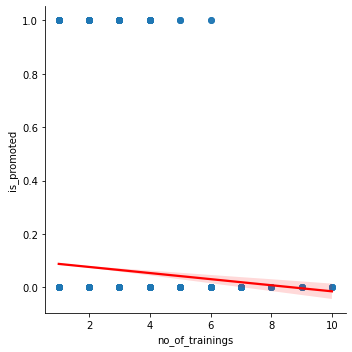

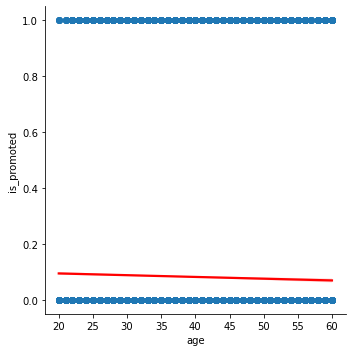

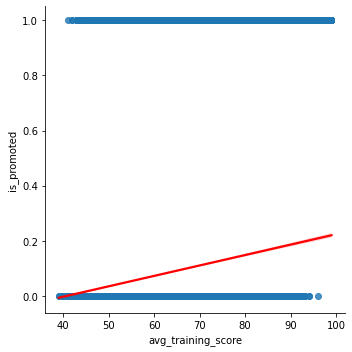

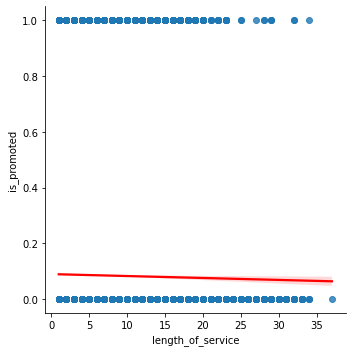

In [39]:
sns.lmplot(x='no_of_trainings', y='is_promoted', data=hr_new, line_kws={'color': 'red'}) 
plt.show() # Display the plot

sns.lmplot(x='age', y='is_promoted', data=hr_new, line_kws={'color': 'red'}) 
plt.show() # Display the plot

sns.lmplot(x='avg_training_score', y='is_promoted', data=hr_new, line_kws={'color': 'red'})
plt.show()  # Display the plot

sns.lmplot(x='length_of_service', y='is_promoted', data=hr_new, line_kws={'color': 'red'}) 
plt.show() # Display the plot

Some of the numerical features have negative correlation, and some has positive. However, none of them have strong correlation.

### Categorical

In [40]:
hr_new.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 54808 entries, 0 to 54807
Data columns (total 14 columns):
 #   Column                Non-Null Count  Dtype  
---  ------                --------------  -----  
 0   employee_id           54808 non-null  int64  
 1   department            54808 non-null  object 
 2   region                54808 non-null  object 
 3   education             52399 non-null  object 
 4   gender                54808 non-null  object 
 5   recruitment_channel   54808 non-null  object 
 6   no_of_trainings       54808 non-null  int64  
 7   age                   54808 non-null  int64  
 8   previous_year_rating  50684 non-null  float64
 9   length_of_service     54808 non-null  int64  
 10  KPIs_met >80%         54808 non-null  int64  
 11  awards_won?           54808 non-null  int64  
 12  avg_training_score    54808 non-null  int64  
 13  is_promoted           54808 non-null  int64  
dtypes: float64(1), int64(8), object(5)
memory usage: 5.9+ MB


In [41]:
# Categorical data
hr_cat = hr_new[['department', 'region', 'education', 'gender',
                 'recruitment_channel', 'KPIs_met >80%', 'awards_won?',
                 'is_promoted']]
hr_cat.head()

,department,region,education,gender,recruitment_channel,KPIs_met >80%,awards_won?,is_promoted
0,Sales & Marketing,region_7,Master's & above,f,sourcing,1,0,0
1,Operations,region_22,Bachelor's,m,other,0,0,0
2,Sales & Marketing,region_19,Bachelor's,m,sourcing,0,0,0
3,Sales & Marketing,region_23,Bachelor's,m,other,0,0,0
4,Technology,region_26,Bachelor's,m,other,0,0,0


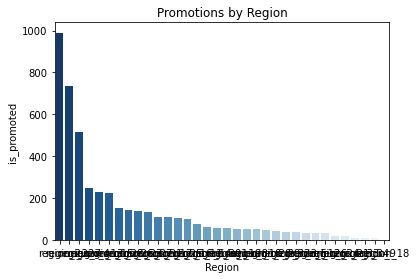

In [42]:
p = hr_new.groupby('region')['is_promoted'].sum().sort_values(ascending=False)

# Create a bar plot using Seaborn with a blue color gradient
sns.barplot(x=p.index, y=p, palette="Blues_r")

plt.ylabel('is_promoted')
plt.xlabel('Region')
plt.title('Promotions by Region')

# Display the plot
plt.show()

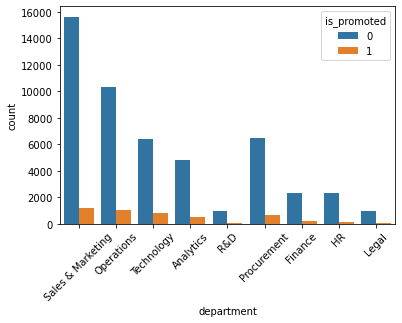

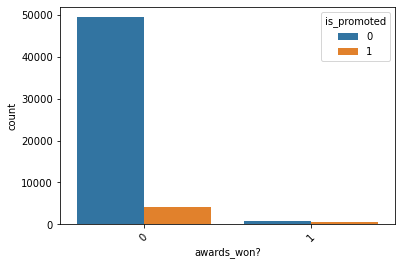

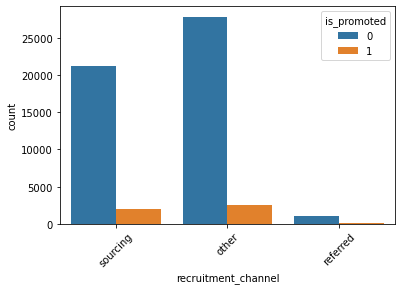

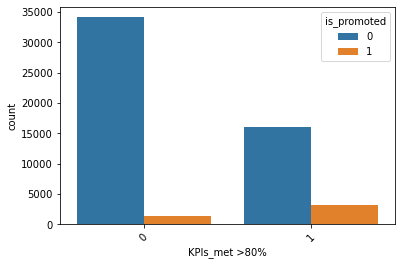

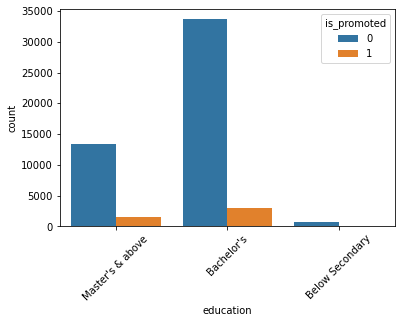

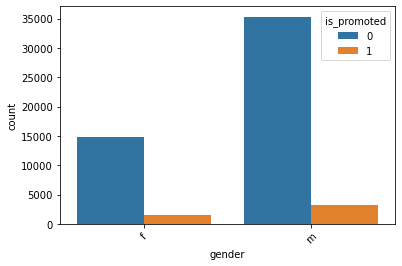

In [43]:
# Against is promoted
sns.countplot(x='department', hue='is_promoted', data=hr_new)
plt.xticks(rotation=45)
plt.show()

sns.countplot(x='awards_won?', hue='is_promoted', data=hr_new)
plt.xticks(rotation=45)
plt.show()

sns.countplot(x='recruitment_channel', hue='is_promoted', data=hr_new)
plt.xticks(rotation=45)
plt.show()

sns.countplot(x='KPIs_met >80%', hue='is_promoted', data=hr_new)
plt.xticks(rotation=45)
plt.show()

sns.countplot(x='education', hue='is_promoted', data=hr_new)
plt.xticks(rotation=45)
plt.show()

sns.countplot(x='gender', hue='is_promoted', data=hr_new)
plt.xticks(rotation=45)
plt.show()

High frequency of promotions and low incidence of non-promotions suggests that this specific category significantly influences the likelihood of promotion. The only one that fits this is 'KPIs met >80%'.

Although most of the employees that are not promoted do not have awards, most of the employees that do get promoted did not win any awards as well. There are more employees that got promoted without winning any awards than employees who got promoted when they had won awards.

In [44]:
#  Mean 'age' grouped by 'department'
hr_new.groupby('department')['age'].mean()

department
Analytics            32.431241
Finance              32.058754
HR                   34.385856
Legal                33.832531
Operations           36.073669
Procurement          35.899972
R&D                  32.842843
Sales & Marketing    34.860629
Technology           34.867190
Name: age, dtype: float64

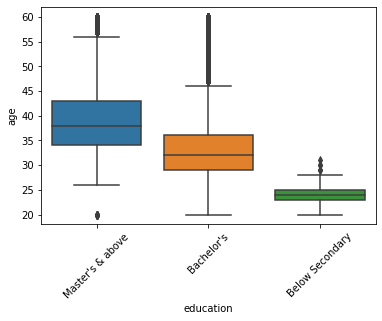

In [45]:
# Box plot for 'age' across different 'education' levels
sns.boxplot(x='education', y='age', data=hr_new)
plt.xticks(rotation=45)
plt.show()

This pattern implies that, on average, employees with higher educational attainment are older. 

In [46]:
# Calculate median for each category of 'education'
education_median = hr_new.groupby('education')['age'].median().reset_index()

# Display the calculated median for each category of 'education'
print("Median for each category of 'education':")
print(education_median)

Median for each category of 'education':
          education   age
0        Bachelor's  32.0
1   Below Secondary  24.0
2  Master's & above  38.0


#### Multivariate Analysis

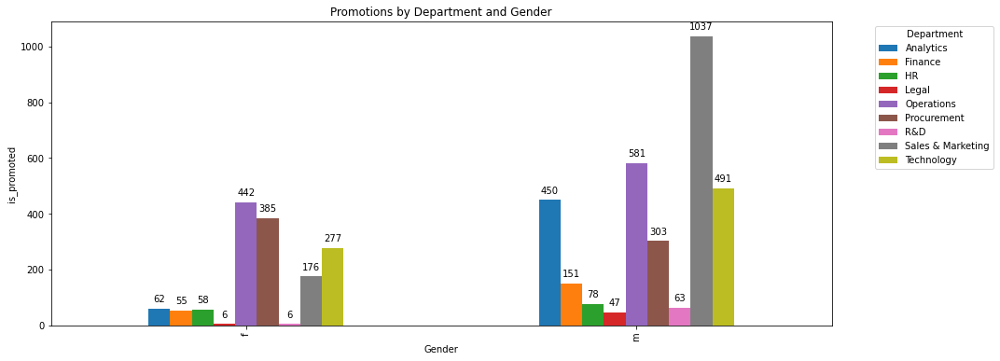

In [47]:
promotion_by_department_gender = hr_new.groupby(['department', 'gender'])['is_promoted'].sum().unstack(0)

# Create a bar plot
ax = promotion_by_department_gender.plot(kind='bar', figsize=(15, 6))

# Set labels and title
plt.ylabel('is_promoted')
plt.xlabel('Gender')
plt.title('Promotions by Department and Gender')

# Move the legend to the right outside of the plot
plt.legend(title='Department', bbox_to_anchor=(1.05, 1), loc='upper left')

# Add number labels for each bar
for p in ax.patches:
    ax.annotate(str(p.get_height()), (p.get_x() + p.get_width() / 2., p.get_height()),
                ha='center', va='center', xytext=(0, 10), textcoords='offset points')

# Display the plot
plt.show()


While 'Sales and Marketing' remains the top department for males, registering 1037 promotions, its prominence diminishes for females, with a notable drop to 176 promotions. In the female cohort, 'Operations' and 'Procurement' ascend as the predominant departments for promotions. 

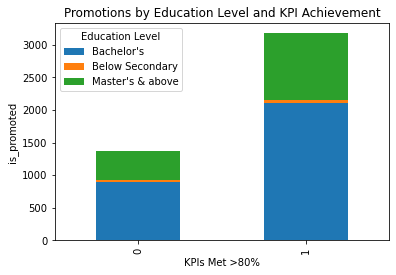

In [48]:
# Promotion by Education Level and KPI Achievement
promotion_by_education_kpi = hr_new.groupby(['education', 'KPIs_met >80%'])['is_promoted'].sum().unstack(0)

promotion_by_education_kpi.plot(kind='bar', stacked=True)
plt.xlabel('KPIs Met >80%')
plt.ylabel('is_promoted')
plt.title('Promotions by Education Level and KPI Achievement')
plt.legend(title='Education Level')
plt.show()


It can be seen from here that the number of 'below secondary' employees are very little compared to 'bachelor's' and 'master's & above' employees.

It suggests that an employee that is able to meet 80%+ KPI may have a higher chance of getting promoted, no matter the education level. 

### Data Wrangling

In [49]:
hr_new.head()

,employee_id,department,region,education,gender,recruitment_channel,no_of_trainings,age,previous_year_rating,length_of_service,KPIs_met >80%,awards_won?,avg_training_score,is_promoted
0,65438,Sales & Marketing,region_7,Master's & above,f,sourcing,1,35,5.0,8,1,0,49,0
1,65141,Operations,region_22,Bachelor's,m,other,1,30,5.0,4,0,0,60,0
2,7513,Sales & Marketing,region_19,Bachelor's,m,sourcing,1,34,3.0,7,0,0,50,0
3,2542,Sales & Marketing,region_23,Bachelor's,m,other,2,39,1.0,10,0,0,50,0
4,48945,Technology,region_26,Bachelor's,m,other,1,45,3.0,2,0,0,73,0


In [50]:
#Renaming columns
hr_new.rename(columns={'KPIs_met >80%': 'KPIs_above_80pct', 'awards_won?': 'won_awards?'}, inplace=True)

#To avoid confusion

In [51]:
hr_new.columns

Index(['employee_id', 'department', 'region', 'education', 'gender',
       'recruitment_channel', 'no_of_trainings', 'age', 'previous_year_rating',
       'length_of_service', 'KPIs_above_80pct', 'won_awards?',
       'avg_training_score', 'is_promoted'],
      dtype='object')

### Feature Engineering

In [52]:
# Create a new column 'good_performance' with values based on conditions
hr_new['good_performance'] = (hr_new['KPIs_above_80pct'] == 1) & (hr_new['won_awards?'] == 1)

# Convert boolean values to integers (1 for True, 0 for False)
hr_new['good_performance'] = hr_new['good_performance'].astype(int)

The conditions stipulate that an employee is deemed to have a 'good_performance' if they have both KPIs above 80% (indicated by a value of 1 in 'KPIs_above_80pct') and have won awards (indicated by a value of 1 in 'won_awards?')

This combination reflects a scenario where an employee excels in meeting key performance indicators and has been recognized with awards, signaling an outstanding overall performance. By converting the boolean values resulting from these conditions into integers (1 for True and 0 for False), the 'good_performance' column provides a binary indicator, facilitating further analyses and modeling by quantifying instances of commendable performance within the dataset.

By creating a binary indicator that signifies exceptional performance based on both KPIs and awards of the emplyees, it serves as a targeted feature for understanding the characteristics associated with promotions. 

In [53]:
# Display 3 rows where 'good_performance' is 1
selected_rows = hr_new[hr_new['good_performance'] == 1].head(3)
selected_rows

,employee_id,department,region,education,gender,recruitment_channel,no_of_trainings,age,previous_year_rating,length_of_service,KPIs_above_80pct,won_awards?,avg_training_score,is_promoted,good_performance
66,77981,Finance,region_22,Bachelor's,m,other,1,27,NaN,1,1,1,58,1,1
138,51164,Technology,region_14,Bachelor's,f,other,1,31,4.0,4,1,1,78,0,1
140,7606,Technology,region_29,Bachelor's,f,other,2,30,3.0,7,1,1,76,0,1


### Dropping Irrelevant Columns

In [54]:
# Drop the Name, PassengerId and Ticket column
hr_new = hr_new.drop(['employee_id'], axis = 1)
hr_new.head()

,department,region,education,gender,recruitment_channel,no_of_trainings,age,previous_year_rating,length_of_service,KPIs_above_80pct,won_awards?,avg_training_score,is_promoted,good_performance
0,Sales & Marketing,region_7,Master's & above,f,sourcing,1,35,5.0,8,1,0,49,0,0
1,Operations,region_22,Bachelor's,m,other,1,30,5.0,4,0,0,60,0,0
2,Sales & Marketing,region_19,Bachelor's,m,sourcing,1,34,3.0,7,0,0,50,0,0
3,Sales & Marketing,region_23,Bachelor's,m,other,2,39,1.0,10,0,0,50,0,0
4,Technology,region_26,Bachelor's,m,other,1,45,3.0,2,0,0,73,0,0


As it is a unique identifier for each employee, it carries no inherent information relevant to the prediction of promotions and can lead to overfitting in machine learning models. Its inclusion would not contribute meaningfully to predicting the 'is_promoted' target variable.

### 1.2 `Cleanse and Transform the data`  <a id="part1.2"></a> 

### Missing Values

In [55]:
hr_new.isnull().sum()

department                 0
region                     0
education               2409
gender                     0
recruitment_channel        0
no_of_trainings            0
age                        0
previous_year_rating    4124
length_of_service          0
KPIs_above_80pct           0
won_awards?                0
avg_training_score         0
is_promoted                0
good_performance           0
dtype: int64

In [56]:
hr_new['education'].value_counts()

Bachelor's          36669
Master's & above    14925
Below Secondary       805
Name: education, dtype: int64

In [57]:
education_percentages = hr_new['education'].value_counts(dropna=False).div(hr_new['education'].count()) * 100
print(education_percentages)

Bachelor's          69.980343
Master's & above    28.483368
NaN                  4.597416
Below Secondary      1.536289
Name: education, dtype: float64


In [58]:
# Calculate median for each category of 'education'
education_median = hr_new.groupby('education')['age'].median().reset_index()

# Display the calculated median for each category of 'education'
print("Median for each category of 'education':")
print(education_median)

Median for each category of 'education':
          education   age
0        Bachelor's  32.0
1   Below Secondary  24.0
2  Master's & above  38.0


I thought of imputing with median by the age of the employee, but I don't think its a good idea as:

Heterogeneity Within Age Groups: Even within a specific age range (as explored in EDA), there can be significant heterogeneity in terms of education levels. People with the same age can have different educational backgrounds, and imputing 'education' based on a specific age range might oversimplify this diversity.

Risk of Bias: Imputing 'education' based on age might introduce bias, especially if certain education levels are overrepresented or underrepresented within specific age ranges.

#### Imputing with Mode for education

In [59]:
# FILLING WITH MODE
#missing at random and the percentage is quite little

hr_new['education'].fillna(hr_new['education'].mode()[0], inplace=True)

In [60]:
#To see the After
hr_new['education'].value_counts()

Bachelor's          39078
Master's & above    14925
Below Secondary       805
Name: education, dtype: int64

In [61]:
education_percentages = hr_new['education'].value_counts(dropna=False).div(hr_new['education'].count()) * 100
print(education_percentages)

Bachelor's          71.299810
Master's & above    27.231426
Below Secondary      1.468764
Name: education, dtype: float64


Since 'Bachelor's' is the most common category with a percentage as high as 69%, I have decided to impute the missing values with the mode. 

Mode imputation preserves the observed distribution of 'education' in the dataset. Since 'Bachelor's' is the mode and has the highest frequency, imputing missing values with the mode is consistent with the existing data.

Mode imputation is a simple and non-disruptive method, especially when dealing with a small percentage of missing values. It minimizes the disturbance to the overall distribution of the variable.

The simplicity of mode imputation makes it easy to implement and interpret. It provides a transparent and straightforward solution, which can be beneficial when explaining and communicating the imputation process.

Mode imputation is particularly suitable for categorical variables. In the case of 'education,' which is a categorical variable with distinct levels, imputing with the mode makes logical sense.

Given that the missing percentage is relatively small (4.5%), imputing with the mode is unlikely to introduce significant bias or distort the variability of the 'education' variable.

#### Imputing with random imputation for previous_year_rating

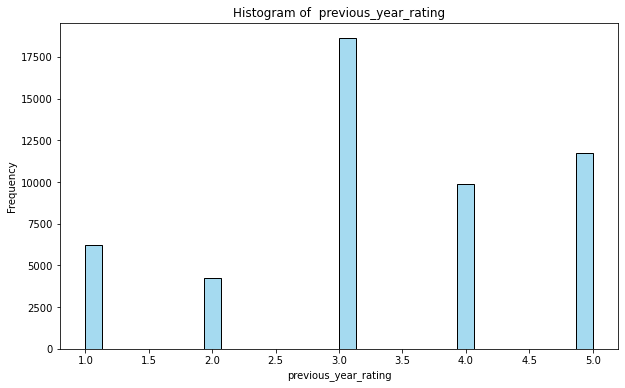

In [62]:
plt.figure(figsize=(10, 6))
sns.histplot(hr_new['previous_year_rating'].dropna(), bins=30, kde=False, color='skyblue', edgecolor='black')

# Add labels and title
plt.title('Histogram of  previous_year_rating')
plt.xlabel('previous_year_rating')
plt.ylabel('Frequency')

# Show the plot
plt.show()

In [63]:
# View unique titles of education and how many NA values we have in this feature
hr_new['previous_year_rating'].value_counts(dropna=False)

3.0    18618
5.0    11741
4.0     9877
1.0     6223
2.0     4225
NaN     4124
Name: previous_year_rating, dtype: int64

In [64]:
rating_percentages = hr_new['previous_year_rating'].value_counts(dropna=False).div(hr_new['previous_year_rating'].count()) * 100
print(rating_percentages)

3.0    36.733486
5.0    23.165101
4.0    19.487412
1.0    12.278036
2.0     8.335964
NaN     8.136690
Name: previous_year_rating, dtype: float64


In [65]:
observed_distribution = hr_new['previous_year_rating'].value_counts(normalize=True)
hr_new['previous_year_rating'].fillna(pd.Series(np.random.choice(observed_distribution.index, 
                                                                 p=observed_distribution.values,
                                                                 size=len(hr_new))), inplace=True)


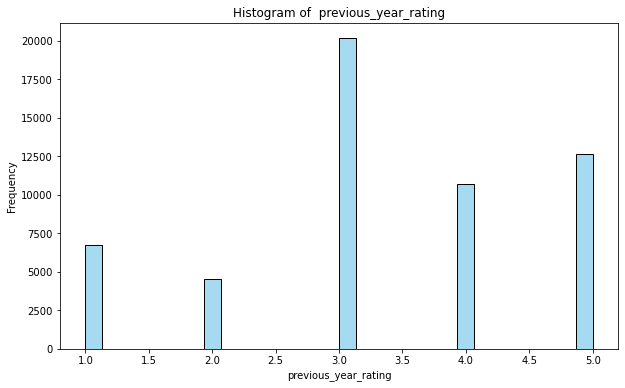

In [66]:
plt.figure(figsize=(10, 6))
sns.histplot(hr_new['previous_year_rating'].dropna(), bins=30, kde=False, color='skyblue', edgecolor='black')

# Add labels and title
plt.title('Histogram of  previous_year_rating')
plt.xlabel('previous_year_rating')
plt.ylabel('Frequency')

# Show the plot
plt.show()

Random sampling imputation consists of extracting random observations from the pool of available values in the variable. Random sampling imputation preserves the original distribution.

Random imputation introduces variability by assigning missing values based on the observed distribution of ratings. This helps preserve the natural variability in the data, preventing the imputation from being overly deterministic.

Hence, the distribution of histogram looks the same, before and after imputation.

In [67]:
#no more null values
hr_new.isnull().sum()

department              0
region                  0
education               0
gender                  0
recruitment_channel     0
no_of_trainings         0
age                     0
previous_year_rating    0
length_of_service       0
KPIs_above_80pct        0
won_awards?             0
avg_training_score      0
is_promoted             0
good_performance        0
dtype: int64

### Outlier Handling

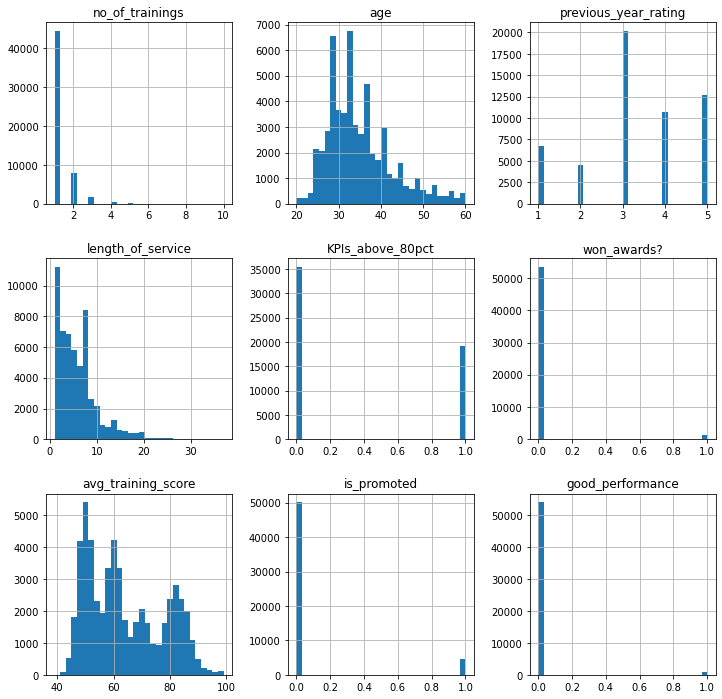

In [68]:
hr_new.hist(bins=30, figsize=(12,12))
plt.show()

In [69]:
# function to create histogram, Q-Q plot and
# boxplot. We learned this in section 3 of the course


def diagnostic_plots(df, variable):
    # function takes a dataframe (df) and
    # the variable of interest as arguments

    # define figure size
    plt.figure(figsize=(16, 4))

    # histogram
    plt.subplot(1, 3, 1)
    sns.distplot(df[variable], bins=30)
    plt.title('Histogram')

    # Q-Q plot
    plt.subplot(1, 3, 2)
    stats.probplot(df[variable], dist="norm", plot=plt)
    plt.ylabel('RM quantiles')

    # boxplot
    plt.subplot(1, 3, 3)
    sns.boxplot(y=df[variable])
    plt.title('Boxplot')

    plt.show()

As previous year rating is considered a categorical variable, avg training score has no outliers, and values from no_of_trainings are not considered outliers, only age and length of service will undergo outlier handling.

C:\Users\chery\anaconda3\lib\site-packages\seaborn\distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


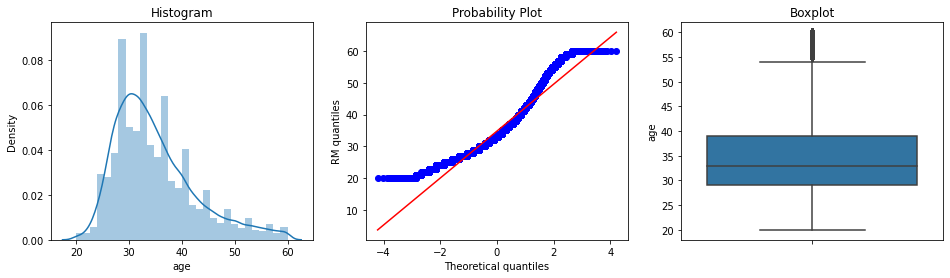

C:\Users\chery\anaconda3\lib\site-packages\seaborn\distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


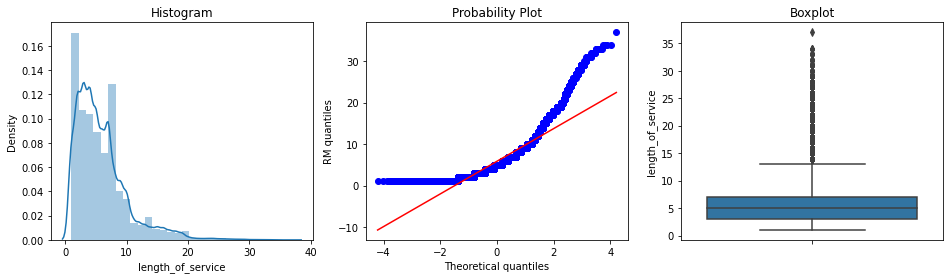

In [70]:
#BEFORE 
import scipy.stats as stats

diagnostic_plots(hr_new, 'age')
diagnostic_plots(hr_new, 'length_of_service')

#### Winsoriation Method

Winsorisation involves replacing extreme values (outliers) with values that are closer to the rest of the data, typically at a specified percentile. This technique is employed to reduce the influence of extreme observations on statistical analyses and modeling, ensuring that these outliers do not unduly skew results or adversely affect the performance of statistical methods. Winsorization is particularly useful in situations where outliers might distort the interpretation of statistical measures or compromise the robustness of predictive models.

In [71]:
def winsorise(df, variable, upper_limit, lower_limit):
    return np.where(df[variable] > upper_limit, upper_limit, 
                    np.where(df[variable] < lower_limit, lower_limit, df[variable]))

#df[variable] means if its not any outlier, stay the same

In [72]:
# Now let's replace the outliers by the percentiles
hr_new['age']= winsorise(hr_new, 'age', hr_new['age'].quantile(0.95), hr_new['age'].quantile(0.05))
hr_new['length_of_service']= winsorise(hr_new, 'length_of_service', hr_new['length_of_service'].quantile(0.95), hr_new['length_of_service'].quantile(0.05))

C:\Users\chery\anaconda3\lib\site-packages\seaborn\distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


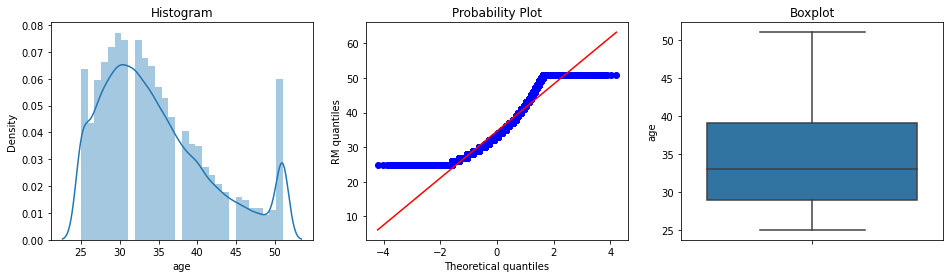

C:\Users\chery\anaconda3\lib\site-packages\seaborn\distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


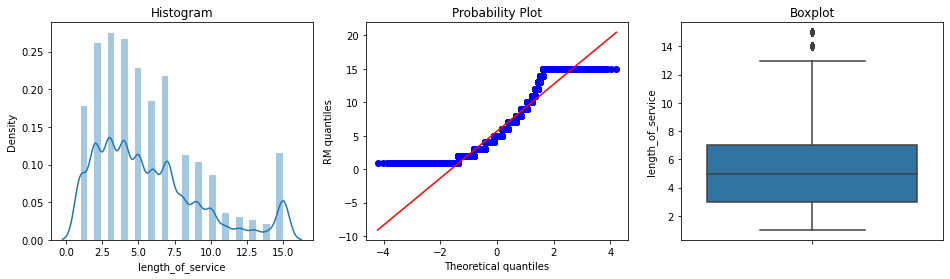

In [73]:
#AFTER
diagnostic_plots(hr_new, 'age')
diagnostic_plots(hr_new, 'length_of_service')

I opted for winsorization as the method for handling outliers in the 'age' and 'length_of_service' variables. Positive skewness is present in both of these traits, suggesting a long tail that points towards higher values and a concentration of values towards the lower end. In this case, winsorization is the better option compared to trimming since it replaces extreme values with values at a given percentile, making the former more representative of the distribution as a whole. This method minimizes the excessive impact of extreme values on the dataset's statistical characteristics while preserving the information they contain. 

#### Trimming Method (not used)

In [74]:
def find_boundaries(df, variable, distance):

    # Let's calculate the boundaries outside which sit the outliers
    # for skewed distributions

    # distance passed as an argument, gives us the option to
    # estimate 1.5 times or 3 times the IQR to calculate
    # the boundaries.

    IQR = df[variable].quantile(0.75) - df[variable].quantile(0.25)

    lower_boundary = df[variable].quantile(0.25) - (IQR * distance)
    upper_boundary = df[variable].quantile(0.75) + (IQR * distance)

    return upper_boundary, lower_boundary

In [75]:
# find limits for age

age_upper_limit, age_lower_limit = find_boundaries(hr_new, 'age', 1.5)
age_upper_limit, age_lower_limit

(54.0, 14.0)

In [76]:
# find limits for length of serv

los_upper_limit, los_lower_limit = find_boundaries(hr_new, 'length_of_service', 1.5)
los_upper_limit, los_lower_limit

(13.0, -3.0)

In [77]:
# let's flag (locate) the outliers in the data set

outliers_age = np.where(hr_new['age'] > age_upper_limit, True,
                       np.where(hr_new['age'] < age_lower_limit, True, False))

In [78]:
# let's flag (locate) the outliers in the data set

outliers_los = np.where(hr_new['length_of_service'] > los_upper_limit, True,
                       np.where(hr_new['length_of_service'] < los_lower_limit, True, False))

In [79]:
# let's trim the dataset of outliers across multiple variables

hr_new_trimmed = hr_new.loc[~(outliers_age + outliers_los), ]

hr_new.shape, hr_new_trimmed.shape

((54808, 14), (51319, 14))

C:\Users\chery\anaconda3\lib\site-packages\seaborn\distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


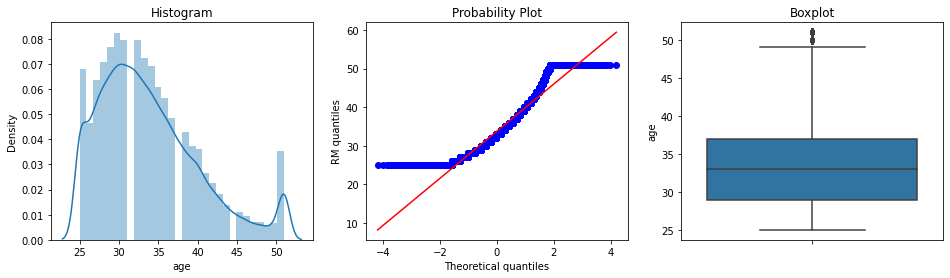

C:\Users\chery\anaconda3\lib\site-packages\seaborn\distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


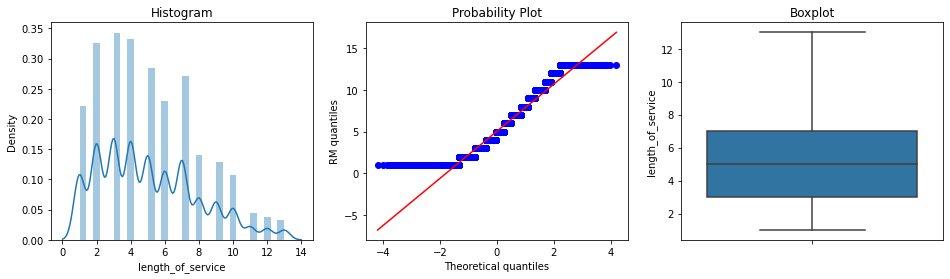

In [80]:
#AFTER
diagnostic_plots(hr_new_trimmed, 'age')
diagnostic_plots(hr_new_trimmed, 'length_of_service')

Trimming involves removing a certain percentage of data points, potentially altering the shape of the distribution. In positively skewed distributions, where there's a long tail on the right, trimming could result in a loss of valuable information about the tail of the distribution.

In [81]:
hr_new.shape

(54808, 14)

In [82]:
hr_new.corr() #after

,no_of_trainings,age,previous_year_rating,length_of_service,KPIs_above_80pct,won_awards?,avg_training_score,is_promoted,good_performance
no_of_trainings,1.000000,-0.084175,-0.059237,-0.059152,-0.045576,-0.007628,0.042517,-0.024896,-0.008280
age,-0.084175,1.000000,0.005877,0.654749,-0.025304,-0.008276,-0.053286,-0.017013,-0.006771
previous_year_rating,-0.059237,0.005877,1.000000,0.000295,0.324702,0.025512,0.070656,0.145974,0.027199
length_of_service,-0.059152,0.654749,0.000295,1.000000,-0.078799,-0.040626,-0.040432,-0.008667,-0.042766
KPIs_above_80pct,-0.045576,-0.025304,0.324702,-0.078799,1.000000,0.097000,0.078391,0.221582,0.168153
won_awards?,-0.007628,-0.008276,0.025512,-0.040626,0.097000,1.000000,0.072138,0.195871,0.804626
avg_training_score,0.042517,-0.053286,0.070656,-0.040432,0.078391,0.072138,1.000000,0.181147,0.050760
is_promoted,-0.024896,-0.017013,0.145974,-0.008667,0.221582,0.195871,0.181147,1.000000,0.133562
good_performance,-0.008280,-0.006771,0.027199,-0.042766,0.168153,0.804626,0.050760,0.133562,1.000000


### Transforming Numerical Features

In [83]:
hr_new.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 54808 entries, 0 to 54807
Data columns (total 14 columns):
 #   Column                Non-Null Count  Dtype  
---  ------                --------------  -----  
 0   department            54808 non-null  object 
 1   region                54808 non-null  object 
 2   education             54808 non-null  object 
 3   gender                54808 non-null  object 
 4   recruitment_channel   54808 non-null  object 
 5   no_of_trainings       54808 non-null  int64  
 6   age                   54808 non-null  float64
 7   previous_year_rating  54808 non-null  float64
 8   length_of_service     54808 non-null  float64
 9   KPIs_above_80pct      54808 non-null  int64  
 10  won_awards?           54808 non-null  int64  
 11  avg_training_score    54808 non-null  int64  
 12  is_promoted           54808 non-null  int64  
 13  good_performance      54808 non-null  int32  
dtypes: float64(3), int32(1), int64(5), object(5)
memory usage: 5.6+ MB


In [84]:
num = hr_new[['no_of_trainings','age','length_of_service', 
              'avg_training_score']]

C:\Users\chery\anaconda3\lib\site-packages\seaborn\distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


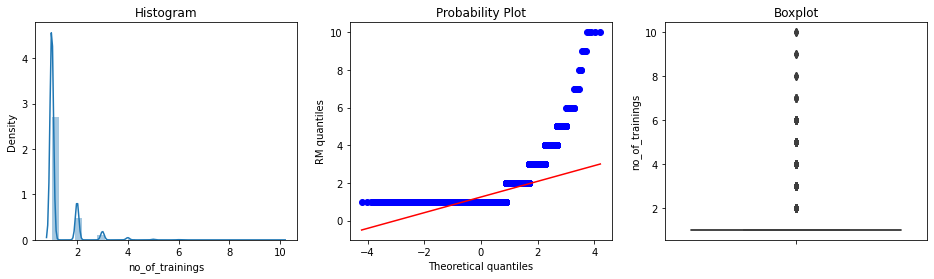

C:\Users\chery\anaconda3\lib\site-packages\seaborn\distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


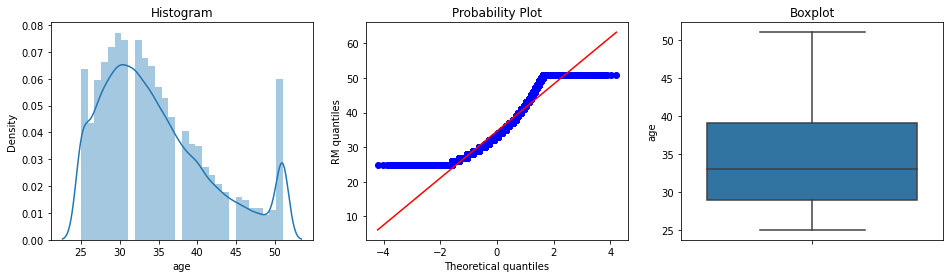

C:\Users\chery\anaconda3\lib\site-packages\seaborn\distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


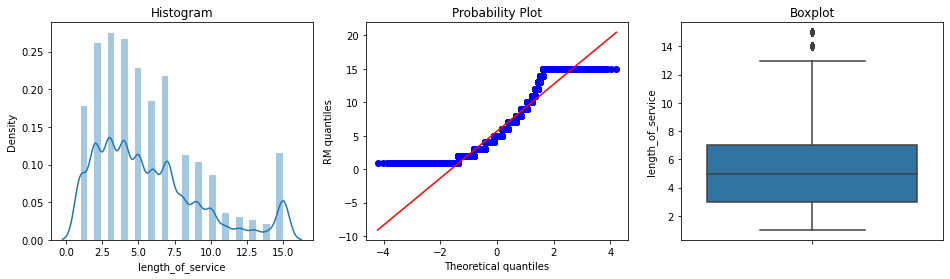

C:\Users\chery\anaconda3\lib\site-packages\seaborn\distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


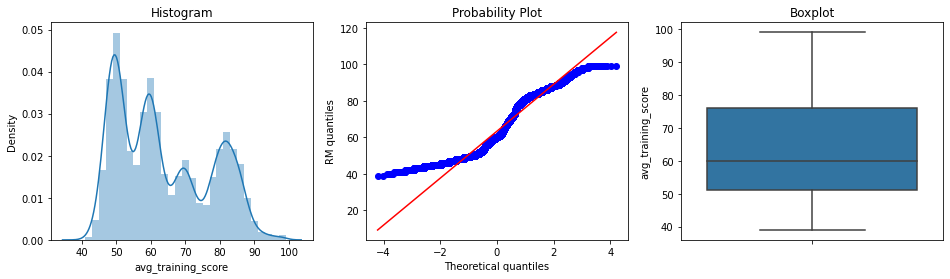

In [85]:
#BEFORE
for feature in num:
    diagnostic_plots(hr_new, feature)

### Log Transform

Log transform involves taking the logarithm of variable values, and is applied to address issues such as skewed distributions and heteroscedasticity in the data. It is particularly useful for variables with skewed distributions, stabilizing variances, interpreting percentage changes, linearizing relationships, and normalizing distributions. It can only be applied to positive values. 

In [86]:
from feature_engine.transformation import LogTransformer

In [87]:
# initialize the transformer
lt = LogTransformer(variables=['no_of_trainings'])

# fit transformer to data set
lt.fit(hr_new)

LogTransformer(variables=['no_of_trainings'])

In [88]:
# transform variables within our data set
hr_new = lt.transform(hr_new)

C:\Users\chery\anaconda3\lib\site-packages\seaborn\distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


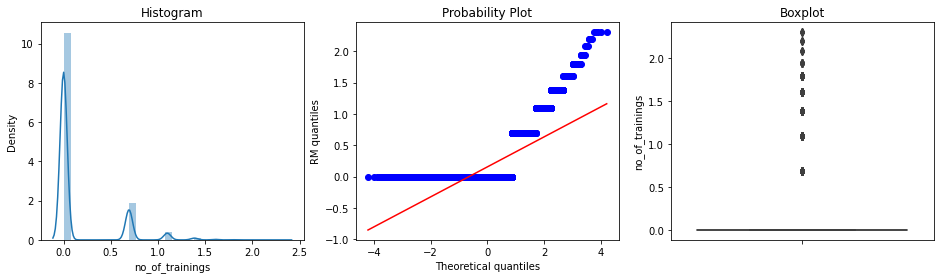

C:\Users\chery\anaconda3\lib\site-packages\seaborn\distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


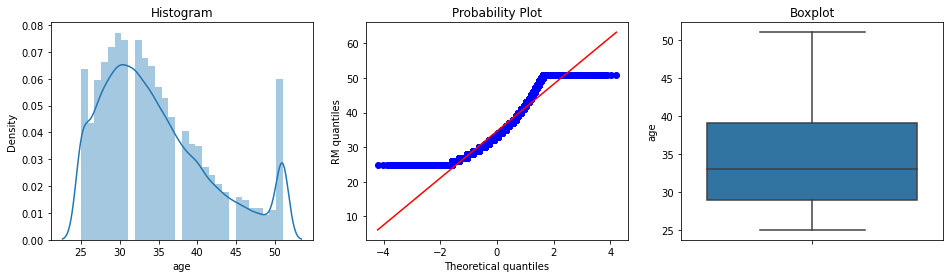

C:\Users\chery\anaconda3\lib\site-packages\seaborn\distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


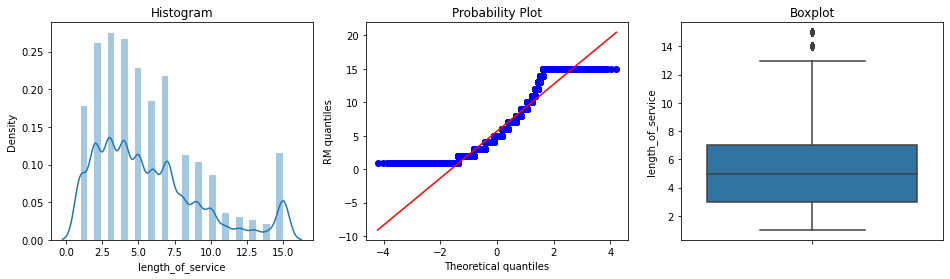

C:\Users\chery\anaconda3\lib\site-packages\seaborn\distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


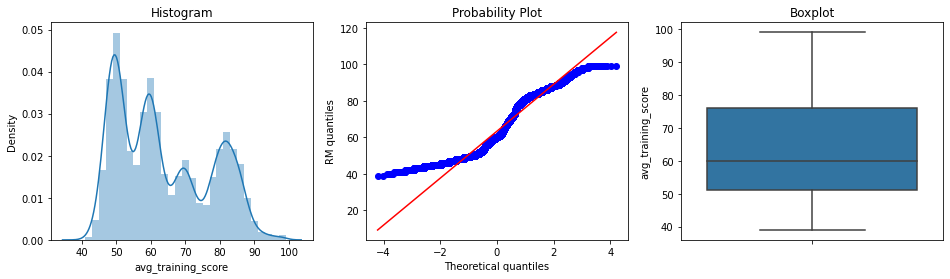

In [89]:
#AFTER
for feature in num:
    diagnostic_plots(hr_new, feature)

As the distribution of "no_of_trainings" is highly right-skewed, with the majority of values concentrated at the lower end and a long tail of infrequent higher values. Log transformation is effective in reducing the skewness of such distributions.

Log transformation is commonly applied when dealing with count data or variables with a wide range of values, such as the number of trainings. It helps to mitigate the impact of extreme values and highlights differences in the lower end of the distribution.

Log transformation also reduces the impact of extreme values, which no_of_training has. Hence, log transformation is used for no_of_trainings.

### Yeo-Johnson

Yeo-Johnson transformation is an extension of the Box-Cox transformation that can be applied to variables with zero or negative values. It involves a power transformation that optimally normalizes the data. Similar to log transformation, Yeo-Johnson is used to address issues related to skewed distributions and heteroscedasticity in the data.

In [90]:
from feature_engine.transformation import YeoJohnsonTransformer
# initialize the transformer with a subset of variables to transform
yjt = YeoJohnsonTransformer(variables = ['age','length_of_service', 
              'avg_training_score'])

# fit transformer to the dataframe
yjt.fit(hr_new)

YeoJohnsonTransformer(variables=['age', 'length_of_service',
                                 'avg_training_score'])

In [91]:
# transform indicated variables

hr_new = yjt.transform(hr_new)

# the transformer stores the learned parameters for each variable
# in a dictionary as an attribute

yjt.lambda_dict_

{'age': -1.127891049716483,
 'length_of_service': 0.09179663274835848,
 'avg_training_score': -0.716960259121021}

C:\Users\chery\anaconda3\lib\site-packages\seaborn\distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


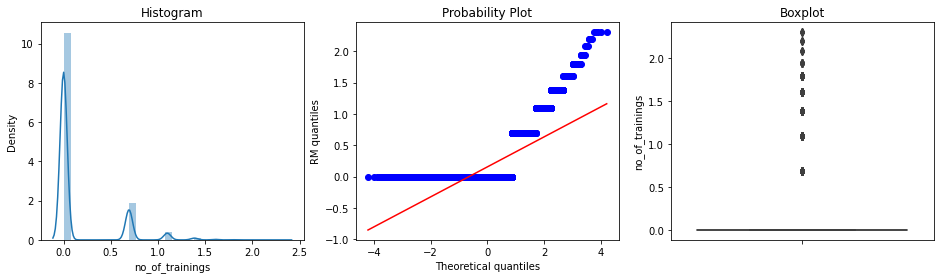

C:\Users\chery\anaconda3\lib\site-packages\seaborn\distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


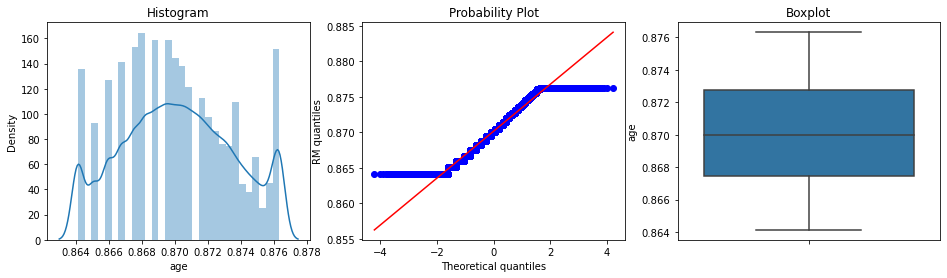

C:\Users\chery\anaconda3\lib\site-packages\seaborn\distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


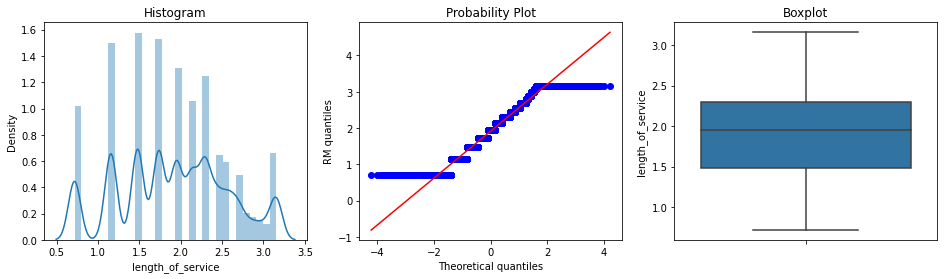

C:\Users\chery\anaconda3\lib\site-packages\seaborn\distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


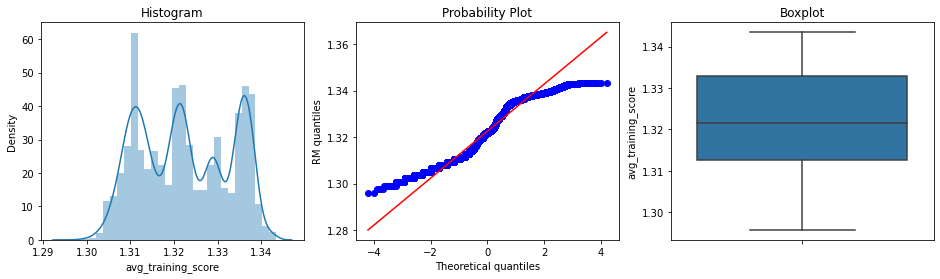

In [92]:
#AFTER
for feature in num:
    diagnostic_plots(hr_new, feature)

As age, avg_training_score, and length_of_service all exhibits a positive skew, they are suitable for Yeo-Johnson transformation.

Yeo-Johnson tends to preserve the ordering of values and relationships among data points, which is crucial when maintaining the interpretability of 'age' and 'length_of_service,' where the chronological order is significant. 

Yeo-Johnson also provides a flexible approach to skewness correction, accommodating a broader range of skewness, which is effective for avg_training_score.

Conclusion: 
    
These transformations shows effectiveness in  improving the normality of the data through visual examination of QQ plots and probability plots. A steeper best fit line in these plots indicates a closer alignment of the transformed data distribution with a normal distribution. The increased concentration of points along the line signifies reduced discrepancies, reflecting the successful mitigation of skewness. 

In [93]:
hr_new.corr() #take a look at how transformation affects correlation

,no_of_trainings,age,previous_year_rating,length_of_service,KPIs_above_80pct,won_awards?,avg_training_score,is_promoted,good_performance
no_of_trainings,1.000000,-0.088041,-0.057242,-0.060274,-0.044376,-0.007676,0.046358,-0.024209,-0.008124
age,-0.088041,1.000000,0.009091,0.664360,-0.017321,-0.006533,-0.036463,-0.011122,-0.005029
previous_year_rating,-0.057242,0.009091,1.000000,0.002072,0.324702,0.025512,0.077265,0.145974,0.027199
length_of_service,-0.060274,0.664360,0.002072,1.000000,-0.064111,-0.034686,-0.027938,-0.006047,-0.036848
KPIs_above_80pct,-0.044376,-0.017321,0.324702,-0.064111,1.000000,0.097000,0.085047,0.221582,0.168153
won_awards?,-0.007676,-0.006533,0.025512,-0.034686,0.097000,1.000000,0.062761,0.195871,0.804626
avg_training_score,0.046358,-0.036463,0.077265,-0.027938,0.085047,0.062761,1.000000,0.167139,0.043468
is_promoted,-0.024209,-0.011122,0.145974,-0.006047,0.221582,0.195871,0.167139,1.000000,0.133562
good_performance,-0.008124,-0.005029,0.027199,-0.036848,0.168153,0.804626,0.043468,0.133562,1.000000


### Transforming Categorical Features

In [94]:
hr_new.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 54808 entries, 0 to 54807
Data columns (total 14 columns):
 #   Column                Non-Null Count  Dtype  
---  ------                --------------  -----  
 0   department            54808 non-null  object 
 1   region                54808 non-null  object 
 2   education             54808 non-null  object 
 3   gender                54808 non-null  object 
 4   recruitment_channel   54808 non-null  object 
 5   no_of_trainings       54808 non-null  float64
 6   age                   54808 non-null  float64
 7   previous_year_rating  54808 non-null  float64
 8   length_of_service     54808 non-null  float64
 9   KPIs_above_80pct      54808 non-null  int64  
 10  won_awards?           54808 non-null  int64  
 11  avg_training_score    54808 non-null  float64
 12  is_promoted           54808 non-null  int64  
 13  good_performance      54808 non-null  int32  
dtypes: float64(5), int32(1), int64(3), object(5)
memory usage: 5.6+ MB


In [95]:
hr_new.head()

,department,region,education,gender,recruitment_channel,no_of_trainings,age,previous_year_rating,length_of_service,KPIs_above_80pct,won_awards?,avg_training_score,is_promoted,good_performance
0,Sales & Marketing,region_7,Master's & above,f,sourcing,0.000000,0.871037,5.0,2.434493,1,0,1.310364,0,0
1,Operations,region_22,Bachelor's,m,other,0.000000,0.868176,5.0,1.734406,0,0,1.321580,0,0
2,Sales & Marketing,region_19,Bachelor's,m,sourcing,0.000000,0.870534,3.0,2.291164,0,0,1.311554,0,0
3,Sales & Marketing,region_23,Bachelor's,m,other,0.693147,0.872782,1.0,2.682284,0,0,1.311554,0,0
4,Technology,region_26,Bachelor's,m,other,0.000000,0.874798,3.0,1.155919,0,0,1.331048,0,0


#### Replacing-categories-by-ordinal-numbers

Ensure that categorical features are transformed into numeric representations suitable for machine learning models. It's emphasized that the encoding is chosen to maintain compatibility and does not impose any inherent order or hierarchy on the categorical values transformed here. The resulting encoded columns facilitate model training and analysis while preserving the original information within these features.

It is used instead of one-hot encoding as Ordinal encoding results in a more compact representation compared to one-hot encoding, especially when dealing with a large number of categories, like region. It has lesser dimensionality, which is important to consider for large number of categories so that it would not result to curse of dimensionality. 

In [96]:
hr_new['department'].value_counts()

Sales & Marketing    16840
Operations           11348
Technology            7138
Procurement           7138
Analytics             5352
Finance               2536
HR                    2418
Legal                 1039
R&D                    999
Name: department, dtype: int64

In [97]:
hr_new['region'].value_counts()

region_2     12343
region_22     6428
region_7      4843
region_15     2808
region_13     2648
region_26     2260
region_31     1935
region_4      1703
region_27     1659
region_16     1465
region_28     1318
region_11     1315
region_23     1175
region_29      994
region_32      945
region_19      874
region_20      850
region_14      827
region_25      819
region_17      796
region_5       766
region_6       690
region_30      657
region_8       655
region_10      648
region_1       610
region_24      508
region_12      500
region_9       420
region_21      411
region_3       346
region_34      292
region_33      269
region_18       31
Name: region, dtype: int64

In [98]:
hr_new['gender'].value_counts()

m    38496
f    16312
Name: gender, dtype: int64

In [99]:
# let's create the encoder

# for integer encoding using feature-engine
from feature_engine.encoding import OrdinalEncoder

ordinal_enc = OrdinalEncoder(
    encoding_method='arbitrary',
    variables=['department','region', 'gender'])

In [100]:
# let's fit the encoder to the train set

ordinal_enc.fit(hr_new)

OrdinalEncoder(encoding_method='arbitrary',
               variables=['department', 'region', 'gender'])

In [101]:
# in the encoder dict we can observe the numbers
# assigned to each category for all the indicated variables

ordinal_enc.encoder_dict_

{'department': {'Sales & Marketing': 0,
  'Operations': 1,
  'Technology': 2,
  'Analytics': 3,
  'R&D': 4,
  'Procurement': 5,
  'Finance': 6,
  'HR': 7,
  'Legal': 8},
 'region': {'region_7': 0,
  'region_22': 1,
  'region_19': 2,
  'region_23': 3,
  'region_26': 4,
  'region_2': 5,
  'region_20': 6,
  'region_34': 7,
  'region_1': 8,
  'region_4': 9,
  'region_29': 10,
  'region_31': 11,
  'region_15': 12,
  'region_14': 13,
  'region_11': 14,
  'region_5': 15,
  'region_28': 16,
  'region_17': 17,
  'region_13': 18,
  'region_16': 19,
  'region_25': 20,
  'region_10': 21,
  'region_27': 22,
  'region_30': 23,
  'region_12': 24,
  'region_21': 25,
  'region_8': 26,
  'region_32': 27,
  'region_6': 28,
  'region_33': 29,
  'region_24': 30,
  'region_3': 31,
  'region_9': 32,
  'region_18': 33},
 'gender': {'f': 0, 'm': 1}}

In [102]:
# let's transform the train and test sets
enc = ordinal_enc.transform(hr_new)

In [103]:
hr_new.head() #before

,department,region,education,gender,recruitment_channel,no_of_trainings,age,previous_year_rating,length_of_service,KPIs_above_80pct,won_awards?,avg_training_score,is_promoted,good_performance
0,Sales & Marketing,region_7,Master's & above,f,sourcing,0.000000,0.871037,5.0,2.434493,1,0,1.310364,0,0
1,Operations,region_22,Bachelor's,m,other,0.000000,0.868176,5.0,1.734406,0,0,1.321580,0,0
2,Sales & Marketing,region_19,Bachelor's,m,sourcing,0.000000,0.870534,3.0,2.291164,0,0,1.311554,0,0
3,Sales & Marketing,region_23,Bachelor's,m,other,0.693147,0.872782,1.0,2.682284,0,0,1.311554,0,0
4,Technology,region_26,Bachelor's,m,other,0.000000,0.874798,3.0,1.155919,0,0,1.331048,0,0


In [104]:
enc.head() #after

,department,region,education,gender,recruitment_channel,no_of_trainings,age,previous_year_rating,length_of_service,KPIs_above_80pct,won_awards?,avg_training_score,is_promoted,good_performance
0,0,0,Master's & above,0,sourcing,0.000000,0.871037,5.0,2.434493,1,0,1.310364,0,0
1,1,1,Bachelor's,1,other,0.000000,0.868176,5.0,1.734406,0,0,1.321580,0,0
2,0,2,Bachelor's,1,sourcing,0.000000,0.870534,3.0,2.291164,0,0,1.311554,0,0
3,0,3,Bachelor's,1,other,0.693147,0.872782,1.0,2.682284,0,0,1.311554,0,0
4,2,4,Bachelor's,1,other,0.000000,0.874798,3.0,1.155919,0,0,1.331048,0,0


#### Ordinal encoding with mapping

This way of ordinal encoding allows customisation, which is important for features where the categories have a certain order, like education. 

In [105]:
hr_new['education'].value_counts()

Bachelor's          39078
Master's & above    14925
Below Secondary       805
Name: education, dtype: int64

In [106]:
education_mapping = {'Below Secondary': 0, 'Bachelor\'s': 1, 'Master\'s & above': 2}
enc['education'] = enc['education'].map(education_mapping)

In [107]:
hr_new.head(5)

,department,region,education,gender,recruitment_channel,no_of_trainings,age,previous_year_rating,length_of_service,KPIs_above_80pct,won_awards?,avg_training_score,is_promoted,good_performance
0,Sales & Marketing,region_7,Master's & above,f,sourcing,0.000000,0.871037,5.0,2.434493,1,0,1.310364,0,0
1,Operations,region_22,Bachelor's,m,other,0.000000,0.868176,5.0,1.734406,0,0,1.321580,0,0
2,Sales & Marketing,region_19,Bachelor's,m,sourcing,0.000000,0.870534,3.0,2.291164,0,0,1.311554,0,0
3,Sales & Marketing,region_23,Bachelor's,m,other,0.693147,0.872782,1.0,2.682284,0,0,1.311554,0,0
4,Technology,region_26,Bachelor's,m,other,0.000000,0.874798,3.0,1.155919,0,0,1.331048,0,0


In [108]:
enc.head() #after

,department,region,education,gender,recruitment_channel,no_of_trainings,age,previous_year_rating,length_of_service,KPIs_above_80pct,won_awards?,avg_training_score,is_promoted,good_performance
0,0,0,2,0,sourcing,0.000000,0.871037,5.0,2.434493,1,0,1.310364,0,0
1,1,1,1,1,other,0.000000,0.868176,5.0,1.734406,0,0,1.321580,0,0
2,0,2,1,1,sourcing,0.000000,0.870534,3.0,2.291164,0,0,1.311554,0,0
3,0,3,1,1,other,0.693147,0.872782,1.0,2.682284,0,0,1.311554,0,0
4,2,4,1,1,other,0.000000,0.874798,3.0,1.155919,0,0,1.331048,0,0


Because 'education' represents a variable with a clear and meaningful order, manually assigning numerical values through ordinal encoding with a mapping is a suitable choice. It captures the inherent hierarchy in education levels, maintains interpretability, and aligns with the semantic meaning of the original categories.

#### One-Hot Encoding

One-hot encoding is a categorical encoding method that transforms categorical variables into binary vectors, assigning a unique binary column for each category. This approach preserves the independence of categories, facilitating machine learning model compatibility and interpretability, although it may result in increased dimensionality and sparse matrices when dealing with numerous categories.

In [109]:
enc['recruitment_channel'].unique()

array(['sourcing', 'other', 'referred'], dtype=object)

In [110]:
enc = pd.get_dummies(enc, columns=['recruitment_channel'], drop_first=True)

In [111]:
hr_new.head() #Before

,department,region,education,gender,recruitment_channel,no_of_trainings,age,previous_year_rating,length_of_service,KPIs_above_80pct,won_awards?,avg_training_score,is_promoted,good_performance
0,Sales & Marketing,region_7,Master's & above,f,sourcing,0.000000,0.871037,5.0,2.434493,1,0,1.310364,0,0
1,Operations,region_22,Bachelor's,m,other,0.000000,0.868176,5.0,1.734406,0,0,1.321580,0,0
2,Sales & Marketing,region_19,Bachelor's,m,sourcing,0.000000,0.870534,3.0,2.291164,0,0,1.311554,0,0
3,Sales & Marketing,region_23,Bachelor's,m,other,0.693147,0.872782,1.0,2.682284,0,0,1.311554,0,0
4,Technology,region_26,Bachelor's,m,other,0.000000,0.874798,3.0,1.155919,0,0,1.331048,0,0


In [112]:
enc.head() #after

,department,region,education,gender,no_of_trainings,age,previous_year_rating,length_of_service,KPIs_above_80pct,won_awards?,avg_training_score,is_promoted,good_performance,recruitment_channel_referred,recruitment_channel_sourcing
0,0,0,2,0,0.000000,0.871037,5.0,2.434493,1,0,1.310364,0,0,0,1
1,1,1,1,1,0.000000,0.868176,5.0,1.734406,0,0,1.321580,0,0,0,0
2,0,2,1,1,0.000000,0.870534,3.0,2.291164,0,0,1.311554,0,0,0,1
3,0,3,1,1,0.693147,0.872782,1.0,2.682284,0,0,1.311554,0,0,0,0
4,2,4,1,1,0.000000,0.874798,3.0,1.155919,0,0,1.331048,0,0,0,0


One-hot encoding is suitable for the 'recruitment_channel' because it allows each recruitment channel to be independently represented as a binary column, avoiding assumptions of ordinal relationships.

In [113]:
hr_new = enc

### Robust Scaling

Scaling, in the context of data preprocessing for machine learning, refers to the process of transforming numerical features to a common scale or range.

Robust scaling is a data preprocessing technique used in statistics and machine learning to scale and center numerical features, making them suitable for modeling while reducing the influence of outliers. Hence, it is particularly beneficial in situations where the data distribution is skewed or contains extreme values.

In [114]:
num=['no_of_trainings', 'age', 'length_of_service', 'avg_training_score']

Scaling is a technique designed for numerical features where the magnitude and differences between values have significance. Categorical features, especially nominal ones, have a different nature, and the application of scaling to them is not meaningful or necessary in most cases. 

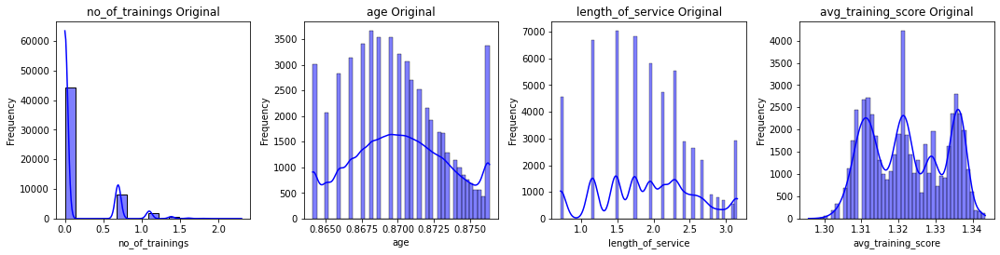

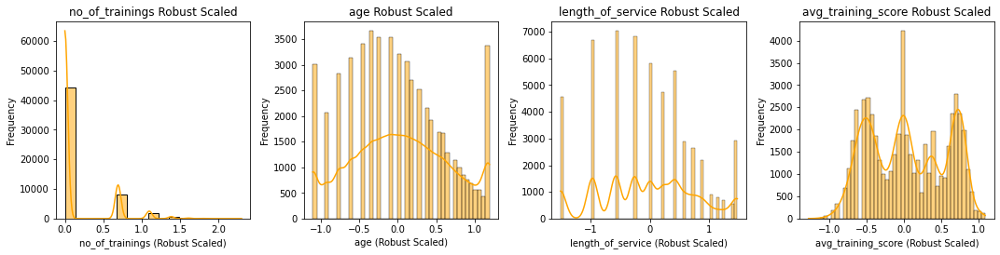

In [115]:
from sklearn.preprocessing import RobustScaler

# Create a copy of the dataset for visualization
hr_robust = hr_new.copy()

# Plot the original distributions
plt.figure(figsize=(15, 7))

for i, feature in enumerate(num, 1):
    plt.subplot(2, 4, i)
    sns.histplot(hr_new[feature], kde=True, color='blue', label='Original')
    plt.title(f'{feature} Original')
    plt.xlabel(feature)
    plt.ylabel('Frequency')

plt.tight_layout()
plt.show()

# Instantiate RobustScaler
scaler = RobustScaler()

# Fit and transform the specified numerical features
hr_robust[num] = scaler.fit_transform(hr_robust[num])

# Plot the scaled distributions
plt.figure(figsize=(15, 7))

for i, feature in enumerate(num, 1):
    plt.subplot(2, 4, i)
    sns.histplot(hr_robust[feature], kde=True, color='orange', label='Robust Scaled')
    plt.title(f'{feature} Robust Scaled')
    plt.xlabel(f'{feature} (Robust Scaled)')
    plt.ylabel('Frequency')

plt.tight_layout()
plt.show()


In [116]:
hr_new = hr_robust

In [117]:
hr_new.head()

,department,region,education,gender,no_of_trainings,age,previous_year_rating,length_of_service,KPIs_above_80pct,won_awards?,avg_training_score,is_promoted,good_performance,recruitment_channel_referred,recruitment_channel_sourcing
0,0,0,2,0,0.000000,0.195654,5.0,0.599115,1,0,-0.557090,0,0,0,1
1,1,1,1,1,0.000000,-0.344112,5.0,-0.262215,0,0,0.000000,0,0,0,0
2,0,2,1,1,0.000000,0.100801,3.0,0.422775,0,0,-0.497984,0,0,0,1
3,0,3,1,1,0.693147,0.524857,1.0,0.903977,0,0,-0.497984,0,0,0,0
4,2,4,1,1,0.000000,0.905338,3.0,-0.973937,0,0,0.470250,0,0,0,0


### Stratified Random Sampling

Stratified random sampling is a sampling method where the population is divided into distinct strata or subgroups based on certain characteristics, and then random samples are independently drawn from each stratum.

This technique is employed when ensuring representative samples from specific subgroups is crucial for maintaining the overall diversity and accuracy of the sample, and to avoid bias.

In [118]:
hr_new['is_promoted'].value_counts()

0    50140
1     4668
Name: is_promoted, dtype: int64

Noticed a class imbalance in promoted and not promoted, where employees not promoted is a lot more than employees promoted. 

I will be choosing to downsample my data. Even though I will lose alot of data from downsampling, but the total would still be around 9k+, which is enough to do my analysis. 

In [119]:
hr_sampled=hr_new[hr_new['is_promoted']==1]
hr_sampled.head()

,department,region,education,gender,no_of_trainings,age,previous_year_rating,length_of_service,KPIs_above_80pct,won_awards?,avg_training_score,is_promoted,good_performance,recruitment_channel_referred,recruitment_channel_sourcing
11,0,0,1,0,0.0,0.195654,5.0,-0.577225,1,0,-0.497984,1,0,0,1
39,0,16,1,1,0.0,0.000000,5.0,0.225149,1,0,-0.440835,1,0,0,1
60,0,9,2,1,0.0,1.150160,4.0,1.488471,1,0,-0.681614,1,0,0,0
66,6,1,1,1,0.0,-0.767191,3.0,-1.515579,1,1,-0.087941,1,1,0,0
67,0,1,1,1,0.0,-0.767191,3.0,-1.515579,0,0,0.042138,1,0,0,1


In [120]:
len(hr_sampled)

4668

In [121]:
hr_sampled2=hr_new[hr_new['is_promoted']==0]
hr_sampled2.head()

,department,region,education,gender,no_of_trainings,age,previous_year_rating,length_of_service,KPIs_above_80pct,won_awards?,avg_training_score,is_promoted,good_performance,recruitment_channel_referred,recruitment_channel_sourcing
0,0,0,2,0,0.000000,0.195654,5.0,0.599115,1,0,-0.557090,0,0,0,1
1,1,1,1,1,0.000000,-0.344112,5.0,-0.262215,0,0,0.000000,0,0,0,0
2,0,2,1,1,0.000000,0.100801,3.0,0.422775,0,0,-0.497984,0,0,0,1
3,0,3,1,1,0.693147,0.524857,1.0,0.903977,0,0,-0.497984,0,0,0,0
4,2,4,1,1,0.000000,0.905338,3.0,-0.973937,0,0,0.470250,0,0,0,0


In [122]:
sampled_data = hr_sampled2.sample(n=len(hr_sampled), random_state=2).copy()
sampled_data.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 4668 entries, 6725 to 12976
Data columns (total 15 columns):
 #   Column                        Non-Null Count  Dtype  
---  ------                        --------------  -----  
 0   department                    4668 non-null   int64  
 1   region                        4668 non-null   int64  
 2   education                     4668 non-null   int64  
 3   gender                        4668 non-null   int64  
 4   no_of_trainings               4668 non-null   float64
 5   age                           4668 non-null   float64
 6   previous_year_rating          4668 non-null   float64
 7   length_of_service             4668 non-null   float64
 8   KPIs_above_80pct              4668 non-null   int64  
 9   won_awards?                   4668 non-null   int64  
 10  avg_training_score            4668 non-null   float64
 11  is_promoted                   4668 non-null   int64  
 12  good_performance              4668 non-null   int32  
 13 

In [123]:
hr_final=pd.concat([hr_sampled,sampled_data],axis=0)
hr_final['is_promoted'].value_counts()

1    4668
0    4668
Name: is_promoted, dtype: int64

In [124]:
hr_final.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 9336 entries, 11 to 12976
Data columns (total 15 columns):
 #   Column                        Non-Null Count  Dtype  
---  ------                        --------------  -----  
 0   department                    9336 non-null   int64  
 1   region                        9336 non-null   int64  
 2   education                     9336 non-null   int64  
 3   gender                        9336 non-null   int64  
 4   no_of_trainings               9336 non-null   float64
 5   age                           9336 non-null   float64
 6   previous_year_rating          9336 non-null   float64
 7   length_of_service             9336 non-null   float64
 8   KPIs_above_80pct              9336 non-null   int64  
 9   won_awards?                   9336 non-null   int64  
 10  avg_training_score            9336 non-null   float64
 11  is_promoted                   9336 non-null   int64  
 12  good_performance              9336 non-null   int32  
 13  r

#### Final Data

In [125]:
hr_final.head()

,department,region,education,gender,no_of_trainings,age,previous_year_rating,length_of_service,KPIs_above_80pct,won_awards?,avg_training_score,is_promoted,good_performance,recruitment_channel_referred,recruitment_channel_sourcing
11,0,0,1,0,0.0,0.195654,5.0,-0.577225,1,0,-0.497984,1,0,0,1
39,0,16,1,1,0.0,0.000000,5.0,0.225149,1,0,-0.440835,1,0,0,1
60,0,9,2,1,0.0,1.150160,4.0,1.488471,1,0,-0.681614,1,0,0,0
66,6,1,1,1,0.0,-0.767191,3.0,-1.515579,1,1,-0.087941,1,1,0,0
67,0,1,1,1,0.0,-0.767191,3.0,-1.515579,0,0,0.042138,1,0,0,1


In [126]:
hr_final.shape

(9336, 15)

In [127]:
hr_final.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 9336 entries, 11 to 12976
Data columns (total 15 columns):
 #   Column                        Non-Null Count  Dtype  
---  ------                        --------------  -----  
 0   department                    9336 non-null   int64  
 1   region                        9336 non-null   int64  
 2   education                     9336 non-null   int64  
 3   gender                        9336 non-null   int64  
 4   no_of_trainings               9336 non-null   float64
 5   age                           9336 non-null   float64
 6   previous_year_rating          9336 non-null   float64
 7   length_of_service             9336 non-null   float64
 8   KPIs_above_80pct              9336 non-null   int64  
 9   won_awards?                   9336 non-null   int64  
 10  avg_training_score            9336 non-null   float64
 11  is_promoted                   9336 non-null   int64  
 12  good_performance              9336 non-null   int32  
 13  r

### 1.3 `Correlation Analysis`  <a id="part1.3"></a> 

In [128]:
#Correlation before
hr.corr()

,employee_id,no_of_trainings,age,previous_year_rating,length_of_service,KPIs_met >80%,awards_won?,avg_training_score,is_promoted
employee_id,1.000000,-0.005121,0.000437,0.004533,0.001274,-0.002501,0.008420,-0.000586,0.001206
no_of_trainings,-0.005121,1.000000,-0.081278,-0.063126,-0.057275,-0.045576,-0.007628,0.042517,-0.024896
age,0.000437,-0.081278,1.000000,0.006008,0.657111,-0.025592,-0.008169,-0.048380,-0.017166
previous_year_rating,0.004533,-0.063126,0.006008,1.000000,0.000253,0.351578,0.027738,0.075139,0.159320
length_of_service,0.001274,-0.057275,0.657111,0.000253,1.000000,-0.077693,-0.039927,-0.038122,-0.010670
KPIs_met >80%,-0.002501,-0.045576,-0.025592,0.351578,-0.077693,1.000000,0.097000,0.078391,0.221582
awards_won?,0.008420,-0.007628,-0.008169,0.027738,-0.039927,0.097000,1.000000,0.072138,0.195871
avg_training_score,-0.000586,0.042517,-0.048380,0.075139,-0.038122,0.078391,0.072138,1.000000,0.181147
is_promoted,0.001206,-0.024896,-0.017166,0.159320,-0.010670,0.221582,0.195871,0.181147,1.000000


In [129]:
# This shows the correlations between the variables after transforming everything
hr_final.corr()

,department,region,education,gender,no_of_trainings,age,previous_year_rating,length_of_service,KPIs_above_80pct,won_awards?,avg_training_score,is_promoted,good_performance,recruitment_channel_referred,recruitment_channel_sourcing
department,1.000000,-0.085605,0.003632,-0.106450,-0.006996,-0.066965,0.050304,-0.057072,0.034082,0.002740,0.320077,-0.004543,0.001204,0.007287,-0.004094
region,-0.085605,1.000000,-0.030670,0.029112,-0.077086,-0.085345,-0.015599,-0.048469,-0.053433,-0.009263,-0.053890,-0.081286,-0.006087,-0.099270,0.000140
education,0.003632,-0.030670,1.000000,-0.038892,-0.034846,0.471164,0.038399,0.319479,0.017141,0.020516,0.032641,0.049829,0.012126,-0.033232,-0.016223
gender,-0.106450,0.029112,-0.038892,1.000000,0.080842,-0.033436,-0.015383,-0.030750,-0.026376,0.006760,-0.043368,-0.021415,-0.000600,0.008662,0.017679
no_of_trainings,-0.006996,-0.077086,-0.034846,0.080842,1.000000,-0.079760,-0.054336,-0.048940,-0.032395,-0.018690,0.047926,-0.040270,-0.015840,-0.002204,-0.011799
age,-0.066965,-0.085345,0.471164,-0.033436,-0.079760,1.000000,0.030982,0.655114,-0.015792,0.002184,-0.052213,-0.016231,0.001206,-0.046973,-0.015642
previous_year_rating,0.050304,-0.015599,0.038399,-0.015383,-0.054336,0.030982,1.000000,0.033720,0.263452,0.057647,0.130171,0.269478,0.051409,0.034500,0.003627
length_of_service,-0.057072,-0.048469,0.319479,-0.030750,-0.048940,0.655114,0.033720,1.000000,-0.035169,-0.044955,-0.027834,0.001124,-0.043744,-0.034018,-0.006968
KPIs_above_80pct,0.034082,-0.053433,0.017141,-0.026376,-0.032395,-0.015792,0.263452,-0.035169,1.000000,0.038701,0.029155,0.380519,0.197716,0.023174,0.006366
won_awards?,0.002740,-0.009263,0.020516,0.006760,-0.018690,0.002184,0.057647,-0.044955,0.038701,1.000000,0.159076,0.211287,0.750894,-0.004912,0.001533


<AxesSubplot:>

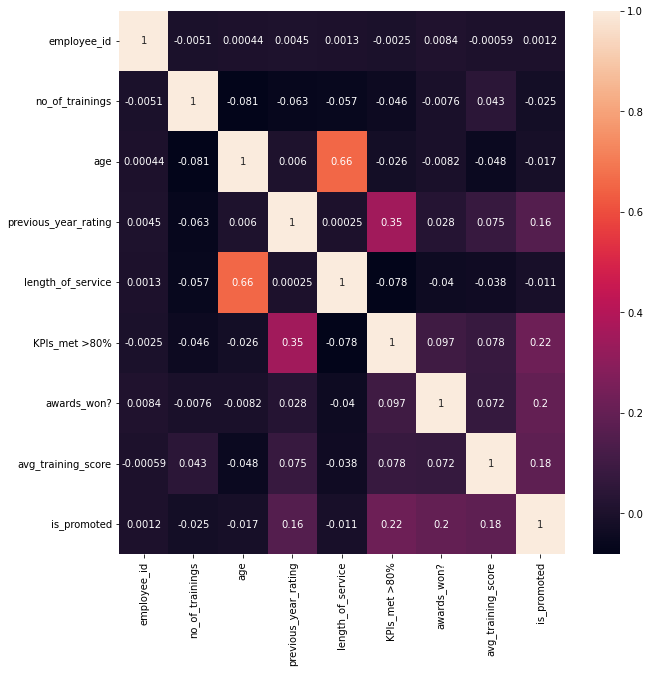

In [130]:
# start dataset
f,ax=plt.subplots(figsize=(10,10))
sns.heatmap(hr.corr(),annot=True)#,linewidths=5,fmt='.1f',ax=ax)
#plt.show()

<AxesSubplot:>

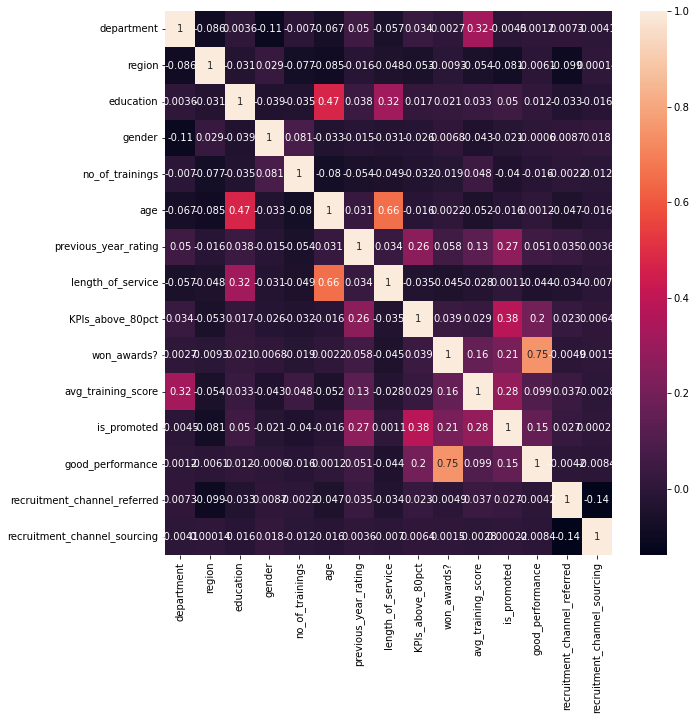

In [131]:
# final data after sampling
f,ax=plt.subplots(figsize=(10,10))
sns.heatmap(hr_final.corr(),annot=True)#,linewidths=5,fmt='.1f',ax=ax)
#plt.show()

It can be seen that some correlation has decreased, while some has increased.

- KPI and previous year rating decreased from 0.35 to 0.26. 
- The created feature, 'good performance', has the highest correlation with 'won_awards?'

In [132]:
#after
correlation_matrix = hr_final.corr()

def correlated_features():
    
    # Select upper triangle of correlation matrix
    upper = correlation_matrix.where(np.triu(np.ones(correlation_matrix.shape), k=1).astype(np.bool))

    # unstacking 'upper' correlation matrix and sorting it
    upper=upper.unstack().sort_values(ascending=True)

    # Highly Positive Correlated Variables
    high_correlation=upper[(upper>=0.75) & (upper<1) & (upper!='Nan')] # Threshold is greater than or equal  to 0.75 but less than 1 
    print("The highly positively correlated features and its value are:\n{}".format(high_correlation))
    print()
    
    # Moderately Positive Correlated Variables
    mild_correlation=upper[(upper>=0.5) & (upper<0.75) & (upper!='Nan')]
    print("Moderately positive correlated features and its value are:\n{}".format(mild_correlation))
    print()

    # Highly to Moderately Negative Correlated Variables
    high_negative_correlation=upper[(upper < -0.5) & (upper!='Nan')]
    print("The highly negatively correlated variables and its value are:\n{}".format(high_negative_correlation))
    
    
# call the function    
correlated_features()

The highly positively correlated features and its value are:
good_performance  won_awards?    0.750894
dtype: float64

Moderately positive correlated features and its value are:
length_of_service  age    0.655114
dtype: float64

The highly negatively correlated variables and its value are:
Series([], dtype: float64)


C:\Users\chery\AppData\Local\Temp\ipykernel_16040\2371477230.py:7: DeprecationWarning: `np.bool` is a deprecated alias for the builtin `bool`. To silence this warning, use `bool` by itself. Doing this will not modify any behavior and is safe. If you specifically wanted the numpy scalar type, use `np.bool_` here.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  upper = correlation_matrix.where(np.triu(np.ones(correlation_matrix.shape), k=1).astype(np.bool))


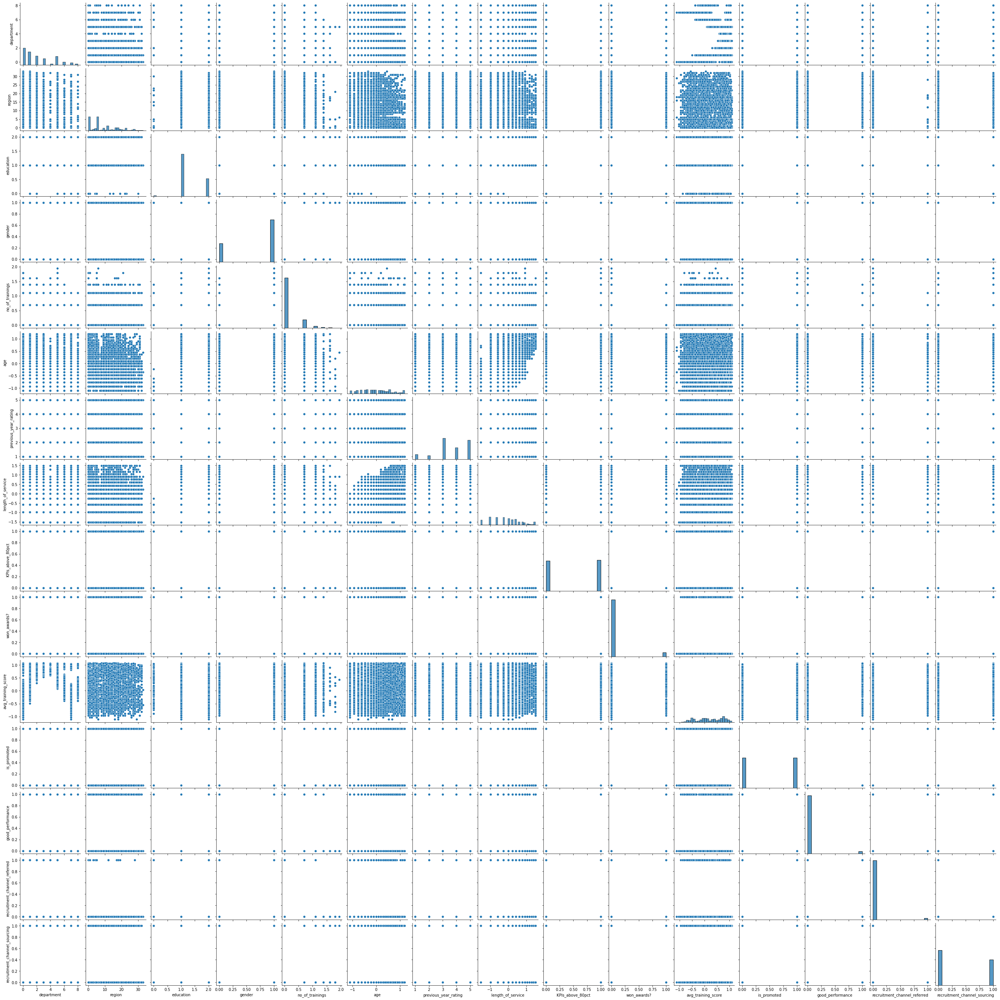

In [133]:
# PAIRPLOT
sns.pairplot(hr_final)

### Highest correlation

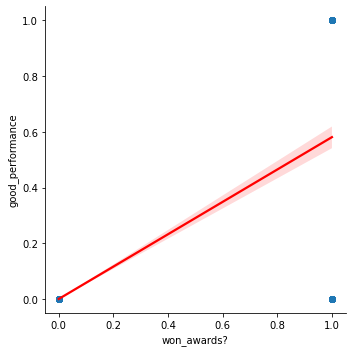

In [134]:
sns.lmplot(x='won_awards?', y='good_performance', data=hr_final, line_kws={'color': 'red'})
plt.show()  # 0.75

#Employees who had won awards tend to have good performance

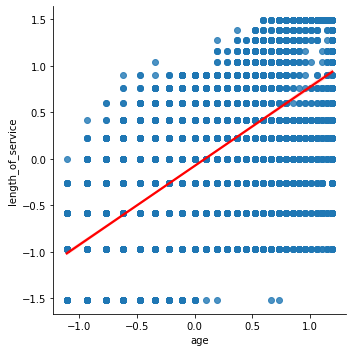

In [135]:
sns.lmplot(x='age', y='length_of_service', data=hr_final, line_kws={'color': 'red'})
plt.show()  # 0.66

#As employees' ages increase, their length of service tends to increase as well, 
#indicating a positive association between these two variables.

### Mildly High correlation

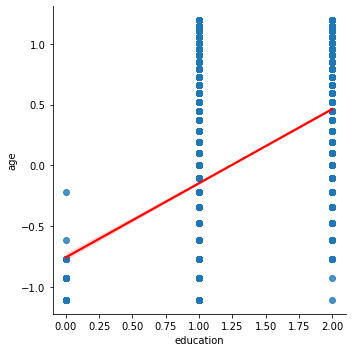

In [136]:
sns.lmplot(x='education', y='age', data=hr_final, line_kws={'color': 'red'})
plt.show()  # 0.47

#The higher the education, the older the employee

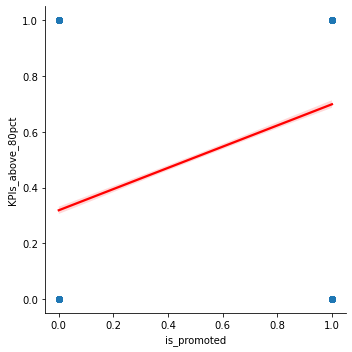

In [137]:
sns.lmplot(x='is_promoted', y='KPIs_above_80pct', data=hr_final, line_kws={'color': 'red'})
plt.show()  # 0.38

# More employees who 

### Top 3 Highest correlation with is_promoted

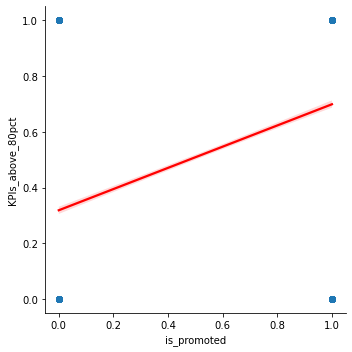

In [138]:
sns.lmplot(x='is_promoted', y='KPIs_above_80pct', data=hr_final, line_kws={'color': 'red'})
plt.show()  # 0.38

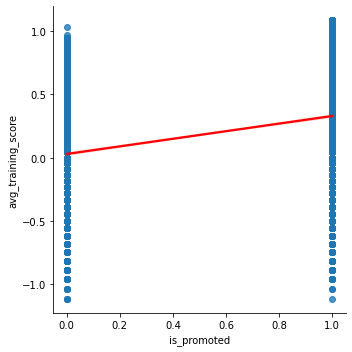

In [139]:
sns.lmplot(x='is_promoted', y='avg_training_score', data=hr_final, line_kws={'color': 'red'})
plt.show()  # 0.28

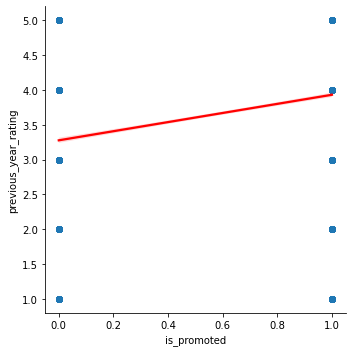

In [140]:
sns.lmplot(x='is_promoted', y='previous_year_rating', data=hr_final, line_kws={'color': 'red'})
plt.show()  # 0.27

They have a positive linear relationship and fall within the range of moderate to weak correlation.

### 1.4 `Export the data`  <a id="part1.4"></a> 

In [141]:
hr_final.head()

,department,region,education,gender,no_of_trainings,age,previous_year_rating,length_of_service,KPIs_above_80pct,won_awards?,avg_training_score,is_promoted,good_performance,recruitment_channel_referred,recruitment_channel_sourcing
11,0,0,1,0,0.0,0.195654,5.0,-0.577225,1,0,-0.497984,1,0,0,1
39,0,16,1,1,0.0,0.000000,5.0,0.225149,1,0,-0.440835,1,0,0,1
60,0,9,2,1,0.0,1.150160,4.0,1.488471,1,0,-0.681614,1,0,0,0
66,6,1,1,1,0.0,-0.767191,3.0,-1.515579,1,1,-0.087941,1,1,0,0
67,0,1,1,1,0.0,-0.767191,3.0,-1.515579,0,0,0.042138,1,0,0,1


In [142]:
# Assuming df is your DataFrame with 'is_promoted' as the target variable
target_variable = hr_final.pop('is_promoted')

# Move the target variable to the most right-hand side
hr_final['is_promoted'] = target_variable
hr_final.head()

,department,region,education,gender,no_of_trainings,age,previous_year_rating,length_of_service,KPIs_above_80pct,won_awards?,avg_training_score,good_performance,recruitment_channel_referred,recruitment_channel_sourcing,is_promoted
11,0,0,1,0,0.0,0.195654,5.0,-0.577225,1,0,-0.497984,0,0,1,1
39,0,16,1,1,0.0,0.000000,5.0,0.225149,1,0,-0.440835,0,0,1,1
60,0,9,2,1,0.0,1.150160,4.0,1.488471,1,0,-0.681614,0,0,0,1
66,6,1,1,1,0.0,-0.767191,3.0,-1.515579,1,1,-0.087941,1,0,0,1
67,0,1,1,1,0.0,-0.767191,3.0,-1.515579,0,0,0.042138,0,0,1,1


In [143]:
# Write prepared data to csv file
# Enter your code here:
hr_final.to_csv('hr_data_new.csv', index=False)

## 2. Airbnb

### 2.1 `Load and Explore the data`  <a id="part2.1"></a> 

In [144]:
# Load Data
missing_values = [" "] #to identify missing values
listings = pd.read_csv('listings.csv', na_values = missing_values)

# Create a copy of the DataFrame
list_new = listings.copy()

# Show overview of the dataset
list_new.head()

,id,name,host_id,host_name,neighbourhood_group,neighbourhood,latitude,longitude,room_type,price,minimum_nights,number_of_reviews,last_review,reviews_per_month,calculated_host_listings_count,availability_365
0,49091,COZICOMFORT LONG TERM STAY ROOM 2,266763,Francesca,North Region,Woodlands,1.44255,103.79580,Private room,83,180,1,2013-10-21,0.01,2,365
1,50646,Pleasant Room along Bukit Timah,227796,Sujatha,Central Region,Bukit Timah,1.33235,103.78521,Private room,81,90,18,2014-12-26,0.28,1,365
2,56334,COZICOMFORT,266763,Francesca,North Region,Woodlands,1.44246,103.79667,Private room,69,6,20,2015-10-01,0.20,2,365
3,71609,Ensuite Room (Room 1 & 2) near EXPO,367042,Belinda,East Region,Tampines,1.34541,103.95712,Private room,206,1,14,2019-08-11,0.15,9,353
4,71896,B&B Room 1 near Airport & EXPO,367042,Belinda,East Region,Tampines,1.34567,103.95963,Private room,94,1,22,2019-07-28,0.22,9,355


In [145]:
list_new.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 7907 entries, 0 to 7906
Data columns (total 16 columns):
 #   Column                          Non-Null Count  Dtype  
---  ------                          --------------  -----  
 0   id                              7907 non-null   int64  
 1   name                            7905 non-null   object 
 2   host_id                         7907 non-null   int64  
 3   host_name                       7907 non-null   object 
 4   neighbourhood_group             7907 non-null   object 
 5   neighbourhood                   7907 non-null   object 
 6   latitude                        7907 non-null   float64
 7   longitude                       7907 non-null   float64
 8   room_type                       7907 non-null   object 
 9   price                           7907 non-null   int64  
 10  minimum_nights                  7907 non-null   int64  
 11  number_of_reviews               7907 non-null   int64  
 12  last_review                     51

In [146]:
list_new.shape

(7907, 16)

In [147]:
print("The number of duplicated rows in the dataset is", list_new.duplicated().sum())

The number of duplicated rows in the dataset is 0


There are not duplicate values. This is important so that we ensure all rows are unique.

In [148]:
list_new.describe()

,id,host_id,latitude,longitude,price,minimum_nights,number_of_reviews,reviews_per_month,calculated_host_listings_count,availability_365
count,7.907000e+03,7.907000e+03,7907.000000,7907.000000,7907.000000,7907.000000,7907.000000,5149.000000,7907.000000,7907.000000
mean,2.338862e+07,9.114481e+07,1.314192,103.848787,169.332996,17.510054,12.807386,1.043669,40.607689,208.726318
std,1.016416e+07,8.190910e+07,0.030577,0.043675,340.187599,42.094616,29.707746,1.285851,65.135253,146.120034
min,4.909100e+04,2.366600e+04,1.243870,103.646560,0.000000,1.000000,0.000000,0.010000,1.000000,0.000000
25%,1.582180e+07,2.305808e+07,1.295795,103.835825,65.000000,1.000000,0.000000,0.180000,2.000000,54.000000
50%,2.470627e+07,6.344891e+07,1.311030,103.849410,124.000000,3.000000,2.000000,0.550000,9.000000,260.000000
75%,3.234850e+07,1.553811e+08,1.322110,103.872535,199.000000,10.000000,10.000000,1.370000,48.000000,355.000000
max,3.811276e+07,2.885676e+08,1.454590,103.973420,10000.000000,1000.000000,323.000000,13.000000,274.000000,365.000000


In [149]:
list_new.corr()

,id,host_id,latitude,longitude,price,minimum_nights,number_of_reviews,reviews_per_month,calculated_host_listings_count,availability_365
id,1.000000,0.541770,-0.112042,-0.004701,0.049324,-0.083037,-0.341513,0.199958,0.245014,0.113259
host_id,0.541770,1.000000,-0.041237,-0.016341,0.038802,-0.089862,-0.175573,0.169950,-0.063522,0.041840
latitude,-0.112042,-0.041237,1.000000,-0.034970,-0.073990,0.084924,-0.015022,-0.029580,-0.149961,-0.068740
longitude,-0.004701,-0.016341,-0.034970,1.000000,-0.030436,-0.029208,0.102109,0.117578,0.049416,-0.035727
price,0.049324,0.038802,-0.073990,-0.030436,1.000000,-0.012214,-0.042013,0.000920,0.016555,0.017451
minimum_nights,-0.083037,-0.089862,0.084924,-0.029208,-0.012214,1.000000,-0.076475,-0.139469,-0.013964,0.150356
number_of_reviews,-0.341513,-0.175573,-0.015022,0.102109,-0.042013,-0.076475,1.000000,0.627965,-0.149681,-0.066658
reviews_per_month,0.199958,0.169950,-0.029580,0.117578,0.000920,-0.139469,0.627965,1.000000,-0.195962,-0.108243
calculated_host_listings_count,0.245014,-0.063522,-0.149961,0.049416,0.016555,-0.013964,-0.149681,-0.195962,1.000000,0.246230
availability_365,0.113259,0.041840,-0.068740,-0.035727,0.017451,0.150356,-0.066658,-0.108243,0.246230,1.000000


In [150]:
list_new.nunique()

#unique data in each category

id                                7907
name                              7457
host_id                           2705
host_name                         1833
neighbourhood_group                  5
neighbourhood                       43
latitude                          4885
longitude                         5414
room_type                            3
price                              374
minimum_nights                      73
number_of_reviews                  208
last_review                       1001
reviews_per_month                  527
calculated_host_listings_count      55
availability_365                   359
dtype: int64

#### Checking Null Values

In [151]:
# Check for null values
list_new.isnull().sum()

id                                   0
name                                 2
host_id                              0
host_name                            0
neighbourhood_group                  0
neighbourhood                        0
latitude                             0
longitude                            0
room_type                            0
price                                0
minimum_nights                       0
number_of_reviews                    0
last_review                       2758
reviews_per_month                 2758
calculated_host_listings_count       0
availability_365                     0
dtype: int64

In [152]:
# Display rows where the 'name' column is null
null_name_rows = list_new[list_new['name'].isnull()]

null_name_rows

,id,name,host_id,host_name,neighbourhood_group,neighbourhood,latitude,longitude,room_type,price,minimum_nights,number_of_reviews,last_review,reviews_per_month,calculated_host_listings_count,availability_365
1024,9436273,NaN,41240585,Audrey,Central Region,Bukit Merah,1.29108,103.83077,Private room,69,2,4,2015-12-13,0.09,1,0
1331,11573500,NaN,61163169,Educator,Central Region,Bishan,1.35221,103.85148,Private room,650,1,0,NaN,NaN,1,0


In [153]:
# Suspect that Is it possible that null values in last review and reviews per month are highly correlated
#(missing not at random) 
#because when one is absent, the other is absent too, and they have the same number of missing values

null_rows = list_new[list_new['last_review'].isnull() | list_new['reviews_per_month'].isnull()]

null_rows

,id,name,host_id,host_name,neighbourhood_group,neighbourhood,latitude,longitude,room_type,price,minimum_nights,number_of_reviews,last_review,reviews_per_month,calculated_host_listings_count,availability_365
18,355955,Double room in an Authentic Peranakan Shophouse,1759905,Aresha,Central Region,Geylang,1.31420,103.90232,Private room,81,90,0,NaN,NaN,1,173
23,481789,Master Bedroom in Newly Built Flat,2386154,Susan,East Region,Tampines,1.34816,103.93238,Private room,37,180,0,NaN,NaN,1,365
26,642660,BEST CITY LIVING WITH GA RESIDENCE,3212572,Roger,Central Region,Rochor,1.30109,103.85234,Private room,167,180,0,NaN,NaN,1,365
28,719944,HDB housing in prime area near town,3648224,Audrey,Central Region,Queenstown,1.30901,103.79639,Shared room,208,1,0,NaN,NaN,1,0
29,733863,Homestay at Serangoon,3824517,Shirlnet,North-East Region,Serangoon,1.36743,103.87288,Private room,26,180,0,NaN,NaN,1,365
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
7902,38105126,Loft 2 pax near Haw Par / Pasir Panjang. Free ...,278109833,Belle,Central Region,Queenstown,1.27973,103.78751,Entire home/apt,100,3,0,NaN,NaN,31,61
7903,38108273,3bedroom luxury at Orchard,238891646,Neha,Central Region,Tanglin,1.29269,103.82623,Entire home/apt,550,6,0,NaN,NaN,34,365
7904,38109336,[ Farrer Park ] New City Fringe CBD Mins to MRT,281448565,Mindy,Central Region,Kallang,1.31286,103.85996,Private room,58,30,0,NaN,NaN,3,173
7905,38110493,Cheap Master Room in Central of Singapore,243835202,Huang,Central Region,River Valley,1.29543,103.83801,Private room,56,14,0,NaN,NaN,2,30


It can be observed that when there is missing value in last_review, reviews_per_month is also null. This suggests that they are not missing at random, and may have correlation with each other.

#### Checking Unique Values

In [154]:
# The categorical variables and each of its unique values
count = 0
categorical_features = []
for col in list_new.select_dtypes(include='object').columns:
    categorical_features.append(col)
    count+=1
    print(count, col, "-", list_new[col].unique())
    print()

1 name - ['COZICOMFORT LONG TERM STAY ROOM 2' 'Pleasant Room along Bukit Timah'
 'COZICOMFORT' ... '[ Farrer Park ] New City Fringe CBD Mins to MRT'
 'Cheap Master Room in Central of Singapore'
 'Amazing room with private bathroom walk to Orchard']

2 host_name - ['Francesca' 'Sujatha' 'Belinda' ... 'Jolene' 'Ryokuka' 'Bo']

3 neighbourhood_group - ['North Region' 'Central Region' 'East Region' 'West Region'
 'North-East Region']

4 neighbourhood - ['Woodlands' 'Bukit Timah' 'Tampines' 'Bedok' 'Bukit Merah' 'Newton'
 'Geylang' 'River Valley' 'Jurong West' 'Rochor' 'Queenstown' 'Serangoon'
 'Marine Parade' 'Pasir Ris' 'Toa Payoh' 'Outram' 'Punggol' 'Tanglin'
 'Hougang' 'Kallang' 'Novena' 'Downtown Core' 'Bukit Panjang'
 'Singapore River' 'Orchard' 'Ang Mo Kio' 'Bukit Batok' 'Museum'
 'Sembawang' 'Choa Chu Kang' 'Central Water Catchment' 'Sengkang'
 'Clementi' 'Jurong East' 'Bishan' 'Yishun' 'Mandai' 'Southern Islands'
 'Sungei Kadut' 'Western Water Catchment' 'Tuas' 'Marina South'
 'Lim

In [155]:
list_new['host_name'].value_counts(dropna=False)

Jay         290
Alvin       249
Richards    157
Aaron       145
Rain        115
           ... 
Nassiba       1
Dianna        1
Geo           1
Ziad          1
Bo            1
Name: host_name, Length: 1833, dtype: int64

In [156]:
list_new['neighbourhood_group'].value_counts(dropna=False)

Central Region       6309
West Region           540
East Region           508
North-East Region     346
North Region          204
Name: neighbourhood_group, dtype: int64

In [157]:
list_new['neighbourhood'].value_counts(dropna=False)

Kallang                    1043
Geylang                     994
Novena                      537
Rochor                      536
Outram                      477
Bukit Merah                 470
Downtown Core               428
Bedok                       373
River Valley                362
Queenstown                  266
Tanglin                     210
Singapore River             175
Marine Parade               171
Jurong West                 153
Orchard                     136
Newton                      134
Bukit Timah                 131
Jurong East                 118
Hougang                     109
Clementi                    102
Toa Payoh                   101
Pasir Ris                    71
Serangoon                    69
Sengkang                     67
Woodlands                    67
Bukit Batok                  65
Tampines                     64
Museum                       63
Choa Chu Kang                63
Ang Mo Kio                   58
Bishan                       57
Yishun  

In [158]:
list_new['room_type'].value_counts(dropna=False)

Entire home/apt    4132
Private room       3381
Shared room         394
Name: room_type, dtype: int64

In [159]:
list_new['name'].value_counts(dropna=False)

Luxury hostel with in-cabin locker - Single mixed     13
Inviting & Cozy 1BR APT 3 mins from Tg Pagar MRT       9
Studio Apartment - Oakwood Premier                     9
Superhost 1BR APT in the heart of Tg Pagar             8
Tasteful & Cozy 1 BR near SGH/Tiong Bahru              8
                                                      ..
Boonlay 16sqm Cosy Master Room for Rent                1
Tanjong Pagar Pristine Studio Apartment                1
lavLoftbed *RmT, no-sharing, wifi, mrt                 1
Newly furnished spacious room                          1
Amazing room with private bathroom walk to Orchard     1
Name: name, Length: 7458, dtype: int64

In [160]:
list_new['last_review'].value_counts(dropna=False)

NaN           2758
2019-08-12     152
2019-08-11     128
2019-08-13     110
2019-08-10      87
              ... 
2016-12-03       1
2016-01-18       1
2016-07-27       1
2017-08-19       1
2019-03-22       1
Name: last_review, Length: 1002, dtype: int64

In [161]:
list_new['price'].value_counts(dropna=False)

60      218
50      209
100     189
150     174
131     171
       ... 
540       1
590       1
0         1
2083      1
510       1
Name: price, Length: 374, dtype: int64

In [162]:
list_new['minimum_nights'].value_counts(dropna=False)

1      2089
2      1388
3      1133
90      514
7       424
       ... 
70        1
240       1
17        1
500       1
59        1
Name: minimum_nights, Length: 73, dtype: int64

In [163]:
list_new['number_of_reviews'].value_counts(dropna=False)

0      2758
1      1084
2       592
3       373
4       258
       ... 
145       1
222       1
149       1
229       1
276       1
Name: number_of_reviews, Length: 208, dtype: int64

In [164]:
list_new['last_review'].value_counts(dropna=False)

NaN           2758
2019-08-12     152
2019-08-11     128
2019-08-13     110
2019-08-10      87
              ... 
2016-12-03       1
2016-01-18       1
2016-07-27       1
2017-08-19       1
2019-03-22       1
Name: last_review, Length: 1002, dtype: int64

In [165]:
list_new['reviews_per_month'].value_counts(dropna=False)

NaN     2758
1.00     172
0.04     104
0.08      96
0.05      93
        ... 
4.02       1
3.92       1
3.52       1
3.57       1
8.00       1
Name: reviews_per_month, Length: 528, dtype: int64

In [166]:
list_new['calculated_host_listings_count'].value_counts(dropna=False)

1      1965
2       644
3       339
274     274
4       216
203     203
67      201
6       192
7       189
8       184
5       175
157     157
14      154
141     141
9       135
13      130
10      120
114     114
113     113
112     112
109     109
15      105
48       96
18       90
45       90
11       88
84       84
83       83
16       80
79       79
26       78
78       78
76       76
24       72
17       68
22       66
64       64
31       62
30       60
12       60
59       59
28       56
27       54
43       43
41       41
40       40
19       38
38       38
37       37
34       34
32       32
25       25
23       23
21       21
20       20
Name: calculated_host_listings_count, dtype: int64

In [167]:
list_new['availability_365'].value_counts(dropna=False)

0      1386
365     843
364     336
362     150
358     131
       ... 
91        1
245       1
99        1
97        1
197       1
Name: availability_365, Length: 359, dtype: int64

### Numeric Data

In [168]:
list_new.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 7907 entries, 0 to 7906
Data columns (total 16 columns):
 #   Column                          Non-Null Count  Dtype  
---  ------                          --------------  -----  
 0   id                              7907 non-null   int64  
 1   name                            7905 non-null   object 
 2   host_id                         7907 non-null   int64  
 3   host_name                       7907 non-null   object 
 4   neighbourhood_group             7907 non-null   object 
 5   neighbourhood                   7907 non-null   object 
 6   latitude                        7907 non-null   float64
 7   longitude                       7907 non-null   float64
 8   room_type                       7907 non-null   object 
 9   price                           7907 non-null   int64  
 10  minimum_nights                  7907 non-null   int64  
 11  number_of_reviews               7907 non-null   int64  
 12  last_review                     51

In [169]:
list_new.describe()

,id,host_id,latitude,longitude,price,minimum_nights,number_of_reviews,reviews_per_month,calculated_host_listings_count,availability_365
count,7.907000e+03,7.907000e+03,7907.000000,7907.000000,7907.000000,7907.000000,7907.000000,5149.000000,7907.000000,7907.000000
mean,2.338862e+07,9.114481e+07,1.314192,103.848787,169.332996,17.510054,12.807386,1.043669,40.607689,208.726318
std,1.016416e+07,8.190910e+07,0.030577,0.043675,340.187599,42.094616,29.707746,1.285851,65.135253,146.120034
min,4.909100e+04,2.366600e+04,1.243870,103.646560,0.000000,1.000000,0.000000,0.010000,1.000000,0.000000
25%,1.582180e+07,2.305808e+07,1.295795,103.835825,65.000000,1.000000,0.000000,0.180000,2.000000,54.000000
50%,2.470627e+07,6.344891e+07,1.311030,103.849410,124.000000,3.000000,2.000000,0.550000,9.000000,260.000000
75%,3.234850e+07,1.553811e+08,1.322110,103.872535,199.000000,10.000000,10.000000,1.370000,48.000000,355.000000
max,3.811276e+07,2.885676e+08,1.454590,103.973420,10000.000000,1000.000000,323.000000,13.000000,274.000000,365.000000


In [170]:
l_num = list_new[['price', 'minimum_nights','number_of_reviews','reviews_per_month','calculated_host_listings_count',
                'availability_365']]
l_num

#Features such as ‘id’, ‘host_id’, ‘longitude’, ‘latitude’ are excluded. 
#This is to provide a more insightful analysis later

,price,minimum_nights,number_of_reviews,reviews_per_month,calculated_host_listings_count,availability_365
0,83,180,1,0.01,2,365
1,81,90,18,0.28,1,365
2,69,6,20,0.20,2,365
3,206,1,14,0.15,9,353
4,94,1,22,0.22,9,355
...,...,...,...,...,...,...
7902,100,3,0,NaN,31,61
7903,550,6,0,NaN,34,365
7904,58,30,0,NaN,3,173
7905,56,14,0,NaN,2,30


#### Shape and Distribution

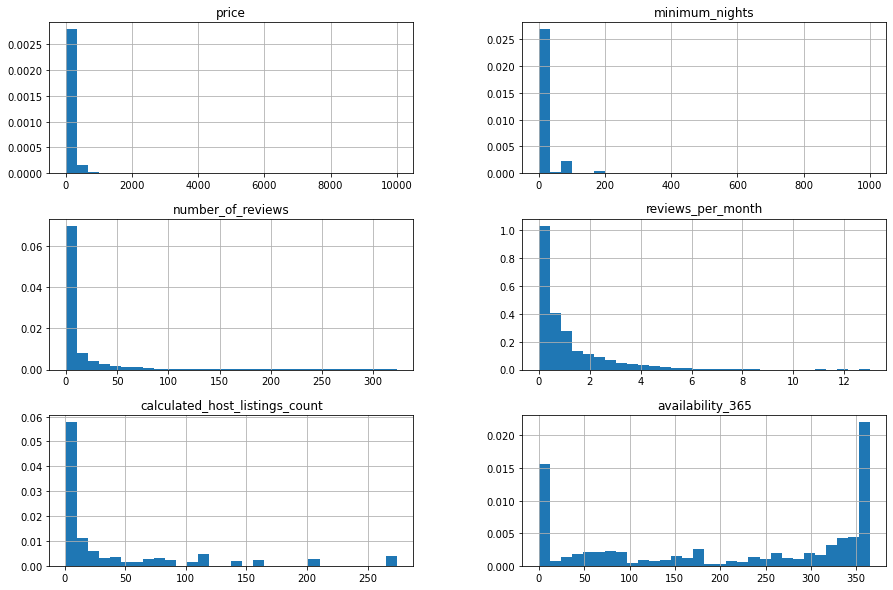

In [171]:
l_num.hist(bins=30, figsize=(15,10), density=True)
plt.show()

In [172]:
from scipy.stats import skew
import numpy as np

# Calculate and print standard deviation and skewness for each numerical column
for column in l_num.columns:
    print(f"Column: {column}")
    print('Std: ', np.std(l_num[column]))
    print('Skew: ', skew(l_num[column]))
    print()

Column: price
Std:  340.16608665971216
Skew:  19.08916071803932

Column: minimum_nights
Std:  42.09195452488343
Skew:  6.101734383851633

Column: number_of_reviews
Std:  29.705867337561106
Skew:  4.424673862107274

Column: reviews_per_month
Std:  1.2857263665040142
Skew:  nan

Column: calculated_host_listings_count
Std:  65.13113412891232
Skew:  2.149178115917921

Column: availability_365
Std:  146.11079427270738
Skew:  -0.30553679645903375



**Price:**

- Standard Deviation (Std): The relatively high standard deviation (340.17) suggests a wide variability in listing prices, indicating a significant range in the pricing structure.
- Skewness (Skew): The skewness of 19.09 indicates a highly right-skewed distribution, suggesting that the majority of listings have lower prices, with a long tail towards higher-priced listings.

**Minimum Nights:**

- Standard Deviation (Std): The standard deviation of 42.09 implies considerable variability in the minimum nights required for booking, indicating diversity in hosting policies.
- Skewness (Skew): The skewness of 6.10 indicates a right-skewed distribution, suggesting that most listings have a lower minimum nights requirement, with a tail towards longer minimum stays.

**Number of Reviews:**

- Standard Deviation (Std): The standard deviation of 29.71 suggests variability in the number of reviews, reflecting diversity in the popularity and engagement levels of listings.
- Skewness (Skew): The skewness of 4.42 indicates a right-skewed distribution, suggesting that most listings have fewer reviews, with a long tail towards listings with higher review counts.

**Reviews per Month:**

- Standard Deviation (Std): The standard deviation of 1.29 suggests relatively low variability in the reviews per month.
- Skewness (Skew): The presence of 'nan' for skewness indicates potential issues with the distribution. Further investigation is needed to address this.

**Calculated Host Listings Count:**

- Standard Deviation (Std): The higher standard deviation of 65.13 suggests a wide variability in the count of listings by hosts, indicating diversity in host engagement.
- Skewness (Skew): The skewness of 2.15 indicates a moderately right-skewed distribution, suggesting that most hosts manage a few listings, with a tail towards hosts with a higher number of listings.

**Availability 365:**

- Standard Deviation (Std): The standard deviation of 146.11 suggests variability in the availability of listings throughout the year.
- Skewness (Skew): The negative skewness (-0.31) indicates a slightly left-skewed distribution, suggesting that most listings have higher availability, with a tail towards listings with lower availability.

### Outliers

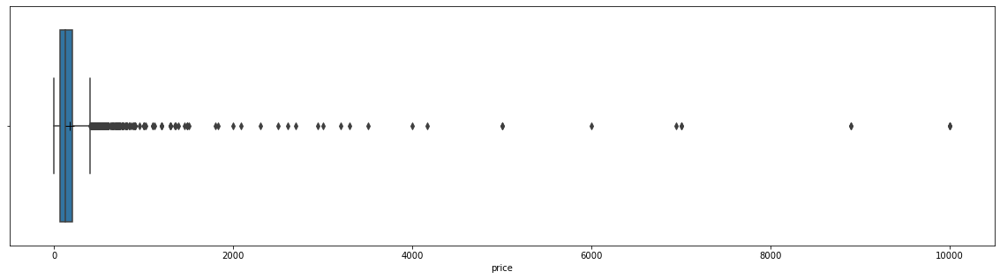

count     7907.000000
mean       169.332996
std        340.187599
min          0.000000
25%         65.000000
50%        124.000000
75%        199.000000
max      10000.000000
Name: price, dtype: float64

In [173]:
# Outlier check using Boxplot 
plt.figure(figsize=(20,5))
sns.boxplot(x=list_new['price'], showmeans=True,
           meanprops={"marker": "+",
                       "markeredgecolor": "black",
                       "markersize": "10"});
plt.show()

list_new['price'].describe()

In [174]:
# Q1 = 65; Q3 = 199; IQR = Q3 - Q1 = 134
# Median = Q2 = 124
# "Maximum" = Q3 + 1.5 * IQR = 400
# "Minimum" = Q1 - 1.5 * IQR = -136
# Outliers are the price above 400 

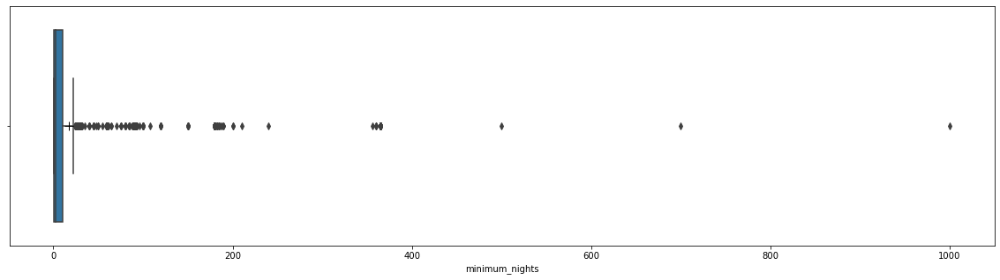

count    7907.000000
mean       17.510054
std        42.094616
min         1.000000
25%         1.000000
50%         3.000000
75%        10.000000
max      1000.000000
Name: minimum_nights, dtype: float64

In [175]:
# Outlier check using Boxplot 
plt.figure(figsize=(20,5))
sns.boxplot(x=list_new['minimum_nights'], showmeans=True,
           meanprops={"marker": "+",
                       "markeredgecolor": "black",
                       "markersize": "10"});
plt.show()

list_new['minimum_nights'].describe()

In [176]:
# Q1 = 1; Q3 = 10; IQR = Q3 - Q1 = 9
# Median = Q2 = 3
# "Maximum" = Q3 + 1.5 * IQR = 23.5
# "Minimum" = Q1 - 1.5 * IQR = -12.5
# Outliers are 24 and above

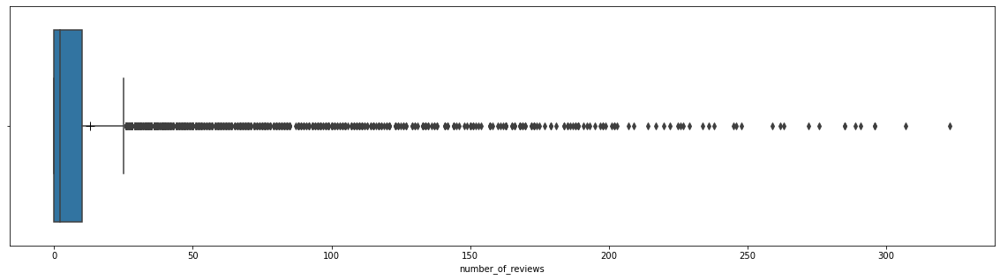

count    7907.000000
mean       12.807386
std        29.707746
min         0.000000
25%         0.000000
50%         2.000000
75%        10.000000
max       323.000000
Name: number_of_reviews, dtype: float64

In [177]:
# Outlier check using Boxplot 
plt.figure(figsize=(20,5))
sns.boxplot(x=list_new['number_of_reviews'], showmeans=True,
           meanprops={"marker": "+",
                       "markeredgecolor": "black",
                       "markersize": "10"});
plt.show()

list_new['number_of_reviews'].describe()

In [178]:
# Q1 = 0; Q3 = 10; IQR = Q3 - Q1 = 9
# Median = Q2 = 2
# "Maximum" = Q3 + 1.5 * IQR = 23.5
# "Minimum" = Q1 - 1.5 * IQR = -13.5
# Outliers are above 23.

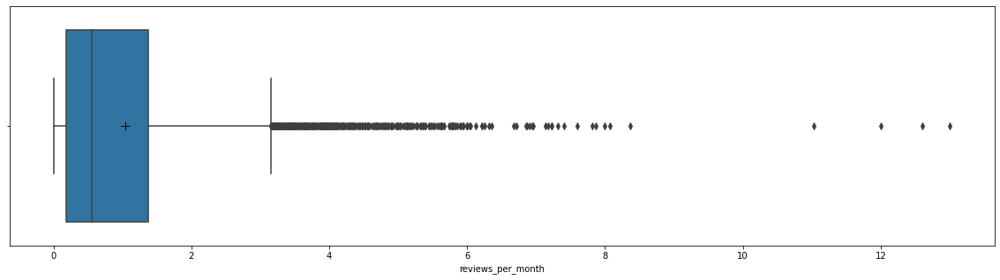

count    5149.000000
mean        1.043669
std         1.285851
min         0.010000
25%         0.180000
50%         0.550000
75%         1.370000
max        13.000000
Name: reviews_per_month, dtype: float64

In [179]:
# Outlier check using Boxplot 
plt.figure(figsize=(20,5))
sns.boxplot(x=list_new['reviews_per_month'], showmeans=True,
           meanprops={"marker": "+",
                       "markeredgecolor": "black",
                       "markersize": "10"});
plt.show()

list_new['reviews_per_month'].describe()

In [180]:
# Q1 = 0.18; Q3 = 1.37; IQR = Q3 - Q1 = 1.19
# Median = Q2 = 0.55
# "Maximum" = Q3 + 1.5 * IQR = 3.155
# "Minimum" = Q1 - 1.5 * IQR = -1.605
# Outliers are above 3.155 

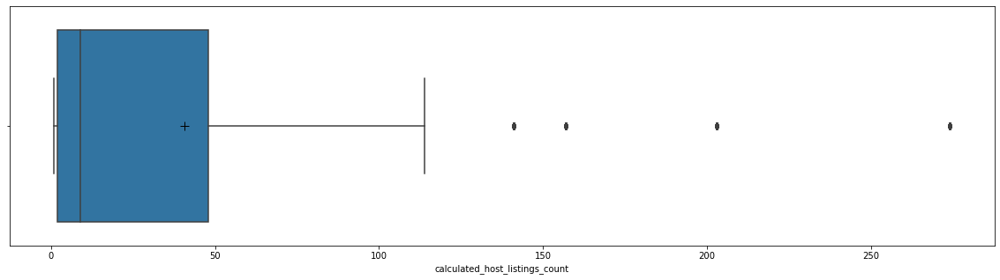

count    7907.000000
mean       40.607689
std        65.135253
min         1.000000
25%         2.000000
50%         9.000000
75%        48.000000
max       274.000000
Name: calculated_host_listings_count, dtype: float64

In [181]:
# Outlier check using Boxplot 
plt.figure(figsize=(20,5))
sns.boxplot(x=list_new['calculated_host_listings_count'], showmeans=True,
           meanprops={"marker": "+",
                       "markeredgecolor": "black",
                       "markersize": "10"});
plt.show()

list_new['calculated_host_listings_count'].describe()

In [182]:
# Q1 = 2; Q3 = 48; IQR = Q3 - Q1 = 46
# Median = Q2 = 9
# "Maximum" = Q3 + 1.5 * IQR = 117
# "Minimum" = Q1 - 1.5 * IQR = -67
# Outliers are above 117

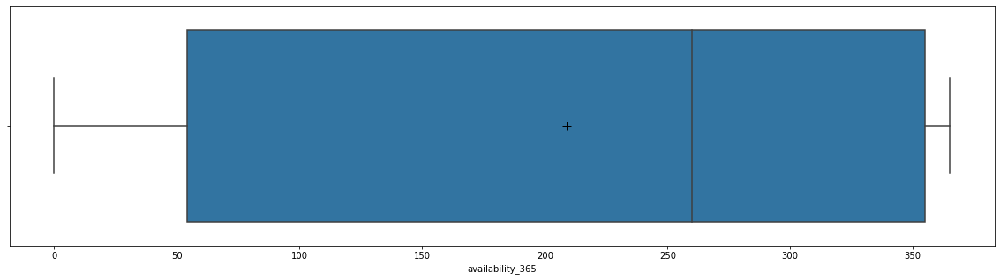

count    7907.000000
mean      208.726318
std       146.120034
min         0.000000
25%        54.000000
50%       260.000000
75%       355.000000
max       365.000000
Name: availability_365, dtype: float64

In [183]:
# Outlier check using Boxplot 
plt.figure(figsize=(20,5))
sns.boxplot(x=list_new['availability_365'], showmeans=True,
           meanprops={"marker": "+",
                       "markeredgecolor": "black",
                       "markersize": "10"});
plt.show()

list_new['availability_365'].describe()

In [184]:
# Q1 = 54; Q3 = 355; IQR = Q3 - Q1 = 301
# Median = Q2 = 260
# "Maximum" = Q3 + 1.5 * IQR = 806
# "Minimum" = Q1 - 1.5 * IQR = -397.5
# There are no outliers, outlier handling is not needed for this feature

<AxesSubplot:>

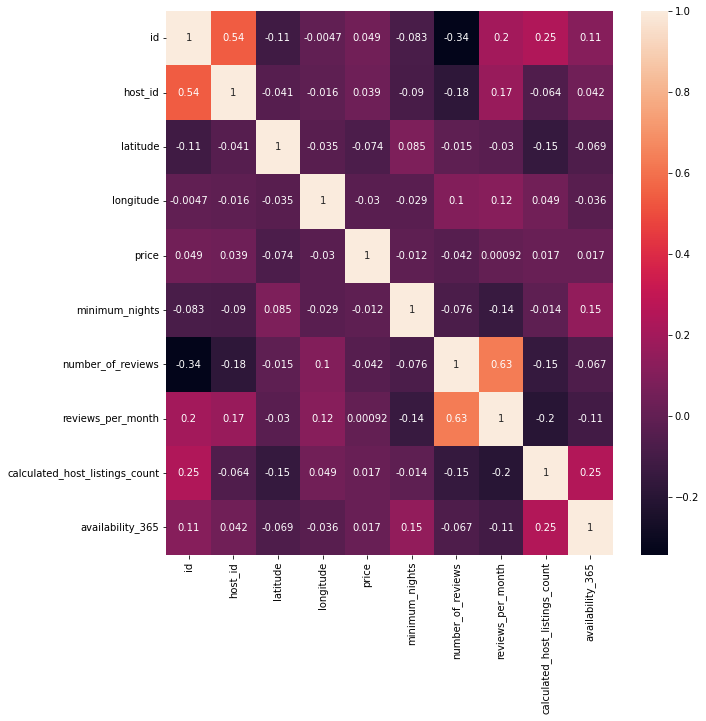

In [185]:
f,ax=plt.subplots(figsize=(10,10))
sns.heatmap(list_new.corr(),annot=True)

The heat map only provides information on the correlation for columns with numerical values. This shows that the variables that have the highest correlation ( close to 1 or -1, 1 if positively correlated. -1 if negatively correlated) are the id and host_id columns and the number_of_reviews and Reviews_per_month. This was expected as these columns refer to very similar things.

In this case, I am going to examine further the variables that are affecting the price. From the heatmap above none of the numerical values seem to have a high correlation with the proce. Therefore, the next step will will to understand whether the price is affected by the categorical values (neighbourhood_group, neighbourhood, room_type). However, before that I want to study the scatterplots for clearer understanding of the correlation.

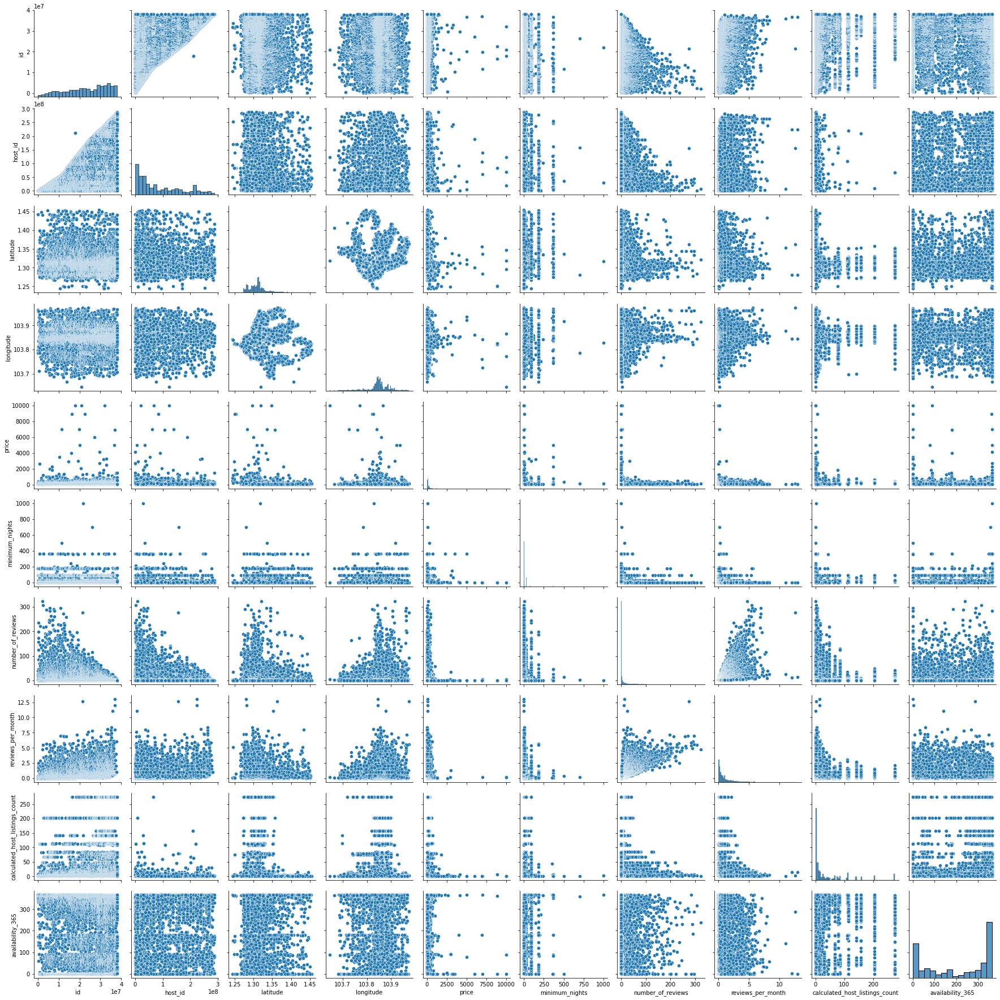

In [186]:
# PAIRPLOT
sns.pairplot(list_new)

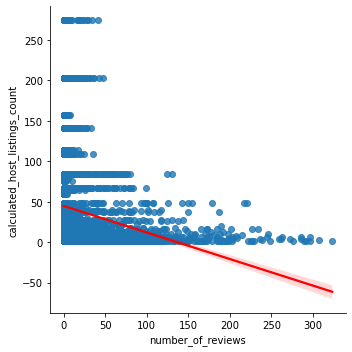

In [187]:
sns.lmplot(x='number_of_reviews', y='calculated_host_listings_count', data=list_new, line_kws={'color': 'red'})
plt.show()  # Display the plot

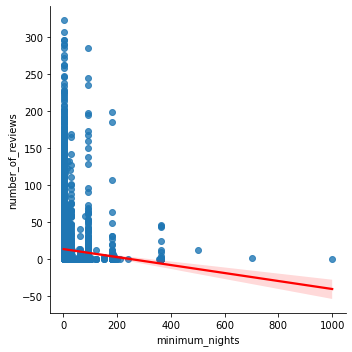

In [188]:
sns.lmplot(x='minimum_nights', y='number_of_reviews', data=list_new, line_kws={'color': 'red'})
plt.show()  # Display the plot

#### Against price

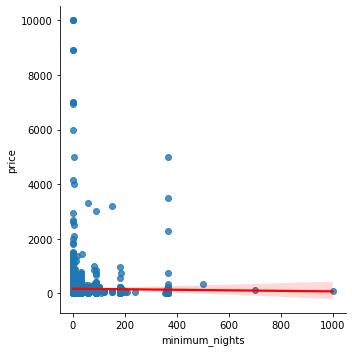

In [189]:
sns.lmplot(x='minimum_nights', y='price', data=list_new, line_kws={'color': 'red'})
plt.show()  # Display the plot

#most of them are cluttered ard a min night of 0, with a low price

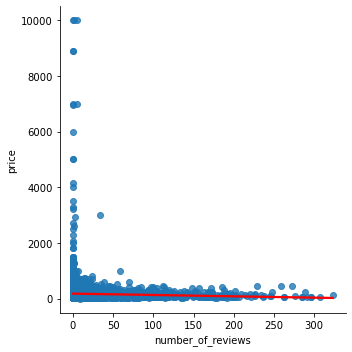

In [190]:
sns.lmplot(x='number_of_reviews', y='price', data=list_new, line_kws={'color': 'red'})
plt.show()  # Display the plot

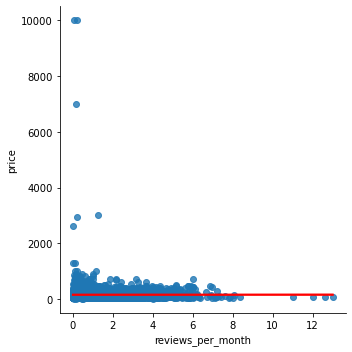

In [191]:
sns.lmplot(x='reviews_per_month', y='price', data=list_new, line_kws={'color': 'red'})
plt.show()  # Display the plot

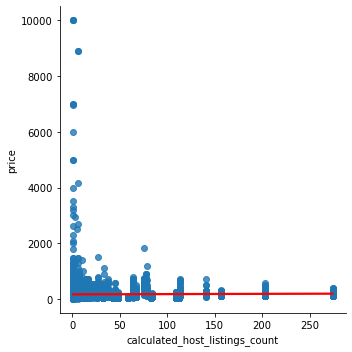

In [192]:
sns.lmplot(x='calculated_host_listings_count', y='price', data=list_new, line_kws={'color': 'red'})
plt.show()  # Display the plot

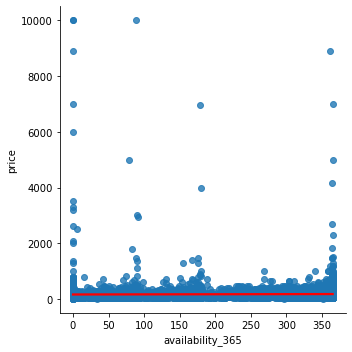

In [193]:
sns.lmplot(x='availability_365', y='price', data=list_new, line_kws={'color': 'red'})
plt.show()  # Display the plot

All numerical values have no correlation with price (the target).

### Categorical Data

In [194]:
list_new.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 7907 entries, 0 to 7906
Data columns (total 16 columns):
 #   Column                          Non-Null Count  Dtype  
---  ------                          --------------  -----  
 0   id                              7907 non-null   int64  
 1   name                            7905 non-null   object 
 2   host_id                         7907 non-null   int64  
 3   host_name                       7907 non-null   object 
 4   neighbourhood_group             7907 non-null   object 
 5   neighbourhood                   7907 non-null   object 
 6   latitude                        7907 non-null   float64
 7   longitude                       7907 non-null   float64
 8   room_type                       7907 non-null   object 
 9   price                           7907 non-null   int64  
 10  minimum_nights                  7907 non-null   int64  
 11  number_of_reviews               7907 non-null   int64  
 12  last_review                     51

In [195]:
l_cat = list_new.select_dtypes(include=['object'])
l_cat.columns

Index(['name', 'host_name', 'neighbourhood_group', 'neighbourhood',
       'room_type', 'last_review'],
      dtype='object')

In [196]:
l_cat.head()

,name,host_name,neighbourhood_group,neighbourhood,room_type,last_review
0,COZICOMFORT LONG TERM STAY ROOM 2,Francesca,North Region,Woodlands,Private room,2013-10-21
1,Pleasant Room along Bukit Timah,Sujatha,Central Region,Bukit Timah,Private room,2014-12-26
2,COZICOMFORT,Francesca,North Region,Woodlands,Private room,2015-10-01
3,Ensuite Room (Room 1 & 2) near EXPO,Belinda,East Region,Tampines,Private room,2019-08-11
4,B&B Room 1 near Airport & EXPO,Belinda,East Region,Tampines,Private room,2019-07-28


In [197]:
average_price_by_host = list_new.groupby('host_name')['price'].mean()

# Get the top 10 host names by average price
top_10_hosts = average_price_by_host.nlargest(10)

# Print the result
print(top_10_hosts)

#can see that these are the top 10 that sells the highest average price for their listings, may help to identify what range
#the predicted price will be just by seeing the host name

host_name
Yolivia     10000.000000
X-Roy        7000.000000
Xia          5000.000000
Dara         2604.000000
Darren       2345.000000
Benedict     2300.000000
Zsolt        2083.000000
Jj           2048.000000
Lin          2045.000000
Kim (金)      1952.666667
Name: price, dtype: float64


In [198]:
average_price_by_host = list_new.groupby('host_name')['number_of_reviews'].mean()

# Get the top 10 host names by average price
top_10_hosts = average_price_by_host.nlargest(10)

# Print the result
print(top_10_hosts)

host_name
Callie & Kel        289.00
Joen                229.00
Erin                209.75
Jv                  202.00
Y                   195.00
Attari              192.50
Jois                188.00
Mi                  184.00
Poh Heng Anthony    179.00
Yuan                174.20
Name: number_of_reviews, dtype: float64


C:\Users\chery\anaconda3\lib\site-packages\seaborn\_decorators.py:36: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


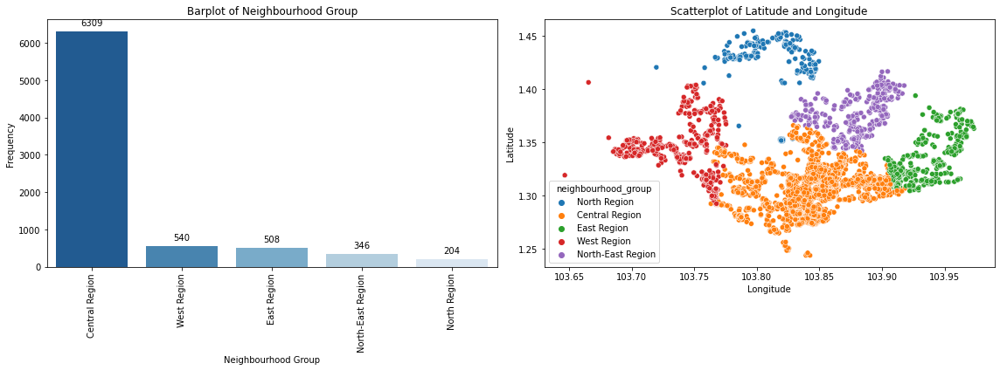

In [199]:
import matplotlib.pyplot as plt
import seaborn as sns

# Set the size of the plots
fig, axes = plt.subplots(nrows=1, ncols=2, figsize=(16, 6))

# Plot 1 - Countplot
ax1 = sns.countplot(x='neighbourhood_group', data=list_new, palette='Blues_r', order=list_new['neighbourhood_group'].value_counts().index, ax=axes[0])
for p in ax1.patches:
    ax1.annotate(f'{p.get_height()}', (p.get_x() + p.get_width() / 2., p.get_height()),
                ha='center', va='center', xytext=(0, 10), textcoords='offset points', fontsize=10, color='black')
ax1.set_xticklabels(ax1.get_xticklabels(), rotation=90)
ax1.set_title('Barplot of Neighbourhood Group')
ax1.set_xlabel('Neighbourhood Group')
ax1.set_ylabel('Frequency')

# Plot 2 - Scatterplot
ax2 = sns.scatterplot(list_new.longitude, list_new.latitude, hue=list_new.neighbourhood_group, ax=axes[1])
ax2.set_title('Scatterplot of Latitude and Longitude')
ax2.set_xlabel('Longitude')
ax2.set_ylabel('Latitude')

# Adjust layout to prevent overlapping
plt.tight_layout()

# Show the plots
plt.show()


In the bar chart, it can be observed that Central Region has the highest number of listings by alot, dominating the rest of the regions at 6309. In stark contrast, all other regions trail behind, with their listing counts ranging from 540 and below.

In the scatterplot, we can see the distribution of the listings around Singapore. We are able to see a denser clutter at the Central Region.

From here, as most of our data are from Central Region, I will choose to subset the data to focus on Central Region to build a customised price prediction model at the end. This will allow the prediction to be more effective.

However, subsetting the data will be done right before model training as it strikes a balance between initial exploration and later-stage adaptability, allowing for an informed, flexible, and contextually optimized approach to model development.

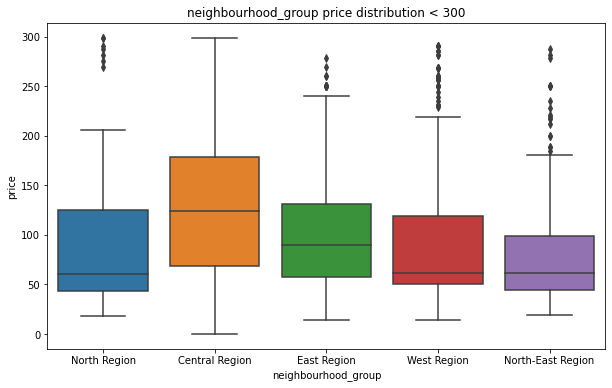

In [200]:
cutoff = list_new[list_new.price <300]
plt.figure(figsize=(10,6))
sns.boxplot(y="price",x ='neighbourhood_group' ,data = cutoff)
plt.title("neighbourhood_group price distribution < 300")
plt.show()

#there are alot of outliers in the price of listings in some of these regions, hence this code is altered so that
#we can analyse the region with the most expensive listings

From this chart, we can see that generally, Central Region has more expensive listings compared to the other regions.

This can be expected as being in Central may mean it is closer to amenities such as the MRT, malls, etc. 

<Figure size 720x432 with 0 Axes>

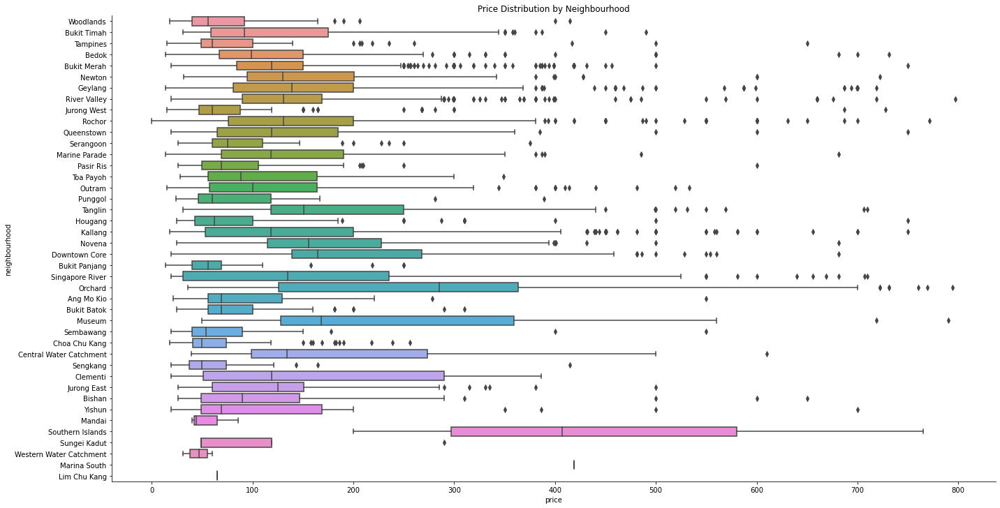

In [201]:
cutoff = list_new[list_new.price <800]
plt.figure(figsize=(10, 6))

# Make the catplot horizontal
sns.catplot(x="price", y="neighbourhood", data=cutoff, kind="box", height=10, aspect=2, orient='h');

# Customize the title
plt.title("Price Distribution by Neighbourhood")

# Show the plot
plt.show()


Can easily see Southern Islands consists of the most expensive listings.

In [202]:
grouped_neighborhoods = list_new.groupby('neighbourhood_group')['neighbourhood'].value_counts()

grouped_neighborhoods


neighbourhood_group  neighbourhood          
Central Region       Kallang                    1043
                     Geylang                     994
                     Novena                      537
                     Rochor                      536
                     Outram                      477
                     Bukit Merah                 470
                     Downtown Core               428
                     River Valley                362
                     Queenstown                  266
                     Tanglin                     210
                     Singapore River             175
                     Marine Parade               171
                     Orchard                     136
                     Newton                      134
                     Bukit Timah                 131
                     Toa Payoh                   101
                     Museum                       63
                     Bishan                       57
 

Now that we know that Southern Island belongs to Central Region, it may be the one pulling the price distribution of Central Region higher than the rest. 

<Figure size 1080x720 with 0 Axes>

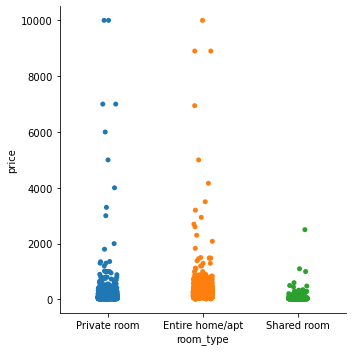

In [203]:
#catplot room type and price
plt.figure(figsize=(15,10))
sns.catplot(x="room_type", y="price", data=list_new);
plt.ioff()

#can see which one most popular and most rooms price lie around what price

Private Room and Entire home/apt is more popular than Shared room.

Price of Private Room and Entire home/apt also seem to have pricier listings, compared to Shared room.

The prices of Shared room clutters at the bottom and maximum price only at around 3500, whereas the other 2 has a few listings at a more expnsive price, with the most expensive being at 10000.

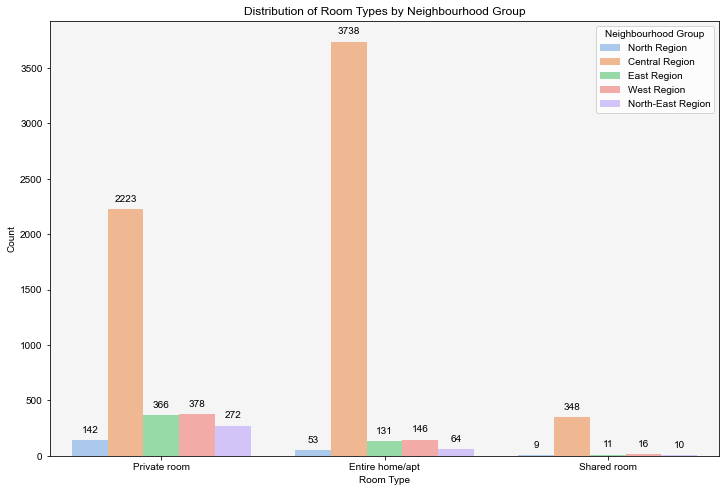

In [204]:
plt.figure(figsize=(12, 8))

# Customize the color palette
custom_palette = sns.color_palette("pastel")

# Create a countplot with a customized color palette
ax = sns.countplot(x='room_type', hue='neighbourhood_group', data=list_new, palette=custom_palette)

# Add values on top of each bar
for p in ax.patches:
    ax.annotate(f'{p.get_height()}', (p.get_x() + p.get_width() / 2., p.get_height()),
                ha='center', va='center', xytext=(0, 10), textcoords='offset points', fontsize=10, color='black')

# Customize the title and labels
plt.title("Distribution of Room Types by Neighbourhood Group")
plt.xlabel("Room Type")
plt.ylabel("Count")

# Customize the legend
plt.legend(title="Neighbourhood Group", loc='upper right')

# Customize the grid and background color
sns.set(style="whitegrid")
ax.set_facecolor("whitesmoke")

# Show the plot
plt.show()


This provides deeper analysis of the room type and neighbourhood group. 

This very clearly shows that Private Room and Entire home/apt is more popular than Shared room, as the number of listings in Shared room are mostly double digits, except for Central Region.

Interesting to note:
Even though Central Region has the most number of listings of Entire home/apt, the rest of the regions has the most number of listings for Private room, rather than Entire home/apt.

### Data Wrangling

In [205]:
list_new.columns
list_2=list_new.copy()

In [206]:
list_new.head()

,id,name,host_id,host_name,neighbourhood_group,neighbourhood,latitude,longitude,room_type,price,minimum_nights,number_of_reviews,last_review,reviews_per_month,calculated_host_listings_count,availability_365
0,49091,COZICOMFORT LONG TERM STAY ROOM 2,266763,Francesca,North Region,Woodlands,1.44255,103.79580,Private room,83,180,1,2013-10-21,0.01,2,365
1,50646,Pleasant Room along Bukit Timah,227796,Sujatha,Central Region,Bukit Timah,1.33235,103.78521,Private room,81,90,18,2014-12-26,0.28,1,365
2,56334,COZICOMFORT,266763,Francesca,North Region,Woodlands,1.44246,103.79667,Private room,69,6,20,2015-10-01,0.20,2,365
3,71609,Ensuite Room (Room 1 & 2) near EXPO,367042,Belinda,East Region,Tampines,1.34541,103.95712,Private room,206,1,14,2019-08-11,0.15,9,353
4,71896,B&B Room 1 near Airport & EXPO,367042,Belinda,East Region,Tampines,1.34567,103.95963,Private room,94,1,22,2019-07-28,0.22,9,355


In [207]:
list_2['name'] = list_2['name'].str.lower()
list_2.head() #after

,id,name,host_id,host_name,neighbourhood_group,neighbourhood,latitude,longitude,room_type,price,minimum_nights,number_of_reviews,last_review,reviews_per_month,calculated_host_listings_count,availability_365
0,49091,cozicomfort long term stay room 2,266763,Francesca,North Region,Woodlands,1.44255,103.79580,Private room,83,180,1,2013-10-21,0.01,2,365
1,50646,pleasant room along bukit timah,227796,Sujatha,Central Region,Bukit Timah,1.33235,103.78521,Private room,81,90,18,2014-12-26,0.28,1,365
2,56334,cozicomfort,266763,Francesca,North Region,Woodlands,1.44246,103.79667,Private room,69,6,20,2015-10-01,0.20,2,365
3,71609,ensuite room (room 1 & 2) near expo,367042,Belinda,East Region,Tampines,1.34541,103.95712,Private room,206,1,14,2019-08-11,0.15,9,353
4,71896,b&b room 1 near airport & expo,367042,Belinda,East Region,Tampines,1.34567,103.95963,Private room,94,1,22,2019-07-28,0.22,9,355


As people type their listings in different manners, the format / letter casing is very different. Bringing all the test to lower case makes it easier to analyse text.

### Feature Engineering

In [208]:
# Impute null values in 'name' with 0
list_2['name'] = list_2['name'].fillna(0)
# Convert 'name' column to string
list_2['name'] = list_2['name'].astype(str)

To generate a new column based on the 'name' feature, it is necessary to address missing values within this column.

0 is used to fill the na values so that it does not affect the accuracy of the new columns that will be created as the new columns would have data derived from 'name'.

In [209]:
#whether a place is near or far from MRT is a very common important feature for people renting
#so we see if the word 'MRT' in listings would have correlation to price, where a listing with 'MRT' or 'near' means higher price?

list_2['near_amenities'] = list_2['name'].str.contains('mrt|subway|train|along|near', case=False, regex=True).astype(int)
list_2['name_length'] = list_2['name'].apply(len) #whether more description means more expensive
list_2.head()

,id,name,host_id,host_name,neighbourhood_group,neighbourhood,latitude,longitude,room_type,price,minimum_nights,number_of_reviews,last_review,reviews_per_month,calculated_host_listings_count,availability_365,near_amenities,name_length
0,49091,cozicomfort long term stay room 2,266763,Francesca,North Region,Woodlands,1.44255,103.79580,Private room,83,180,1,2013-10-21,0.01,2,365,0,33
1,50646,pleasant room along bukit timah,227796,Sujatha,Central Region,Bukit Timah,1.33235,103.78521,Private room,81,90,18,2014-12-26,0.28,1,365,1,31
2,56334,cozicomfort,266763,Francesca,North Region,Woodlands,1.44246,103.79667,Private room,69,6,20,2015-10-01,0.20,2,365,0,11
3,71609,ensuite room (room 1 & 2) near expo,367042,Belinda,East Region,Tampines,1.34541,103.95712,Private room,206,1,14,2019-08-11,0.15,9,353,1,35
4,71896,b&b room 1 near airport & expo,367042,Belinda,East Region,Tampines,1.34567,103.95963,Private room,94,1,22,2019-07-28,0.22,9,355,1,31


In [210]:
list_new.corr() #before

,id,host_id,latitude,longitude,price,minimum_nights,number_of_reviews,reviews_per_month,calculated_host_listings_count,availability_365
id,1.000000,0.541770,-0.112042,-0.004701,0.049324,-0.083037,-0.341513,0.199958,0.245014,0.113259
host_id,0.541770,1.000000,-0.041237,-0.016341,0.038802,-0.089862,-0.175573,0.169950,-0.063522,0.041840
latitude,-0.112042,-0.041237,1.000000,-0.034970,-0.073990,0.084924,-0.015022,-0.029580,-0.149961,-0.068740
longitude,-0.004701,-0.016341,-0.034970,1.000000,-0.030436,-0.029208,0.102109,0.117578,0.049416,-0.035727
price,0.049324,0.038802,-0.073990,-0.030436,1.000000,-0.012214,-0.042013,0.000920,0.016555,0.017451
minimum_nights,-0.083037,-0.089862,0.084924,-0.029208,-0.012214,1.000000,-0.076475,-0.139469,-0.013964,0.150356
number_of_reviews,-0.341513,-0.175573,-0.015022,0.102109,-0.042013,-0.076475,1.000000,0.627965,-0.149681,-0.066658
reviews_per_month,0.199958,0.169950,-0.029580,0.117578,0.000920,-0.139469,0.627965,1.000000,-0.195962,-0.108243
calculated_host_listings_count,0.245014,-0.063522,-0.149961,0.049416,0.016555,-0.013964,-0.149681,-0.195962,1.000000,0.246230
availability_365,0.113259,0.041840,-0.068740,-0.035727,0.017451,0.150356,-0.066658,-0.108243,0.246230,1.000000


In [211]:
list_2.corr() #after

,id,host_id,latitude,longitude,price,minimum_nights,number_of_reviews,reviews_per_month,calculated_host_listings_count,availability_365,near_amenities,name_length
id,1.000000,0.541770,-0.112042,-0.004701,0.049324,-0.083037,-0.341513,0.199958,0.245014,0.113259,0.086942,0.228554
host_id,0.541770,1.000000,-0.041237,-0.016341,0.038802,-0.089862,-0.175573,0.169950,-0.063522,0.041840,-0.004741,0.086714
latitude,-0.112042,-0.041237,1.000000,-0.034970,-0.073990,0.084924,-0.015022,-0.029580,-0.149961,-0.068740,-0.012294,-0.181400
longitude,-0.004701,-0.016341,-0.034970,1.000000,-0.030436,-0.029208,0.102109,0.117578,0.049416,-0.035727,-0.022567,-0.020562
price,0.049324,0.038802,-0.073990,-0.030436,1.000000,-0.012214,-0.042013,0.000920,0.016555,0.017451,-0.019682,0.011126
minimum_nights,-0.083037,-0.089862,0.084924,-0.029208,-0.012214,1.000000,-0.076475,-0.139469,-0.013964,0.150356,-0.015671,-0.011424
number_of_reviews,-0.341513,-0.175573,-0.015022,0.102109,-0.042013,-0.076475,1.000000,0.627965,-0.149681,-0.066658,0.006540,-0.024814
reviews_per_month,0.199958,0.169950,-0.029580,0.117578,0.000920,-0.139469,0.627965,1.000000,-0.195962,-0.108243,0.042839,0.077516
calculated_host_listings_count,0.245014,-0.063522,-0.149961,0.049416,0.016555,-0.013964,-0.149681,-0.195962,1.000000,0.246230,0.162538,0.168579
availability_365,0.113259,0.041840,-0.068740,-0.035727,0.017451,0.150356,-0.066658,-0.108243,0.246230,1.000000,0.023388,0.128126


### Dropping Irrelevant Columns

In [212]:
list_2=list_2.drop(labels=['id','name','host_id','latitude','longitude','host_name']
          ,axis=1,errors='ignore')

list_2.head()

#These features are irrelevant as it do not carry meaningful information for predictive modelling

,neighbourhood_group,neighbourhood,room_type,price,minimum_nights,number_of_reviews,last_review,reviews_per_month,calculated_host_listings_count,availability_365,near_amenities,name_length
0,North Region,Woodlands,Private room,83,180,1,2013-10-21,0.01,2,365,0,33
1,Central Region,Bukit Timah,Private room,81,90,18,2014-12-26,0.28,1,365,1,31
2,North Region,Woodlands,Private room,69,6,20,2015-10-01,0.20,2,365,0,11
3,East Region,Tampines,Private room,206,1,14,2019-08-11,0.15,9,353,1,35
4,East Region,Tampines,Private room,94,1,22,2019-07-28,0.22,9,355,1,31


### 2.2 `Cleanse and Transform the data`  <a id="part2.2"></a> 

### Missing Values

In [213]:
list_2.isnull().sum()

neighbourhood_group                  0
neighbourhood                        0
room_type                            0
price                                0
minimum_nights                       0
number_of_reviews                    0
last_review                       2758
reviews_per_month                 2758
calculated_host_listings_count       0
availability_365                     0
near_amenities                       0
name_length                          0
dtype: int64

In [214]:
null_rows = list_2[list_2['last_review'].isnull() | list_2['reviews_per_month'].isnull()]

null_rows.head()

#we have found out in EDA that last review and reviews per month are NOT missing at random, hence we need to choose a suitable
#imputing method

,neighbourhood_group,neighbourhood,room_type,price,minimum_nights,number_of_reviews,last_review,reviews_per_month,calculated_host_listings_count,availability_365,near_amenities,name_length
18,Central Region,Geylang,Private room,81,90,0,NaN,NaN,1,173,0,47
23,East Region,Tampines,Private room,37,180,0,NaN,NaN,1,365,0,34
26,Central Region,Rochor,Private room,167,180,0,NaN,NaN,1,365,0,34
28,Central Region,Queenstown,Shared room,208,1,0,NaN,NaN,1,0,1,35
29,North-East Region,Serangoon,Private room,26,180,0,NaN,NaN,1,365,0,21


In [215]:
list_2=list_2.drop(labels=['last_review']
          ,axis=1,errors='ignore')

list_2.shape

(7907, 11)

Last review is a date format, making it difficult to accurately impute. Since it is a date, it also proves that it may not be relevant to this prediction.
Therefore, last_review will be dropped.

In [216]:
list_2.head()

,neighbourhood_group,neighbourhood,room_type,price,minimum_nights,number_of_reviews,reviews_per_month,calculated_host_listings_count,availability_365,near_amenities,name_length
0,North Region,Woodlands,Private room,83,180,1,0.01,2,365,0,33
1,Central Region,Bukit Timah,Private room,81,90,18,0.28,1,365,1,31
2,North Region,Woodlands,Private room,69,6,20,0.20,2,365,0,11
3,East Region,Tampines,Private room,206,1,14,0.15,9,353,1,35
4,East Region,Tampines,Private room,94,1,22,0.22,9,355,1,31


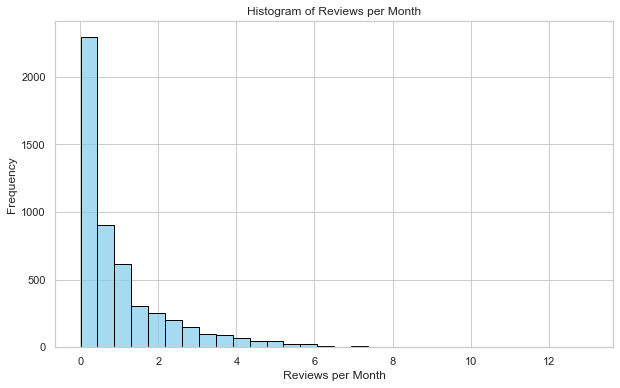

In [217]:
plt.figure(figsize=(10, 6))
sns.histplot(list_2['reviews_per_month'].dropna(), bins=30, kde=False, color='skyblue', edgecolor='black')

# Add labels and title
plt.title('Histogram of Reviews per Month')
plt.xlabel('Reviews per Month')
plt.ylabel('Frequency')

# Show the plot
plt.show()

In [218]:
list_2['reviews_per_month'] = list_2['reviews_per_month'].fillna(0)

Imputing missing values in the 'reviews_per_month' column with zeros is suitable as it aligns with the context of the data, accurately reflects the absence of reviews, and preserves the distribution's shape, especially given its extreme positive skewness.

This simple and transparent approach maintains clarity in the dataset without introducing unnecessary complexities.

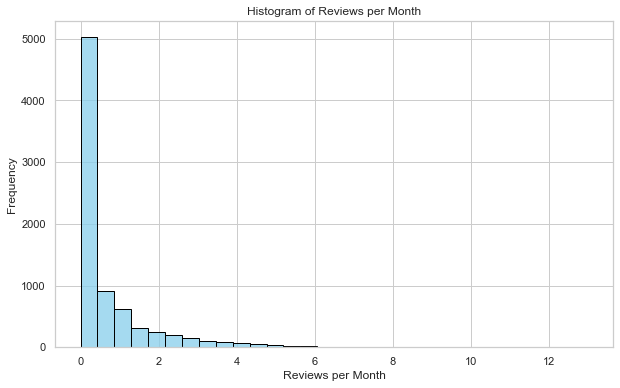

In [219]:
plt.figure(figsize=(10, 6))
sns.histplot(list_2['reviews_per_month'].dropna(), bins=30, kde=False, color='skyblue', edgecolor='black')

# Add labels and title
plt.title('Histogram of Reviews per Month')
plt.xlabel('Reviews per Month')
plt.ylabel('Frequency')

# Show the plot
plt.show()

In [220]:
# Final Check
list_2.isna().sum()

neighbourhood_group               0
neighbourhood                     0
room_type                         0
price                             0
minimum_nights                    0
number_of_reviews                 0
reviews_per_month                 0
calculated_host_listings_count    0
availability_365                  0
near_amenities                    0
name_length                       0
dtype: int64

### Outlier Handling

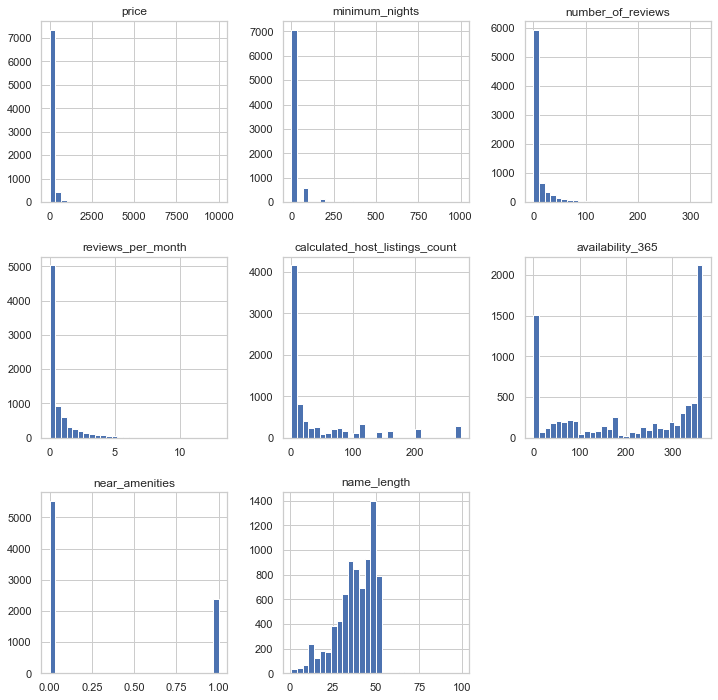

In [221]:
list_2.hist(bins=30, figsize=(12,12))
plt.show()

In [222]:
def diagnostic_plots(df, variable):
    # function takes a dataframe (df) and
    # the variable of interest as arguments

    # define figure size
    plt.figure(figsize=(16, 4))

    # histogram
    plt.subplot(1, 3, 1)
    sns.distplot(df[variable], bins=30)
    plt.title('Histogram')

    # Q-Q plot
    plt.subplot(1, 3, 2)
    stats.probplot(df[variable], dist="norm", plot=plt)
    plt.ylabel('RM quantiles')

    # boxplot
    plt.subplot(1, 3, 3)
    sns.boxplot(y=df[variable])
    plt.title('Boxplot')

    plt.show()

availability 365 will not have outlier handling as it the histogram shows a symmetrical shape and the box plot doesn't indicate outliers, it suggests that the data is well-distributed without a strong skewness. In this scenario, the benefits of handling outliers for this feature is limited and unnecessary.

C:\Users\chery\anaconda3\lib\site-packages\seaborn\distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


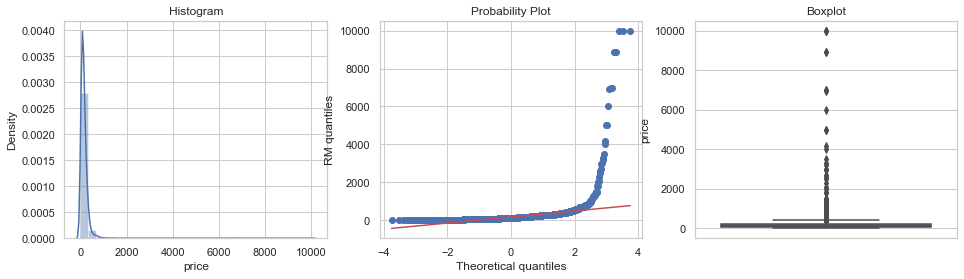

C:\Users\chery\anaconda3\lib\site-packages\seaborn\distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


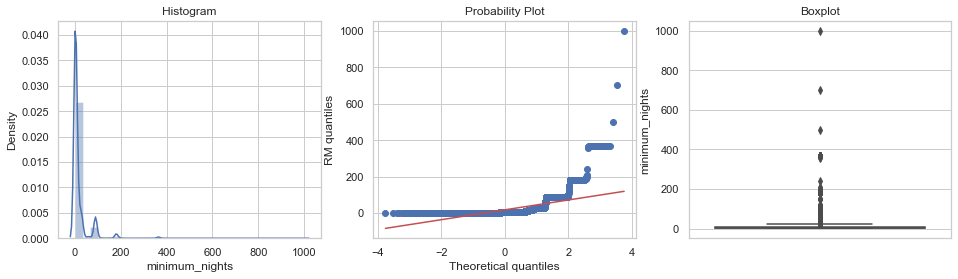

C:\Users\chery\anaconda3\lib\site-packages\seaborn\distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


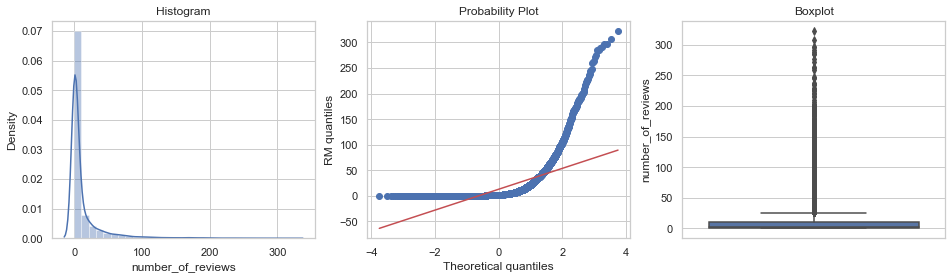

C:\Users\chery\anaconda3\lib\site-packages\seaborn\distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


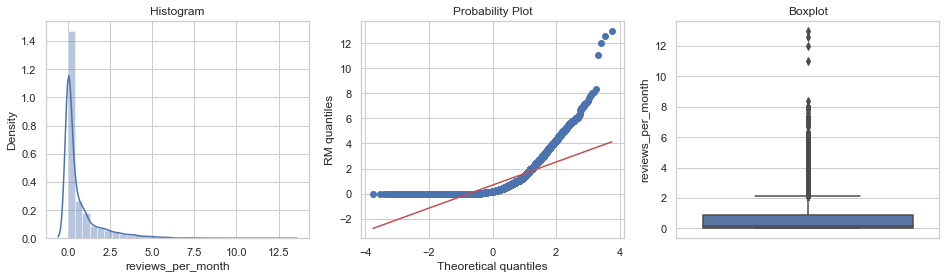

C:\Users\chery\anaconda3\lib\site-packages\seaborn\distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


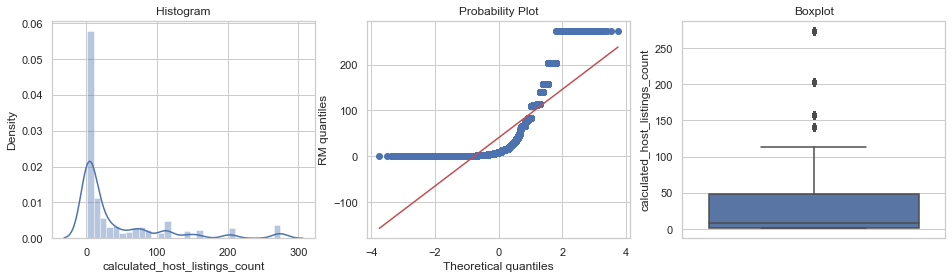

C:\Users\chery\anaconda3\lib\site-packages\seaborn\distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


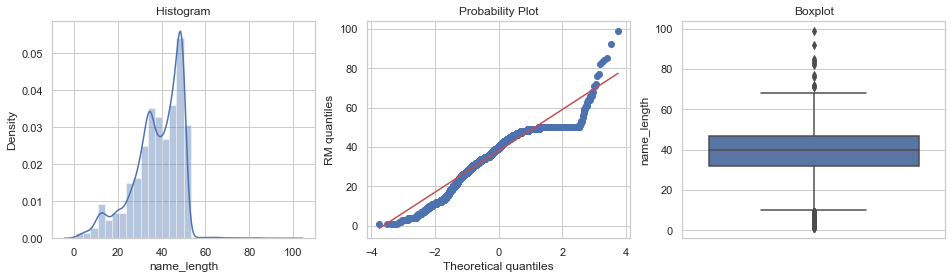

In [223]:
#BEFORE
num_feature = ['price', 'minimum_nights', 'number_of_reviews', 'reviews_per_month', 'calculated_host_listings_count', 'name_length']

for feature in num_feature:
    diagnostic_plots(list_2, feature)

#### Trimming Method

In [224]:
def find_boundaries(df, variable, distance):

    # Let's calculate the boundaries outside which sit the outliers
    # for skewed distributions

    # distance passed as an argument, gives us the option to
    # estimate 1.5 times or 3 times the IQR to calculate
    # the boundaries.

    IQR = df[variable].quantile(0.75) - df[variable].quantile(0.25)

    lower_boundary = df[variable].quantile(0.25) - (IQR * distance)
    upper_boundary = df[variable].quantile(0.75) + (IQR * distance)

    return upper_boundary, lower_boundary

In [225]:
# Create a copy of the dataset for visualization
list_trimming = list_2.copy()

In [226]:
# find limits for price

p_upper_limit, p_lower_limit = find_boundaries(list_trimming, 'price', 1.5)
p_upper_limit, p_lower_limit

# find limits for min nights

m_upper_limit, m_lower_limit = find_boundaries(list_trimming, 'minimum_nights', 1.5)
m_upper_limit, m_lower_limit

# find limits for no of rev

rev_upper_limit, rev_lower_limit = find_boundaries(list_trimming, 'number_of_reviews', 1.5)
rev_upper_limit, rev_lower_limit

# find limits for no of rev per mth

pm_upper_limit, pm_lower_limit = find_boundaries(list_trimming, 'reviews_per_month', 1.5)
pm_upper_limit, pm_lower_limit

# find limits for list cts

c_upper_limit, c_lower_limit = find_boundaries(list_trimming, 'calculated_host_listings_count', 1.5)
c_upper_limit, c_lower_limit

# find limits for length

l_upper_limit, l_lower_limit = find_boundaries(list_trimming, 'name_length', 1.5)
l_upper_limit, l_lower_limit

(69.5, 9.5)

In [227]:
# let's flag (locate) the outliers in the data set

outliers_p = np.where(list_trimming['price'] > p_upper_limit, True,
                       np.where(list_trimming['price'] < p_lower_limit, True, False))

# let's flag (locate) the outliers in the data set

outliers_m = np.where(list_trimming['minimum_nights'] > m_upper_limit, True,
                       np.where(list_trimming['minimum_nights'] < m_lower_limit, True, False))

# let's flag (locate) the outliers in the data set

outliers_rev = np.where(list_trimming['number_of_reviews'] > rev_upper_limit, True,
                       np.where(list_trimming['number_of_reviews'] < rev_lower_limit, True, False))

# let's flag (locate) the outliers in the data set

outliers_pm = np.where(list_trimming['reviews_per_month'] > pm_upper_limit, True,
                       np.where(list_trimming['reviews_per_month'] < pm_lower_limit, True, False))

# let's flag (locate) the outliers in the data set

outliers_c = np.where(list_trimming['calculated_host_listings_count'] > c_upper_limit, True,
                       np.where(list_trimming['calculated_host_listings_count'] < c_lower_limit, True, False))

# let's flag (locate) the outliers in the data set

outliers_l = np.where(list_trimming['name_length'] > l_upper_limit, True,
                       np.where(list_trimming['name_length'] < l_lower_limit, True, False))

In [228]:
# let's trim the dataset of outliers across multiple variables

list_2_trimmed = list_trimming.loc[~(outliers_p + outliers_m + outliers_rev + outliers_pm + outliers_c + outliers_l), ]

list_2.shape, list_2_trimmed.shape

((7907, 11), (4361, 11))

C:\Users\chery\anaconda3\lib\site-packages\seaborn\distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


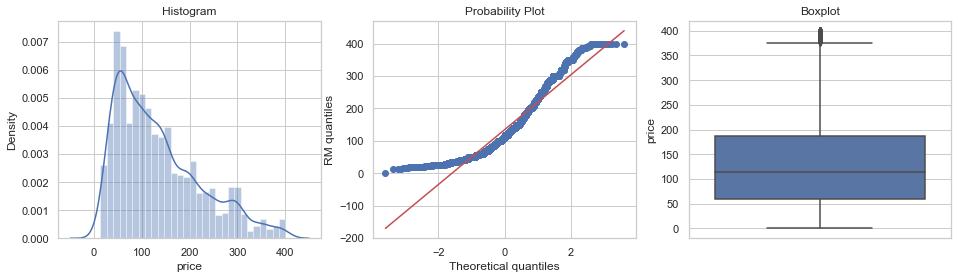

C:\Users\chery\anaconda3\lib\site-packages\seaborn\distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


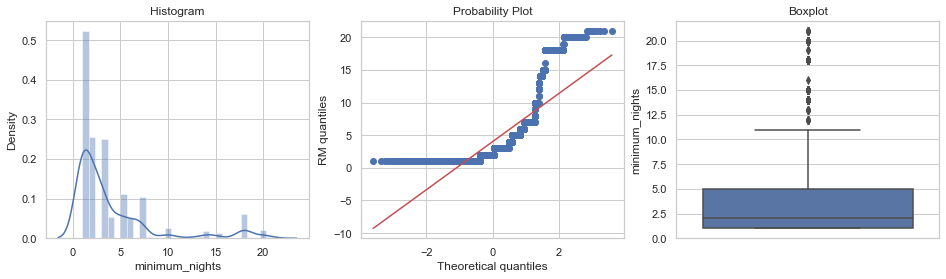

C:\Users\chery\anaconda3\lib\site-packages\seaborn\distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


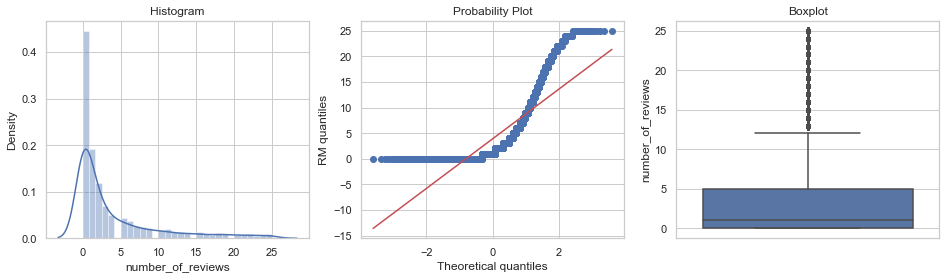

C:\Users\chery\anaconda3\lib\site-packages\seaborn\distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


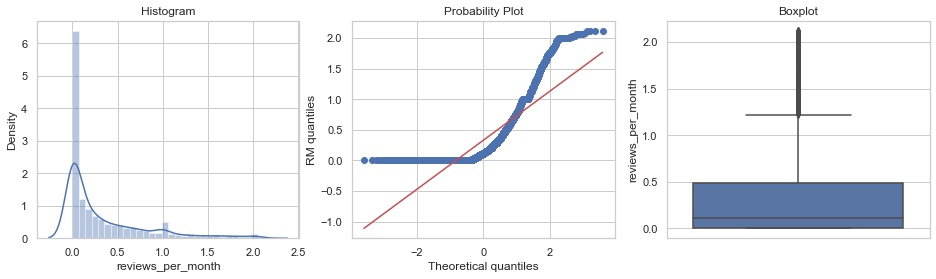

C:\Users\chery\anaconda3\lib\site-packages\seaborn\distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


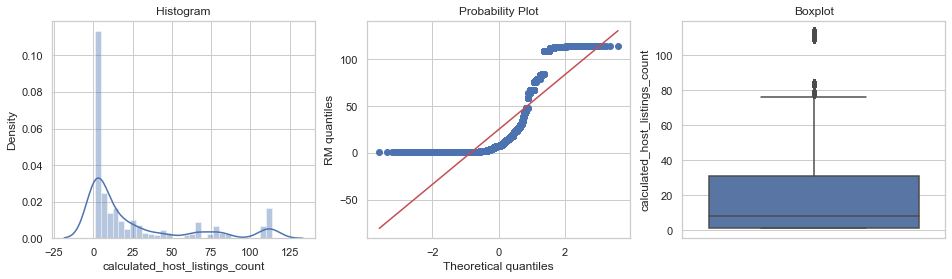

C:\Users\chery\anaconda3\lib\site-packages\seaborn\distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


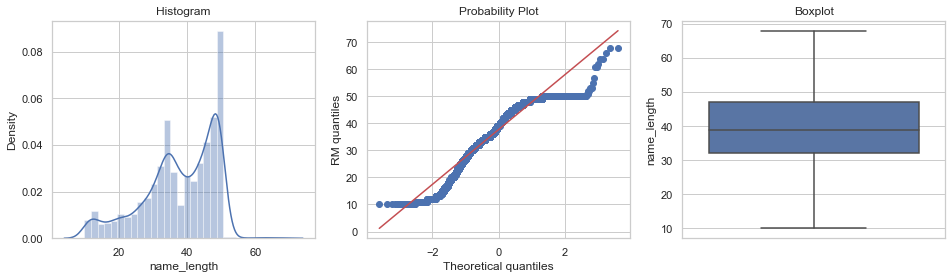

In [229]:
#AFTER
for feature in num_feature:
    diagnostic_plots(list_2_trimmed, feature)

This method of removing outliers by trimming although gives good probability plot fitting, outlier handling should not just be relied on the diagnostic plot, but the understanding. Additionally, this caused loss of data of some data that may still be useful. Additionally, because I will be subsetting the data into Central Region only, it would not be recommended to use trimming as it means losing even more data. Having little data may lead to reduced model performance, overfitting, and increased risk of bias.
Therefore, I have decided to handle the outliers with a different method below.

### Winsorisation

Winsorization is a technique used to handle outliers in data by replacing extreme values with values closer to the rest of the data distribution. It can be done through either capping or truncation. Capping involves replacing extreme values above a certain threshold with the value at the cap, while truncation sets extreme values to the respective threshold value without replacement. By using Winsorization, outliers' influence on statistical analysis is reduced while preserving the overall distribution shape. This approach helps to mitigate the impact of outliers on data analysis and modeling, ensuring that extreme values do not unduly skew the results or affect data interpretation.

C:\Users\chery\anaconda3\lib\site-packages\seaborn\distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


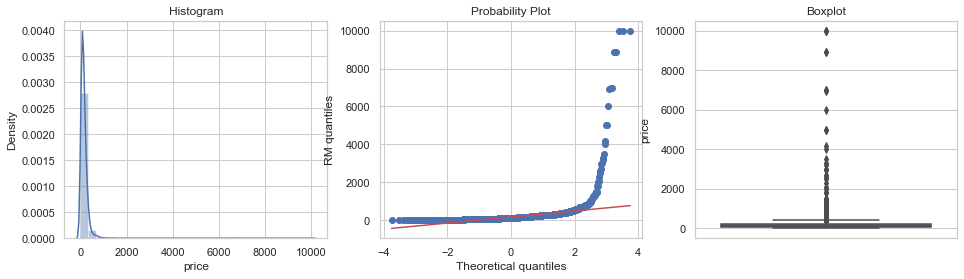

C:\Users\chery\anaconda3\lib\site-packages\seaborn\distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


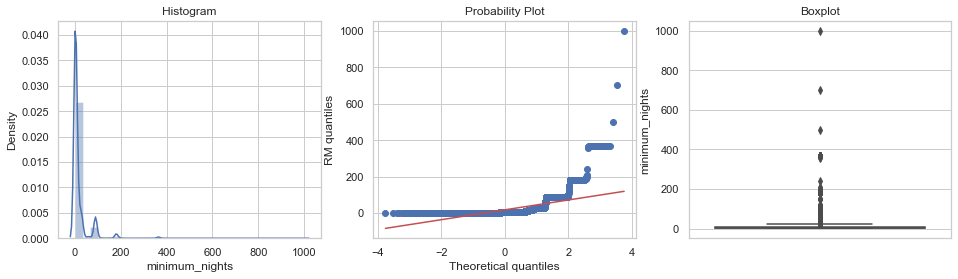

C:\Users\chery\anaconda3\lib\site-packages\seaborn\distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


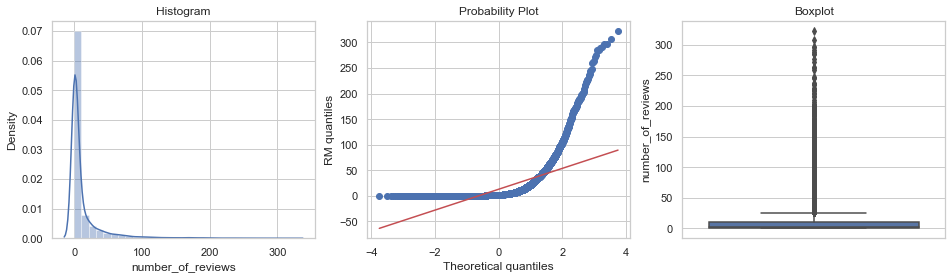

C:\Users\chery\anaconda3\lib\site-packages\seaborn\distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


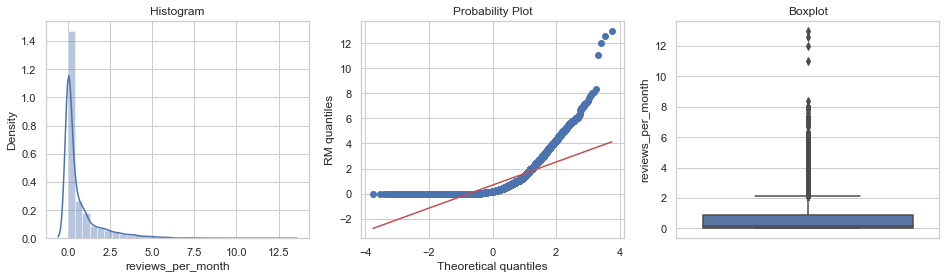

C:\Users\chery\anaconda3\lib\site-packages\seaborn\distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


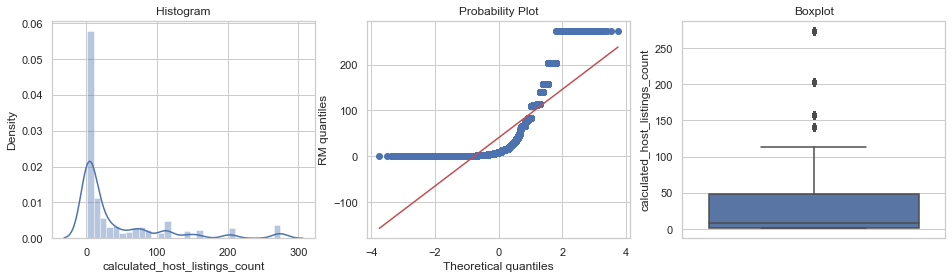

C:\Users\chery\anaconda3\lib\site-packages\seaborn\distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


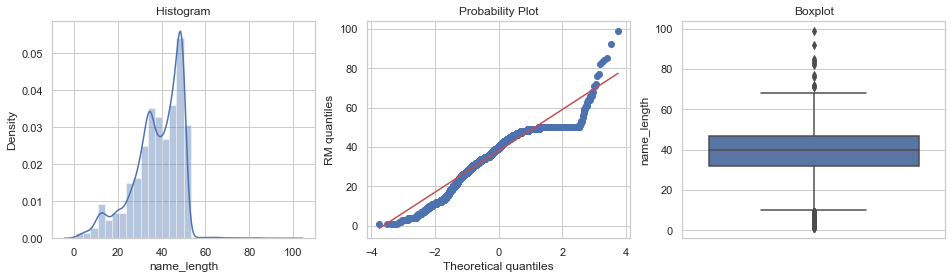

In [230]:
#BEFORE
for feature in num_feature:
    diagnostic_plots(list_2, feature)

In [231]:
from feature_engine.outliers import Winsorizer

In [232]:
def winsorise(df, variable, upper_limit, lower_limit):
    return np.where(df[variable] > upper_limit, upper_limit, 
                    np.where(df[variable] < lower_limit, lower_limit, df[variable]))

#df[variable] means if its not any outlier, stay the same

# Now let's replace the outliers by the percentiles

list_2['price']= winsorise(list_2, 'price', list_2['price'].quantile(0.95), list_2['price'].quantile(0.05))
list_2['reviews_per_month']= winsorise(list_2, 'reviews_per_month', list_2['reviews_per_month'].quantile(0.95), list_2['reviews_per_month'].quantile(0.05))
list_2['minimum_nights']= winsorise(list_2, 'minimum_nights', list_2['minimum_nights'].quantile(0.95), list_2['minimum_nights'].quantile(0.05))
list_2['number_of_reviews']= winsorise(list_2, 'number_of_reviews', list_2['number_of_reviews'].quantile(0.95), list_2['number_of_reviews'].quantile(0.05))
list_2['calculated_host_listings_count']= winsorise(list_2, 'calculated_host_listings_count', list_2['calculated_host_listings_count'].quantile(0.95), list_2['calculated_host_listings_count'].quantile(0.05))
list_2['name_length']= winsorise(list_2, 'name_length', list_2['name_length'].quantile(0.95), list_2['name_length'].quantile(0.05))

C:\Users\chery\anaconda3\lib\site-packages\seaborn\distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


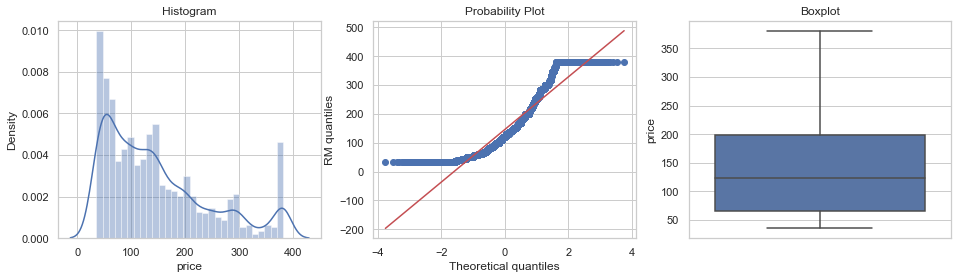

C:\Users\chery\anaconda3\lib\site-packages\seaborn\distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


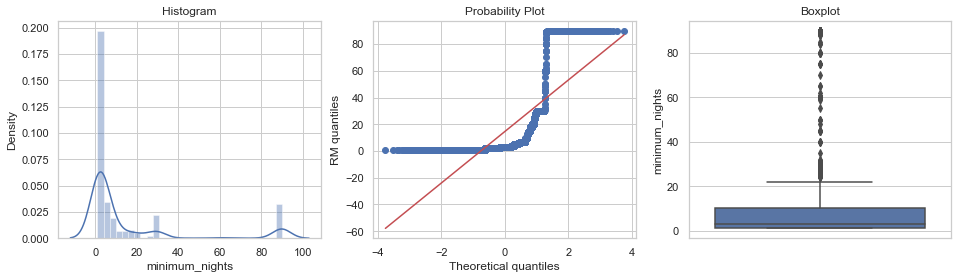

C:\Users\chery\anaconda3\lib\site-packages\seaborn\distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


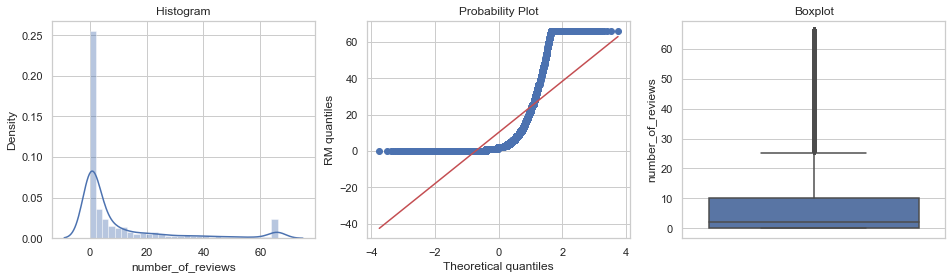

C:\Users\chery\anaconda3\lib\site-packages\seaborn\distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


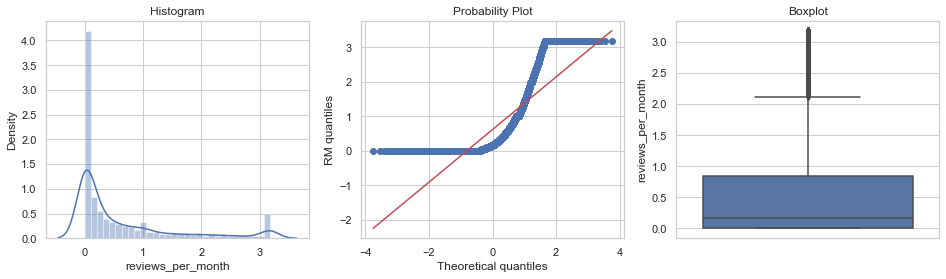

C:\Users\chery\anaconda3\lib\site-packages\seaborn\distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


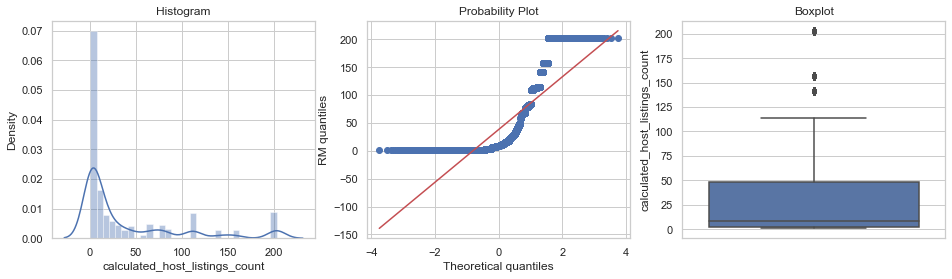

C:\Users\chery\anaconda3\lib\site-packages\seaborn\distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


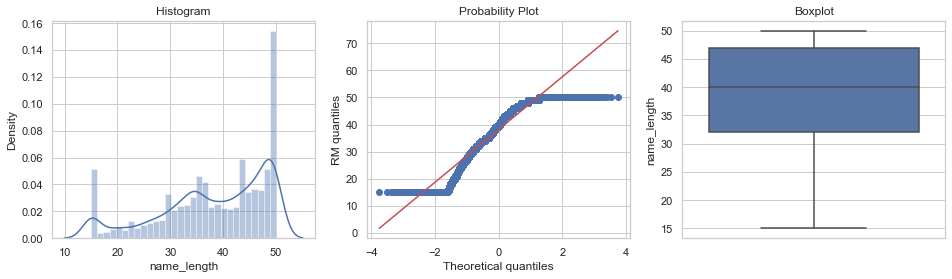

In [233]:
#AFTER
for feature in num_feature:
    diagnostic_plots(list_2, feature)

This method is chosen to minimize the impact of extreme values, especially when dealing with limited data, as we plan to subset the dataset to only Central Region. Winsorization is preferable over trimming, as it reduces the effect of outliers without entirely discarding them, preventing significant loss of information in the analysis.

In [234]:
list_2.corr() #after

,price,minimum_nights,number_of_reviews,reviews_per_month,calculated_host_listings_count,availability_365,near_amenities,name_length
price,1.000000,-0.125949,-0.078584,-0.003246,0.180336,0.120461,0.026700,0.129198
minimum_nights,-0.125949,1.000000,-0.133380,-0.205344,0.026802,0.181141,-0.004115,0.004214
number_of_reviews,-0.078584,-0.133380,1.000000,0.739263,-0.184927,-0.089924,0.029244,-0.005662
reviews_per_month,-0.003246,-0.205344,0.739263,1.000000,-0.198722,-0.110215,0.058803,0.076401
calculated_host_listings_count,0.180336,0.026802,-0.184927,-0.198722,1.000000,0.280949,0.156955,0.167149
availability_365,0.120461,0.181141,-0.089924,-0.110215,0.280949,1.000000,0.023388,0.121639
near_amenities,0.026700,-0.004115,0.029244,0.058803,0.156955,0.023388,1.000000,0.269282
name_length,0.129198,0.004214,-0.005662,0.076401,0.167149,0.121639,0.269282,1.000000


### Transforming Numerical Features

In [235]:
list_2.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 7907 entries, 0 to 7906
Data columns (total 11 columns):
 #   Column                          Non-Null Count  Dtype  
---  ------                          --------------  -----  
 0   neighbourhood_group             7907 non-null   object 
 1   neighbourhood                   7907 non-null   object 
 2   room_type                       7907 non-null   object 
 3   price                           7907 non-null   float64
 4   minimum_nights                  7907 non-null   float64
 5   number_of_reviews               7907 non-null   float64
 6   reviews_per_month               7907 non-null   float64
 7   calculated_host_listings_count  7907 non-null   float64
 8   availability_365                7907 non-null   int64  
 9   near_amenities                  7907 non-null   int32  
 10  name_length                     7907 non-null   float64
dtypes: float64(6), int32(1), int64(1), object(3)
memory usage: 648.7+ KB


In [236]:
num = list_2[['minimum_nights','number_of_reviews','reviews_per_month','calculated_host_listings_count', 
              'availability_365','name_length']]

C:\Users\chery\anaconda3\lib\site-packages\seaborn\distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


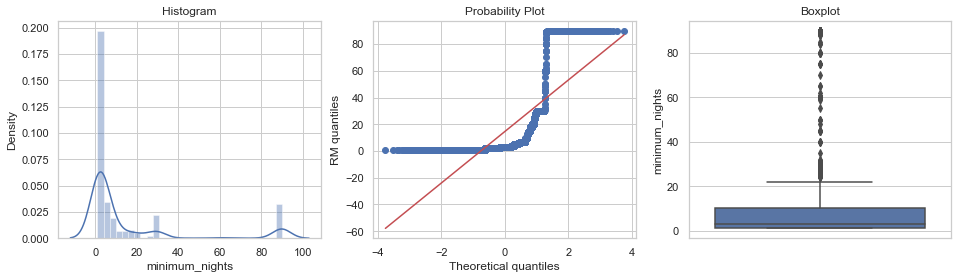

C:\Users\chery\anaconda3\lib\site-packages\seaborn\distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


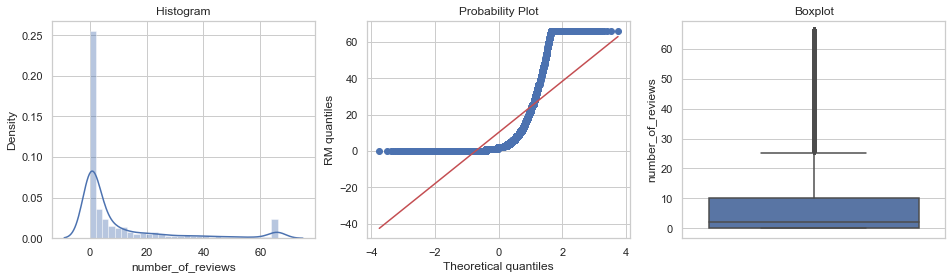

C:\Users\chery\anaconda3\lib\site-packages\seaborn\distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


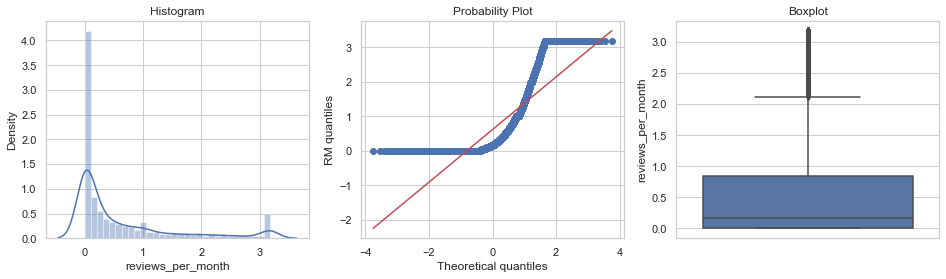

C:\Users\chery\anaconda3\lib\site-packages\seaborn\distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


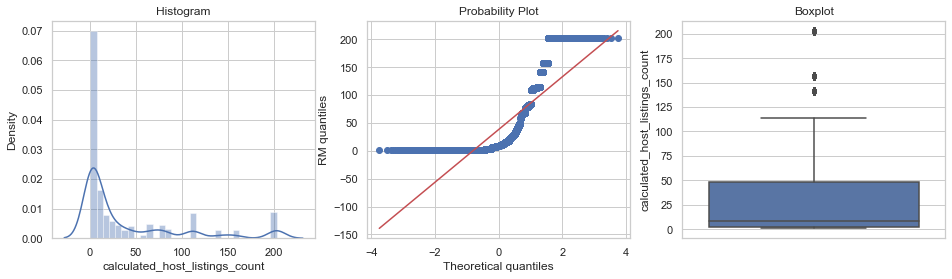

C:\Users\chery\anaconda3\lib\site-packages\seaborn\distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


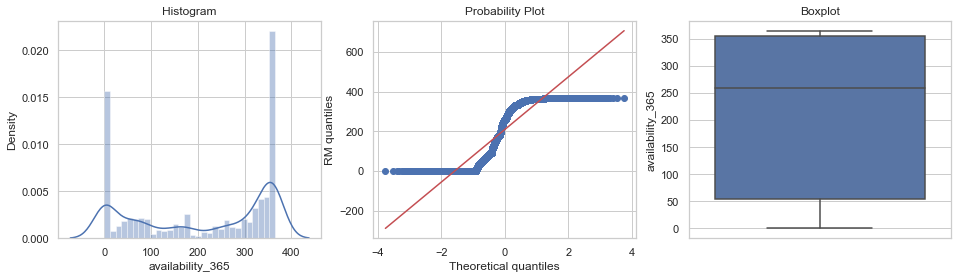

C:\Users\chery\anaconda3\lib\site-packages\seaborn\distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


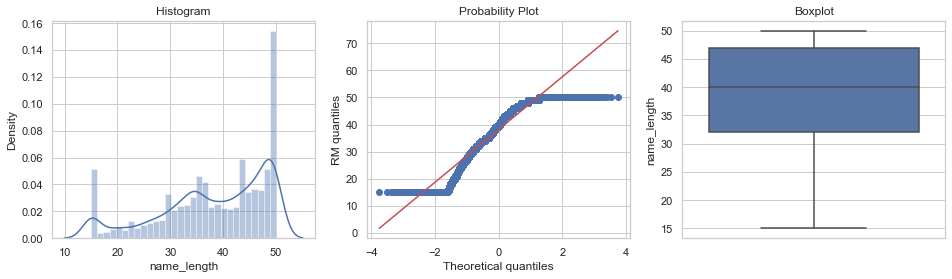

In [237]:
#BEFORE
for feature in num:
    diagnostic_plots(list_2, feature)

### Yeo-Johnson

Yeo-Johnson transformation is an extension of the Box-Cox transformation that can be applied to variables with zero or negative values. It involves a power transformation that optimally normalizes the data. Similar to log transformation, Yeo-Johnson is used to address issues related to skewed distributions and heteroscedasticity in the data. However, it is also able to handle 0 values.

The Yeo-Johnson transformation is a versatile technique that can handle a variety of scenarios, making it suitable for different features with distinct characteristics.

In [238]:
from feature_engine.transformation import YeoJohnsonTransformer
# initialize the transformer with a subset of variables to transform
yjt = YeoJohnsonTransformer(variables = ['minimum_nights','number_of_reviews','reviews_per_month',
                                         'calculated_host_listings_count', 'availability_365','name_length'])

# fit transformer to the dataframe
yjt.fit(list_2)

YeoJohnsonTransformer(variables=['minimum_nights', 'number_of_reviews',
                                 'reviews_per_month',
                                 'calculated_host_listings_count',
                                 'availability_365', 'name_length'])

In [239]:
# transform indicated variables

list_2 = yjt.transform(list_2)

In [240]:
# the transformer stores the learned parameters for each variable
# in a dictionary as an attribute

yjt.lambda_dict_

{'minimum_nights': -0.5747128351779955,
 'number_of_reviews': -0.33497501632922494,
 'reviews_per_month': -1.7948948863178888,
 'calculated_host_listings_count': -0.15820869107292282,
 'availability_365': 0.514282911956138,
 'name_length': 2.0776915150267095}

C:\Users\chery\anaconda3\lib\site-packages\seaborn\distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


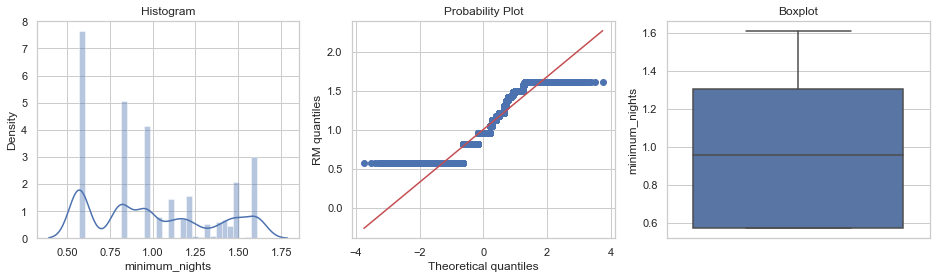

C:\Users\chery\anaconda3\lib\site-packages\seaborn\distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


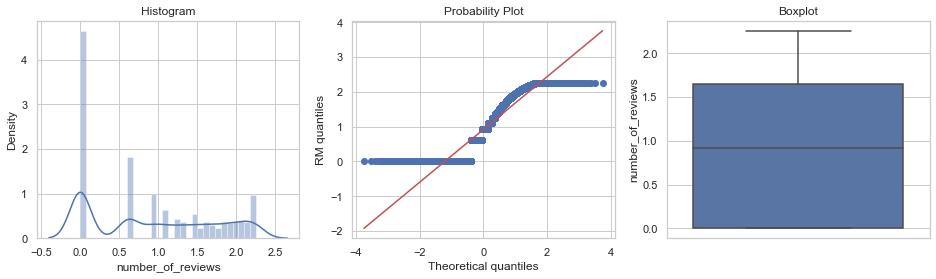

C:\Users\chery\anaconda3\lib\site-packages\seaborn\distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


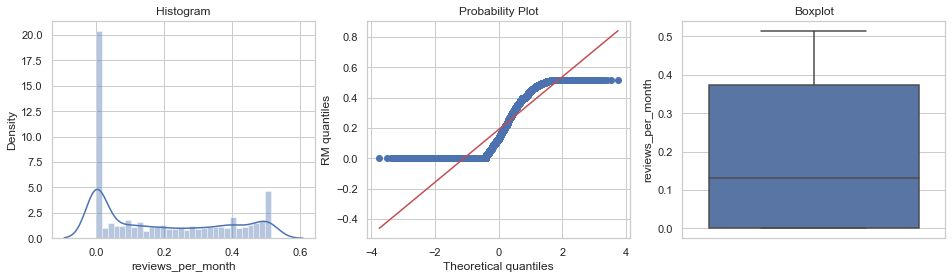

C:\Users\chery\anaconda3\lib\site-packages\seaborn\distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


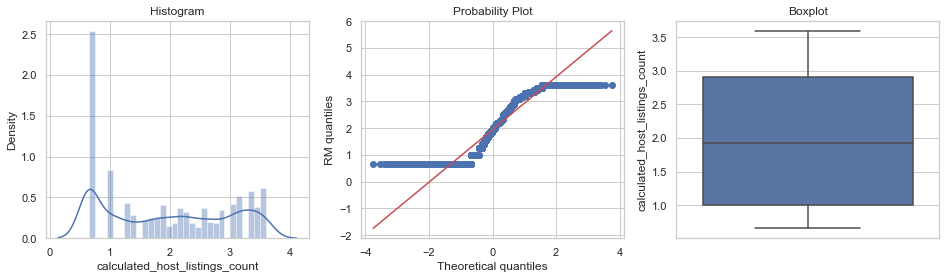

C:\Users\chery\anaconda3\lib\site-packages\seaborn\distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


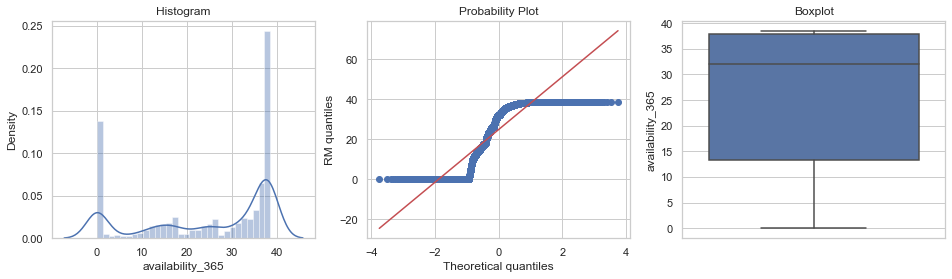

C:\Users\chery\anaconda3\lib\site-packages\seaborn\distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


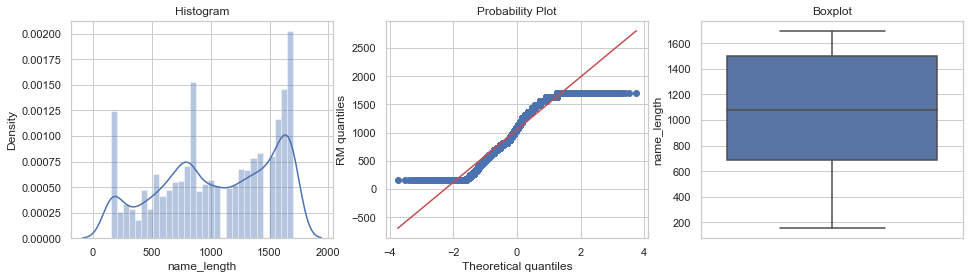

In [241]:
#AFTER
for feature in num:
    diagnostic_plots(list_2, feature)

These features have a variety of shapes in their histogram. Although most of them are right/positively skewed, name_length is left/negatively skewed, and availability_365 is symmetrical (u-shape). 

Yeo-Johnson is able to handle all the different shapes, making it suitable for them. It is also appropriate for features with symmetrical or approximately symmetrical distributions, ensuring that it doesn't distort the shape unnecessarily.

Additionally, as we imputed reviews_per_month with 0 earlier, there are values of 0. Yeo-Johnson transformation is well-suited for handling features with zero values, as it can accommodate and transform such data without requiring special treatment for zero entries (unlike log transformation).

### Transforming Categorical Features

In [242]:
list_2.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 7907 entries, 0 to 7906
Data columns (total 11 columns):
 #   Column                          Non-Null Count  Dtype  
---  ------                          --------------  -----  
 0   neighbourhood_group             7907 non-null   object 
 1   neighbourhood                   7907 non-null   object 
 2   room_type                       7907 non-null   object 
 3   price                           7907 non-null   float64
 4   minimum_nights                  7907 non-null   float64
 5   number_of_reviews               7907 non-null   float64
 6   reviews_per_month               7907 non-null   float64
 7   calculated_host_listings_count  7907 non-null   float64
 8   availability_365                7907 non-null   float64
 9   near_amenities                  7907 non-null   int32  
 10  name_length                     7907 non-null   float64
dtypes: float64(7), int32(1), object(3)
memory usage: 648.7+ KB


#### One-Hot encoding

One-hot encoding is a method in machine learning to convert categorical variables into a binary matrix. Each unique category is represented as a binary vector, with one element set to 1 to indicate the category's presence and others set to 0. This transformation is essential for incorporating categorical information into algorithms that require numerical input.

In [243]:
# View unique titles 
list_2['neighbourhood_group'].value_counts()

Central Region       6309
West Region           540
East Region           508
North-East Region     346
North Region          204
Name: neighbourhood_group, dtype: int64

In [244]:
# let's create the encoder
from feature_engine.encoding import OneHotEncoder

ohe_enc = OneHotEncoder(
    variables='neighbourhood_group',
    top_categories=None,
    drop_last=True
)

In [245]:
# fit the encoder

ohe_enc.fit(list_2)

OneHotEncoder(drop_last=True, variables='neighbourhood_group')

In [246]:
# we can see which variables the encoder will encode
ohe_enc.variables

'neighbourhood_group'

In [247]:
# let's transform 
enc = ohe_enc.transform(list_2)

In [248]:
#Before
list_2.head()

,neighbourhood_group,neighbourhood,room_type,price,minimum_nights,number_of_reviews,reviews_per_month,calculated_host_listings_count,availability_365,near_amenities,name_length
0,North Region,Woodlands,Private room,83.0,1.609784,0.618560,0.009862,1.008437,38.527336,0,731.263564
1,Central Region,Bukit Timah,Private room,81.0,1.609784,1.871934,0.199426,0.656493,38.527336,1,644.662117
2,North Region,Woodlands,Private room,69.0,1.171329,1.908641,0.155494,1.008437,38.527336,0,152.348764
3,East Region,Tampines,Private room,206.0,0.571729,1.780188,0.123610,1.929790,37.839387,1,823.534298
4,East Region,Tampines,Private room,94.0,0.571729,1.940955,0.167235,1.929790,37.954823,1,644.662117


In [249]:
enc.head()

,neighbourhood,room_type,price,minimum_nights,number_of_reviews,reviews_per_month,calculated_host_listings_count,availability_365,near_amenities,name_length,neighbourhood_group_North Region,neighbourhood_group_Central Region,neighbourhood_group_East Region,neighbourhood_group_West Region
0,Woodlands,Private room,83.0,1.609784,0.618560,0.009862,1.008437,38.527336,0,731.263564,1,0,0,0
1,Bukit Timah,Private room,81.0,1.609784,1.871934,0.199426,0.656493,38.527336,1,644.662117,0,1,0,0
2,Woodlands,Private room,69.0,1.171329,1.908641,0.155494,1.008437,38.527336,0,152.348764,1,0,0,0
3,Tampines,Private room,206.0,0.571729,1.780188,0.123610,1.929790,37.839387,1,823.534298,0,0,1,0
4,Tampines,Private room,94.0,0.571729,1.940955,0.167235,1.929790,37.954823,1,644.662117,0,0,1,0


One-hot encoding is suitable for this feature because it allows each group to be independently represented as a binary column, avoiding assumptions of ordinal relationships.

#### replacing-categories-by-counts-frequency

Replacing-categories-by-counts-frequency is a method of encoding categorical variables by replacing each category with its corresponding frequency or count in the dataset. Instead of assigning arbitrary numerical values, this technique captures the prevalence of each category in the dataset. It helps to maintain the information about the distribution of categories, 

In [250]:
# View unique titles 
enc['neighbourhood'].value_counts()

Kallang                    1043
Geylang                     994
Novena                      537
Rochor                      536
Outram                      477
Bukit Merah                 470
Downtown Core               428
Bedok                       373
River Valley                362
Queenstown                  266
Tanglin                     210
Singapore River             175
Marine Parade               171
Jurong West                 153
Orchard                     136
Newton                      134
Bukit Timah                 131
Jurong East                 118
Hougang                     109
Clementi                    102
Toa Payoh                   101
Pasir Ris                    71
Serangoon                    69
Sengkang                     67
Woodlands                    67
Bukit Batok                  65
Tampines                     64
Museum                       63
Choa Chu Kang                63
Ang Mo Kio                   58
Bishan                       57
Yishun  

In [251]:
# to encode with feature-engine
from feature_engine.encoding import CountFrequencyEncoder

In [252]:
# let's create an encoder

count_enc = CountFrequencyEncoder(
    encoding_method='count', # to do frequency ==> encoding_method='frequency'
    variables='neighbourhood')

In [253]:
# fit the encoder to the train set
count_enc.fit(enc)

CountFrequencyEncoder(variables='neighbourhood')

In [254]:
# the encoder stores the variables it will encode
count_enc.variables

# in the encoder dict contains the counts or frequencies
# per category per variable

count_enc.encoder_dict_

{'neighbourhood': {'Kallang': 1043,
  'Geylang': 994,
  'Novena': 537,
  'Rochor': 536,
  'Outram': 477,
  'Bukit Merah': 470,
  'Downtown Core': 428,
  'Bedok': 373,
  'River Valley': 362,
  'Queenstown': 266,
  'Tanglin': 210,
  'Singapore River': 175,
  'Marine Parade': 171,
  'Jurong West': 153,
  'Orchard': 136,
  'Newton': 134,
  'Bukit Timah': 131,
  'Jurong East': 118,
  'Hougang': 109,
  'Clementi': 102,
  'Toa Payoh': 101,
  'Pasir Ris': 71,
  'Serangoon': 69,
  'Sengkang': 67,
  'Woodlands': 67,
  'Bukit Batok': 65,
  'Tampines': 64,
  'Museum': 63,
  'Choa Chu Kang': 63,
  'Ang Mo Kio': 58,
  'Bishan': 57,
  'Yishun': 53,
  'Punggol': 43,
  'Sembawang': 41,
  'Bukit Panjang': 34,
  'Central Water Catchment': 34,
  'Southern Islands': 17,
  'Sungei Kadut': 5,
  'Western Water Catchment': 4,
  'Mandai': 3,
  'Tuas': 1,
  'Marina South': 1,
  'Lim Chu Kang': 1}}

In [255]:
# let's transform 
enc = count_enc.transform(enc)

This method is suitable for this feature as This categorical variable exhibits high cardinality, meaning it has numerous unique categories corresponding to various neighborhoods. When there's high number of categories, one-hot encoding may lead to curse of dimension, hence count frequency encoding is recommended instead. It is also able to retain the popularity of each neighbourhood.

In [256]:
#Before
list_2.head() 

,neighbourhood_group,neighbourhood,room_type,price,minimum_nights,number_of_reviews,reviews_per_month,calculated_host_listings_count,availability_365,near_amenities,name_length
0,North Region,Woodlands,Private room,83.0,1.609784,0.618560,0.009862,1.008437,38.527336,0,731.263564
1,Central Region,Bukit Timah,Private room,81.0,1.609784,1.871934,0.199426,0.656493,38.527336,1,644.662117
2,North Region,Woodlands,Private room,69.0,1.171329,1.908641,0.155494,1.008437,38.527336,0,152.348764
3,East Region,Tampines,Private room,206.0,0.571729,1.780188,0.123610,1.929790,37.839387,1,823.534298
4,East Region,Tampines,Private room,94.0,0.571729,1.940955,0.167235,1.929790,37.954823,1,644.662117


In [257]:
#After 
enc.head()

,neighbourhood,room_type,price,minimum_nights,number_of_reviews,reviews_per_month,calculated_host_listings_count,availability_365,near_amenities,name_length,neighbourhood_group_North Region,neighbourhood_group_Central Region,neighbourhood_group_East Region,neighbourhood_group_West Region
0,67,Private room,83.0,1.609784,0.618560,0.009862,1.008437,38.527336,0,731.263564,1,0,0,0
1,131,Private room,81.0,1.609784,1.871934,0.199426,0.656493,38.527336,1,644.662117,0,1,0,0
2,67,Private room,69.0,1.171329,1.908641,0.155494,1.008437,38.527336,0,152.348764,1,0,0,0
3,64,Private room,206.0,0.571729,1.780188,0.123610,1.929790,37.839387,1,823.534298,0,0,1,0
4,64,Private room,94.0,0.571729,1.940955,0.167235,1.929790,37.954823,1,644.662117,0,0,1,0


#### Replacing-categories-by-ordinal-numbers

This way of ordinal encoding allows customisation, which is important for features where the categories have a certain order, like room type.

In [258]:
# View unique titles 
enc['room_type'].value_counts()

Entire home/apt    4132
Private room       3381
Shared room         394
Name: room_type, dtype: int64

In [259]:
room_mapping = {'Shared room': 0, 'Private room': 1, 'Entire home/apt': 2}
enc['room_type'] = enc['room_type'].map(room_mapping)

Because 'room_type' represents a variable with hierarchy, manually assigning numerical values through ordinal encoding with a mapping is a suitable choice. It captures the inherent hierarchy in rooms, maintains interpretability, and aligns with the semantic meaning of the original categories.

In [260]:
list_2.head() #before

,neighbourhood_group,neighbourhood,room_type,price,minimum_nights,number_of_reviews,reviews_per_month,calculated_host_listings_count,availability_365,near_amenities,name_length
0,North Region,Woodlands,Private room,83.0,1.609784,0.618560,0.009862,1.008437,38.527336,0,731.263564
1,Central Region,Bukit Timah,Private room,81.0,1.609784,1.871934,0.199426,0.656493,38.527336,1,644.662117
2,North Region,Woodlands,Private room,69.0,1.171329,1.908641,0.155494,1.008437,38.527336,0,152.348764
3,East Region,Tampines,Private room,206.0,0.571729,1.780188,0.123610,1.929790,37.839387,1,823.534298
4,East Region,Tampines,Private room,94.0,0.571729,1.940955,0.167235,1.929790,37.954823,1,644.662117


In [261]:
enc.head()  #after

,neighbourhood,room_type,price,minimum_nights,number_of_reviews,reviews_per_month,calculated_host_listings_count,availability_365,near_amenities,name_length,neighbourhood_group_North Region,neighbourhood_group_Central Region,neighbourhood_group_East Region,neighbourhood_group_West Region
0,67,1,83.0,1.609784,0.618560,0.009862,1.008437,38.527336,0,731.263564,1,0,0,0
1,131,1,81.0,1.609784,1.871934,0.199426,0.656493,38.527336,1,644.662117,0,1,0,0
2,67,1,69.0,1.171329,1.908641,0.155494,1.008437,38.527336,0,152.348764,1,0,0,0
3,64,1,206.0,0.571729,1.780188,0.123610,1.929790,37.839387,1,823.534298,0,0,1,0
4,64,1,94.0,0.571729,1.940955,0.167235,1.929790,37.954823,1,644.662117,0,0,1,0


In [262]:
list_2=enc

### Scaling Numerical Features

Scaling is especially important when using distance-based algorithms or models sensitive to the scale of features.

Exclude categorical features because they don't have a meaningful scale that can be compared across different categories. Categorical features are already in a suitable format for most machine learning algorithms after encoding (e.g., one-hot encoding), and scaling them isn't necessary.

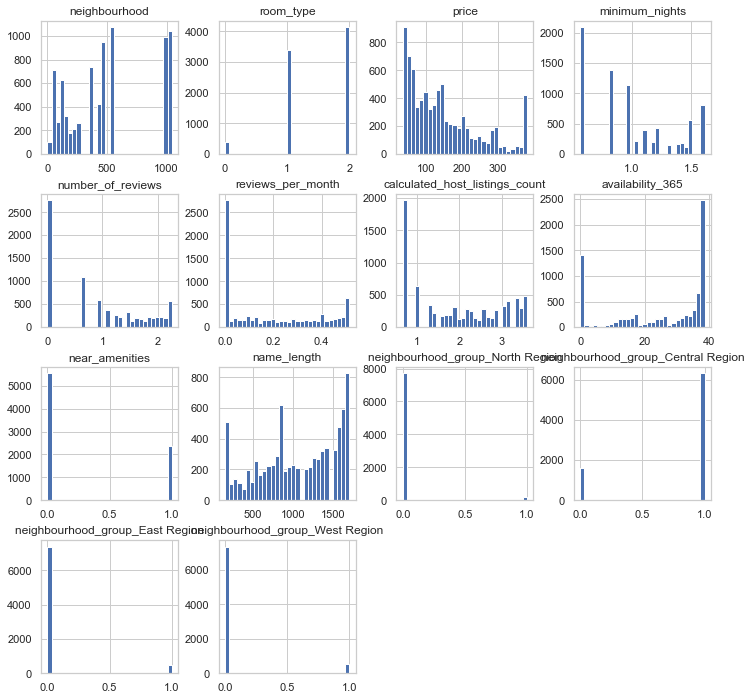

In [263]:
list_2.hist(bins=30, figsize=(12,12))
plt.show()

### MinMax Normalisation

In [264]:
# the scaler - for min-max scaling
from sklearn.preprocessing import MinMaxScaler

In [265]:
list_2.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 7907 entries, 0 to 7906
Data columns (total 14 columns):
 #   Column                              Non-Null Count  Dtype  
---  ------                              --------------  -----  
 0   neighbourhood                       7907 non-null   int64  
 1   room_type                           7907 non-null   int64  
 2   price                               7907 non-null   float64
 3   minimum_nights                      7907 non-null   float64
 4   number_of_reviews                   7907 non-null   float64
 5   reviews_per_month                   7907 non-null   float64
 6   calculated_host_listings_count      7907 non-null   float64
 7   availability_365                    7907 non-null   float64
 8   near_amenities                      7907 non-null   int32  
 9   name_length                         7907 non-null   float64
 10  neighbourhood_group_North Region    7907 non-null   int32  
 11  neighbourhood_group_Central Region  7907 no

In [266]:
num =['minimum_nights','number_of_reviews','reviews_per_month','calculated_host_listings_count', 
              'availability_365','name_length']

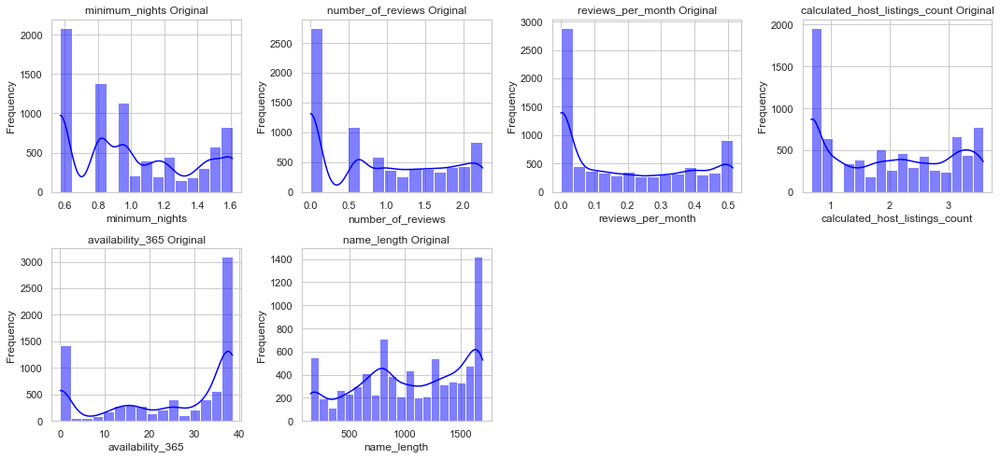

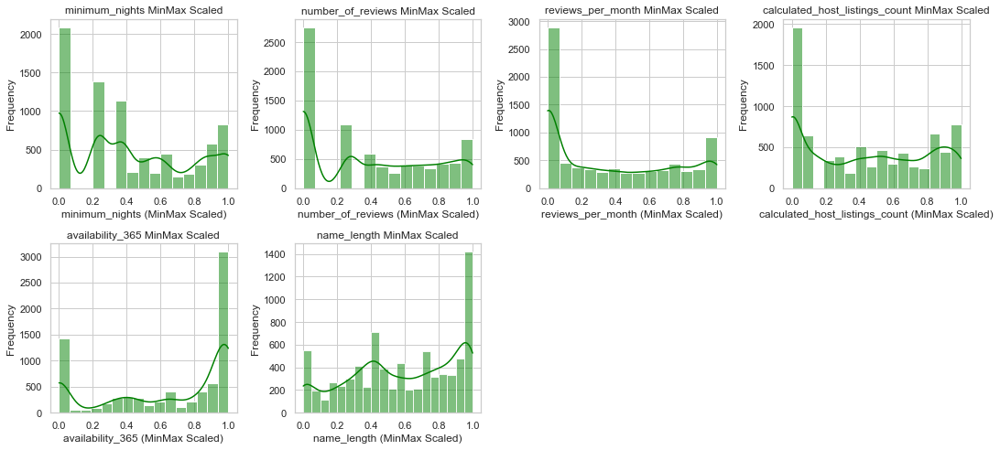

In [267]:
from sklearn.preprocessing import MinMaxScaler

# Create a copy of the dataset for visualization
list_norm = list_2.copy()

# Plot the original distributions
plt.figure(figsize=(15, 7))

for i, feature in enumerate(num, 1):
    plt.subplot(2, 4, i)
    sns.histplot(list_2[feature], kde=True, color='blue', label='Original')
    plt.title(f'{feature} Original')
    plt.xlabel(feature)
    plt.ylabel('Frequency')

plt.tight_layout()
plt.show()

# Instantiate MinMaxScaler
scaler = MinMaxScaler()

# Fit and transform the specified numerical features
list_norm[num] = scaler.fit_transform(list_norm[num])

# Plot the scaled distributions
plt.figure(figsize=(15, 7))

for i, feature in enumerate(num, 1):
    plt.subplot(2, 4, i)
    sns.histplot(list_norm[feature], kde=True, color='green', label='MinMax Scaled')
    plt.title(f'{feature} MinMax Scaled')
    plt.xlabel(f'{feature} (MinMax Scaled)')
    plt.ylabel('Frequency')

plt.tight_layout()
plt.show()


### Robust Scaling

Scaling, in the context of data preprocessing for machine learning, refers to the process of transforming numerical features to a common scale or range.

The RobustScaler uses the median and the interquartile range (IQR) for scaling, making it less influenced by extreme values. This can be beneficial when you have outliers that affect the mean and standard deviation in traditional scaling methods.

By using RobustScaler, you are normalizing the data based on the median and scaling it by the IQR, which can provide more robust scaling in the presence of outliers.

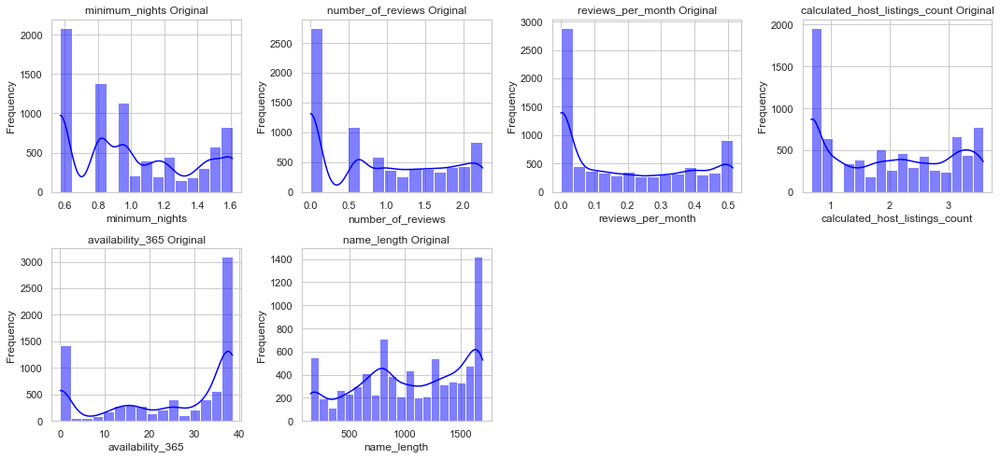

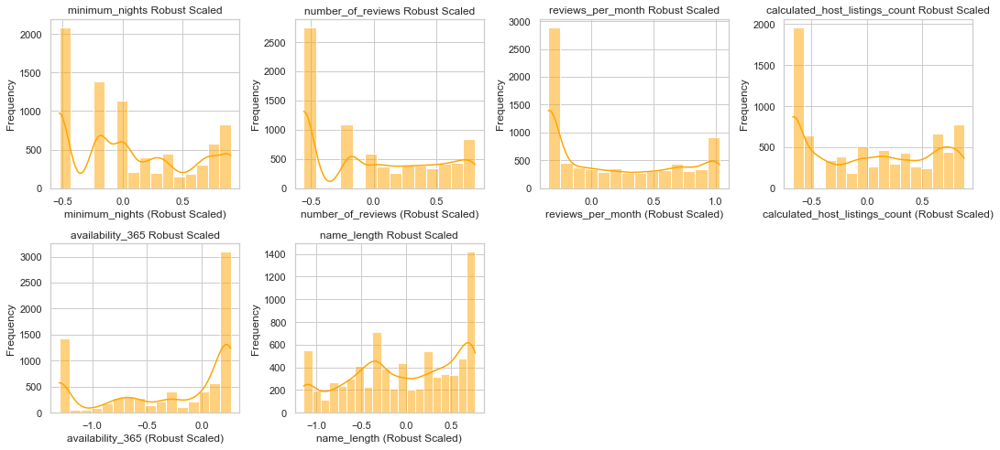

In [268]:
from sklearn.preprocessing import RobustScaler

# Create a copy of the dataset for visualization
list_robust = list_2.copy()

# Plot the original distributions
plt.figure(figsize=(15, 7))

for i, feature in enumerate(num, 1):
    plt.subplot(2, 4, i)
    sns.histplot(list_2[feature], kde=True, color='blue', label='Original')
    plt.title(f'{feature} Original')
    plt.xlabel(feature)
    plt.ylabel('Frequency')

plt.tight_layout()
plt.show()

# Instantiate RobustScaler
scaler = RobustScaler()

# Fit and transform the specified numerical features
list_robust[num] = scaler.fit_transform(list_robust[num])

# Plot the scaled distributions
plt.figure(figsize=(15, 7))

for i, feature in enumerate(num, 1):
    plt.subplot(2, 4, i)
    sns.histplot(list_robust[feature], kde=True, color='orange', label='Robust Scaled')
    plt.title(f'{feature} Robust Scaled')
    plt.xlabel(f'{feature} (Robust Scaled)')
    plt.ylabel('Frequency')

plt.tight_layout()
plt.show()


Since this data have outliers, and most of the data are not normally distributed, robust scaling method is suitable as it is less sensitive to outliers.

In [269]:
list_final = list_robust

In [270]:
list_final.head()

,neighbourhood,room_type,price,minimum_nights,number_of_reviews,reviews_per_month,calculated_host_listings_count,availability_365,near_amenities,name_length,neighbourhood_group_North Region,neighbourhood_group_Central Region,neighbourhood_group_East Region,neighbourhood_group_West Region
0,67,1,83.0,0.896522,-0.182362,-0.323347,-0.485556,0.262272,0,-0.429369,1,0,0,0
1,131,1,81.0,0.896522,0.578065,0.185608,-0.671031,0.262272,1,-0.536246,0,1,0,0
2,67,1,69.0,0.295645,0.600336,0.067655,-0.485556,0.262272,0,-1.143823,1,0,0,0
3,64,1,206.0,-0.526072,0.522403,-0.017948,0.000000,0.234340,1,-0.315495,0,0,1,0
4,64,1,94.0,-0.526072,0.619941,0.099178,0.000000,0.239027,1,-0.536246,0,0,1,0


### Subsetting to Central Region

In [271]:
list_subset = list_final[list_final['neighbourhood_group_Central Region'] == 1]

In [272]:
# Drop columns related to other regions
list_subset = list_subset.drop(['neighbourhood_group_North Region', 'neighbourhood_group_East Region', 
                                'neighbourhood_group_West Region', 'neighbourhood_group_Central Region'], axis=1)

Dropping columns related to other regions is done to focus on the specific region of interest (Central Region in this case). When you're working on a specific analysis or model focused on a particular region, keeping unnecessary columns that represent other regions may introduce noise and unnecessary complexity to your analysis.

By dropping these columns, you streamline your dataset to include only the relevant information for the Central Region, making it easier to interpret, analyze, and build models specific to that region without interference from data related to other regions. This practice helps to enhance the accuracy and relevance of your analysis within the context of your specific research or modeling goals.

In [273]:
print("Shape before subset: {}, Shape after subset: {}".format(list_final.shape, list_subset.shape))

Shape before subset: (7907, 14), Shape after subset: (6309, 10)


#### Final Data

In [274]:
list_subset.head()

,neighbourhood,room_type,price,minimum_nights,number_of_reviews,reviews_per_month,calculated_host_listings_count,availability_365,near_amenities,name_length
1,131,1,81.0,0.896522,0.578065,0.185608,-0.671031,0.262272,1,-0.536246
10,470,1,44.0,0.590371,0.578065,0.114405,0.398299,0.181909,0,0.764489
11,470,1,40.0,0.743611,0.442355,-0.094310,0.398299,0.042908,1,-0.194594
13,134,1,65.0,-0.193267,0.810679,0.823269,-0.134335,0.193970,1,-0.587071
14,470,1,44.0,0.743611,0.505309,-0.017948,0.398299,0.203556,0,-0.373309


In [275]:
list_subset.shape

(6309, 10)

In [276]:
list_subset.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 6309 entries, 1 to 7906
Data columns (total 10 columns):
 #   Column                          Non-Null Count  Dtype  
---  ------                          --------------  -----  
 0   neighbourhood                   6309 non-null   int64  
 1   room_type                       6309 non-null   int64  
 2   price                           6309 non-null   float64
 3   minimum_nights                  6309 non-null   float64
 4   number_of_reviews               6309 non-null   float64
 5   reviews_per_month               6309 non-null   float64
 6   calculated_host_listings_count  6309 non-null   float64
 7   availability_365                6309 non-null   float64
 8   near_amenities                  6309 non-null   int32  
 9   name_length                     6309 non-null   float64
dtypes: float64(7), int32(1), int64(2)
memory usage: 517.5 KB


### 2.3 `Correlation Analysis`  <a id="part2.3"></a> 

In [277]:
#Correlation before
list_new.corr()

,id,host_id,latitude,longitude,price,minimum_nights,number_of_reviews,reviews_per_month,calculated_host_listings_count,availability_365
id,1.000000,0.541770,-0.112042,-0.004701,0.049324,-0.083037,-0.341513,0.199958,0.245014,0.113259
host_id,0.541770,1.000000,-0.041237,-0.016341,0.038802,-0.089862,-0.175573,0.169950,-0.063522,0.041840
latitude,-0.112042,-0.041237,1.000000,-0.034970,-0.073990,0.084924,-0.015022,-0.029580,-0.149961,-0.068740
longitude,-0.004701,-0.016341,-0.034970,1.000000,-0.030436,-0.029208,0.102109,0.117578,0.049416,-0.035727
price,0.049324,0.038802,-0.073990,-0.030436,1.000000,-0.012214,-0.042013,0.000920,0.016555,0.017451
minimum_nights,-0.083037,-0.089862,0.084924,-0.029208,-0.012214,1.000000,-0.076475,-0.139469,-0.013964,0.150356
number_of_reviews,-0.341513,-0.175573,-0.015022,0.102109,-0.042013,-0.076475,1.000000,0.627965,-0.149681,-0.066658
reviews_per_month,0.199958,0.169950,-0.029580,0.117578,0.000920,-0.139469,0.627965,1.000000,-0.195962,-0.108243
calculated_host_listings_count,0.245014,-0.063522,-0.149961,0.049416,0.016555,-0.013964,-0.149681,-0.195962,1.000000,0.246230
availability_365,0.113259,0.041840,-0.068740,-0.035727,0.017451,0.150356,-0.066658,-0.108243,0.246230,1.000000


In [278]:
# This shows the correlations between the variables after transforming everything
list_subset.corr()

,neighbourhood,room_type,price,minimum_nights,number_of_reviews,reviews_per_month,calculated_host_listings_count,availability_365,near_amenities,name_length
neighbourhood,1.000000,0.034469,-0.074074,0.003446,-0.018051,0.001987,0.209267,0.059460,0.121378,0.012559
room_type,0.034469,1.000000,0.555462,0.242068,-0.043165,0.007079,0.266218,-0.023483,0.122067,0.087756
price,-0.074074,0.555462,1.000000,-0.029146,-0.084136,-0.026009,0.126618,0.110383,0.048828,0.115589
minimum_nights,0.003446,0.242068,-0.029146,1.000000,-0.266844,-0.290965,0.267564,0.179218,0.060114,0.042817
number_of_reviews,-0.018051,-0.043165,-0.084136,-0.266844,1.000000,0.864694,-0.153818,-0.068559,0.043281,-0.003594
reviews_per_month,0.001987,0.007079,-0.026009,-0.290965,0.864694,1.000000,-0.112860,-0.034478,0.076853,0.074427
calculated_host_listings_count,0.209267,0.266218,0.126618,0.267564,-0.153818,-0.112860,1.000000,0.475210,0.142908,0.152298
availability_365,0.059460,-0.023483,0.110383,0.179218,-0.068559,-0.034478,0.475210,1.000000,0.040792,0.112701
near_amenities,0.121378,0.122067,0.048828,0.060114,0.043281,0.076853,0.142908,0.040792,1.000000,0.249555
name_length,0.012559,0.087756,0.115589,0.042817,-0.003594,0.074427,0.152298,0.112701,0.249555,1.000000


<AxesSubplot:>

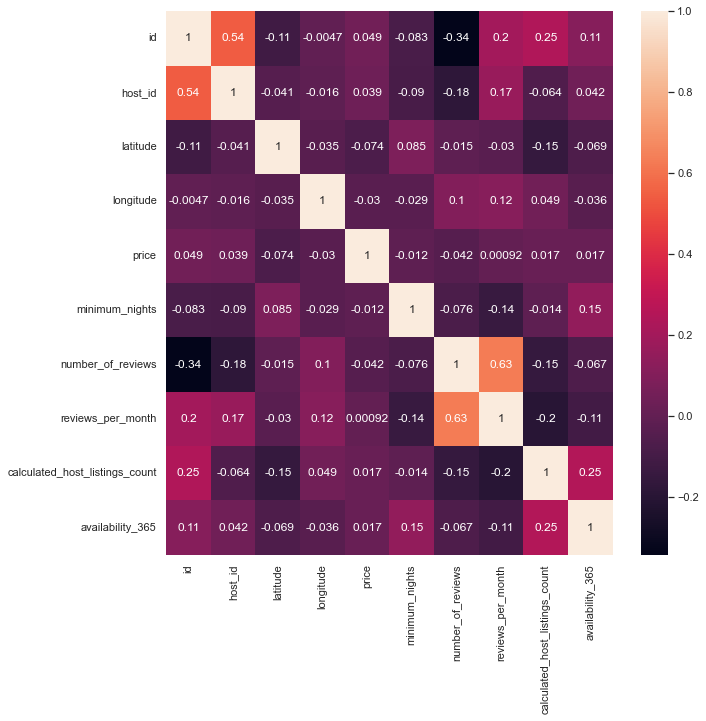

In [279]:
# start dataset
f,ax=plt.subplots(figsize=(10,10))
sns.heatmap(list_new.corr(),annot=True)

<AxesSubplot:>

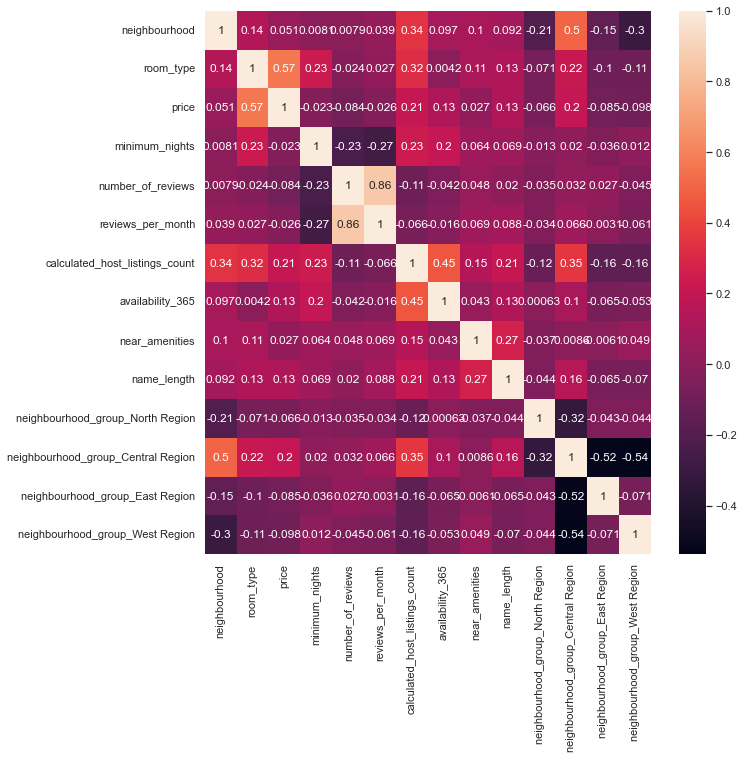

In [280]:
# final data BEFORE subsetting
f,ax=plt.subplots(figsize=(10,10))
sns.heatmap(list_final.corr(),annot=True)

<AxesSubplot:>

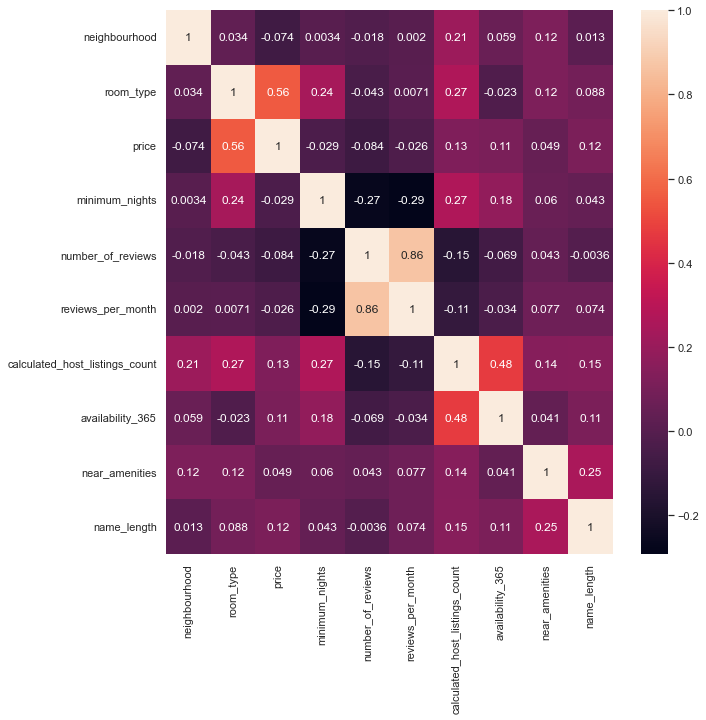

In [281]:
# final data AFTER subset
f,ax=plt.subplots(figsize=(10,10))
sns.heatmap(list_subset.corr(),annot=True)

Features of highest correlation belongs to reviews per month and number of reviews. This is expected as increased number of reviews would lead to increased reviews per momth. This correlation increased from 0.63 to 0.86.

The next highest correlation belongs to room type and price. From our analysis throughout, we have been able to guess that they have some correlation.

Availability 365 and calculated host listing count correlation has also increased quite a bit, from 0.25 to 0.48.

In [282]:
correlation_matrix = list_subset.corr()

def correlated_features():
    
    # Select upper triangle of correlation matrix
    upper = correlation_matrix.where(np.triu(np.ones(correlation_matrix.shape), k=1).astype(np.bool))

    # unstacking 'upper' correlation matrix and sorting it
    upper=upper.unstack().sort_values(ascending=True)

    # Highly Positive Correlated Variables
    high_correlation=upper[(upper>=0.75) & (upper<1) & (upper!='Nan')] # Threshold is greater than or equal  to 0.75 but less than 1 
    print("The highly positively correlated features in this dataset () and its value are:\n{}".format(high_correlation))
    print()
    
    # Moderately Positive Correlated Variables
    mild_correlation=upper[(upper>=0.5) & (upper<0.75) & (upper!='Nan')]
    print("Moderately positive correlated features in this dataset and its value are:\n{}".format(mild_correlation))
    print()

    # Highly to Moderately Negative Correlated Variables
    high_negative_correlation=upper[(upper < -0.5) & (upper!='Nan')]
    print("The highly negatively correlated variables in this dataset and its value are:\n{}".format(high_negative_correlation))
    
    
# call the function    
correlated_features()

The highly positively correlated features in this dataset () and its value are:
reviews_per_month  number_of_reviews    0.864694
dtype: float64

Moderately positive correlated features in this dataset and its value are:
price  room_type    0.555462
dtype: float64

The highly negatively correlated variables in this dataset and its value are:
Series([], dtype: float64)


C:\Users\chery\AppData\Local\Temp\ipykernel_16040\1332581057.py:6: DeprecationWarning: `np.bool` is a deprecated alias for the builtin `bool`. To silence this warning, use `bool` by itself. Doing this will not modify any behavior and is safe. If you specifically wanted the numpy scalar type, use `np.bool_` here.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  upper = correlation_matrix.where(np.triu(np.ones(correlation_matrix.shape), k=1).astype(np.bool))


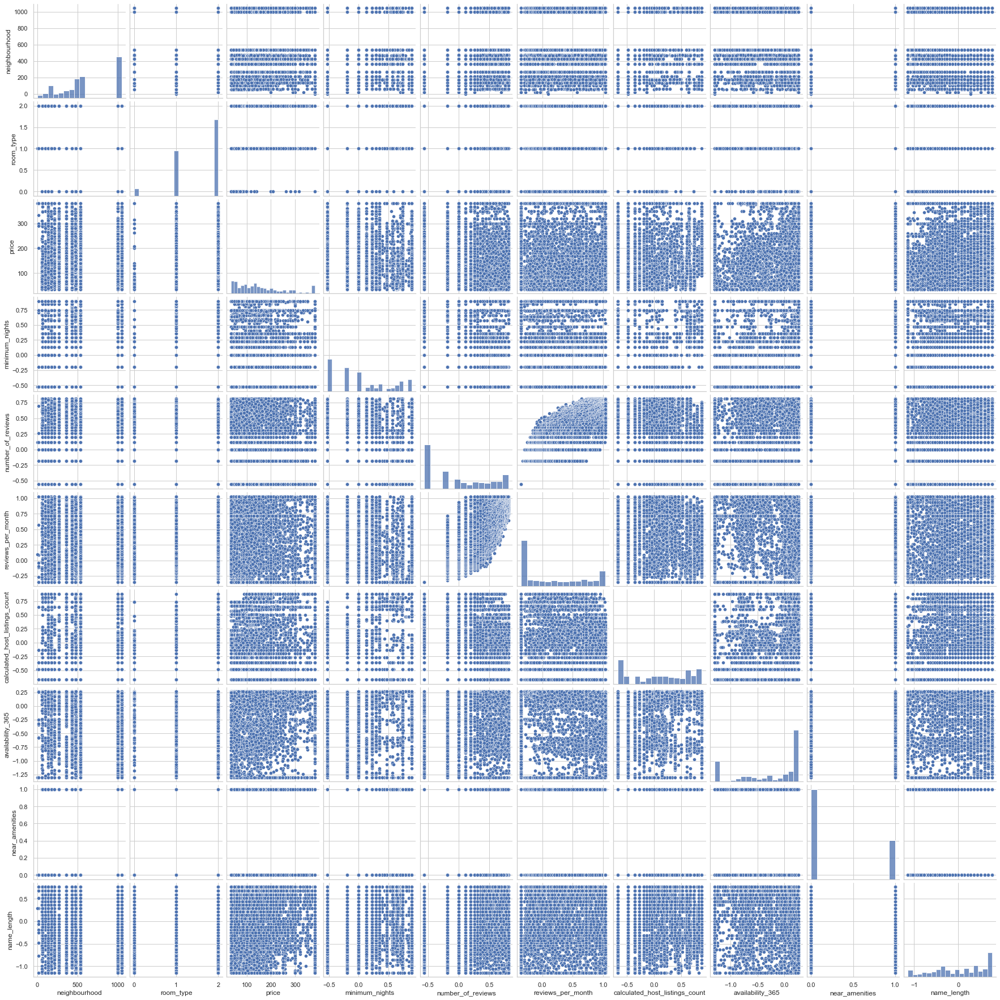

In [283]:
# PAIRPLOT
sns.pairplot(list_subset)

### Highest correlation

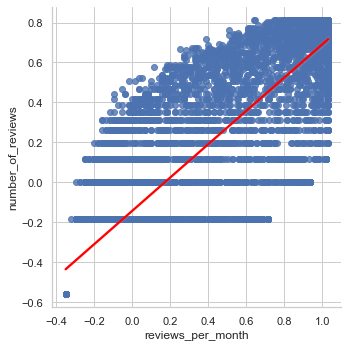

In [284]:
sns.lmplot(x='reviews_per_month', y='number_of_reviews', data=list_subset, line_kws={'color': 'red'})
plt.show()  # Display the plot

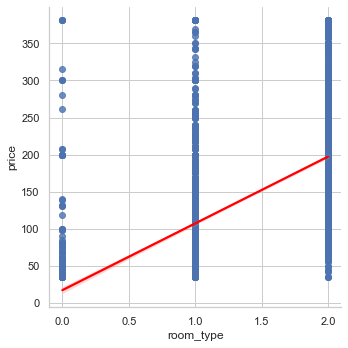

In [285]:
sns.lmplot(x='room_type', y='price', data=list_subset, line_kws={'color': 'red'})
plt.show()  # Display the plot

### Mildly High correlation

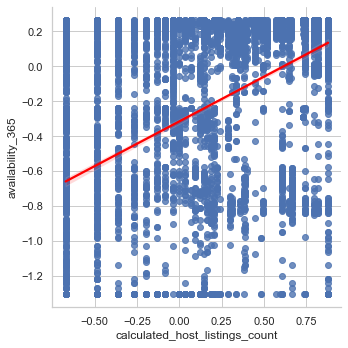

In [286]:
sns.lmplot(x='calculated_host_listings_count', y='availability_365', data=list_subset, line_kws={'color': 'red'})
plt.show()  # Display the plot

In summary, a moderate to high correlation between the room_type feature and the target variable (price) signifies a substantive relationship. Recognizing this correlation is pivotal in building an effective predictive model for Airbnb rental prices, as it highlights the importance of considering room types when estimating property values.

### 2.4 `Export the data`  <a id="part2.4"></a> 

In [287]:
target_variable = list_subset.pop('price')

# Move the target variable to the most right-hand side
list_subset['price'] = target_variable
list_subset.head()

,neighbourhood,room_type,minimum_nights,number_of_reviews,reviews_per_month,calculated_host_listings_count,availability_365,near_amenities,name_length,price
1,131,1,0.896522,0.578065,0.185608,-0.671031,0.262272,1,-0.536246,81.0
10,470,1,0.590371,0.578065,0.114405,0.398299,0.181909,0,0.764489,44.0
11,470,1,0.743611,0.442355,-0.094310,0.398299,0.042908,1,-0.194594,40.0
13,134,1,-0.193267,0.810679,0.823269,-0.134335,0.193970,1,-0.587071,65.0
14,470,1,0.743611,0.505309,-0.017948,0.398299,0.203556,0,-0.373309,44.0


In [288]:
# Write prepared data to csv file
# Enter your code here:
list_subset.to_csv('listings_new.csv', index=False)